In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import pickle
from os import listdir
from os.path import isfile, join

            

In [2]:
logdir='runs/2022-04-27_00-44-13_unseen_pair_random'
file_names = [f for f in listdir(logdir) if isfile(join(logdir, f))]

test_cases = {}
for f in file_names:
    if 'test' in f:
        n = f[:-3].split('_')
        seed, network, program = int(n[-1]), int(n[-3]), int(n[-5])
        if program in test_cases:
            if network in test_cases[program]:
                if seed not in test_cases[program][network]:
                    test_cases[program][network].append(seed)
            else:
                test_cases[program][network] = [seed]
        else:
            test_cases[program] = {}
            test_cases[program][network] = [seed]

data_id = pickle.load(open(join(logdir, 'data_para.pkl'), 'rb'))
eval_data = pickle.load(open(join(logdir, 'eval.pk'), 'rb'))
train_data = pickle.load(open(join(logdir, 'train.pk'), 'rb'))
            

P0, N1, S20


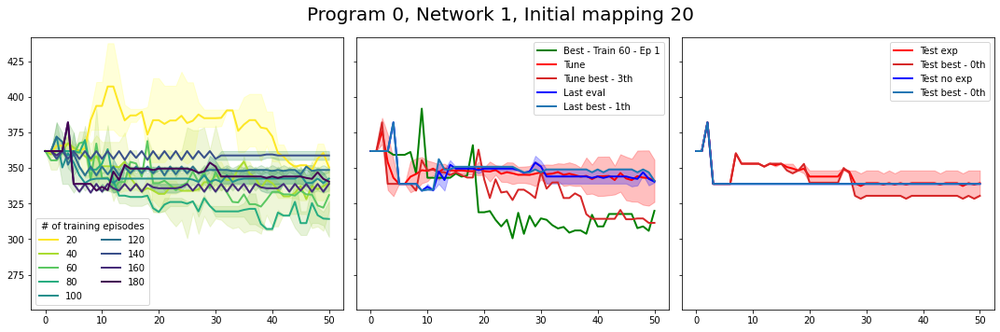

P0, N0, S20


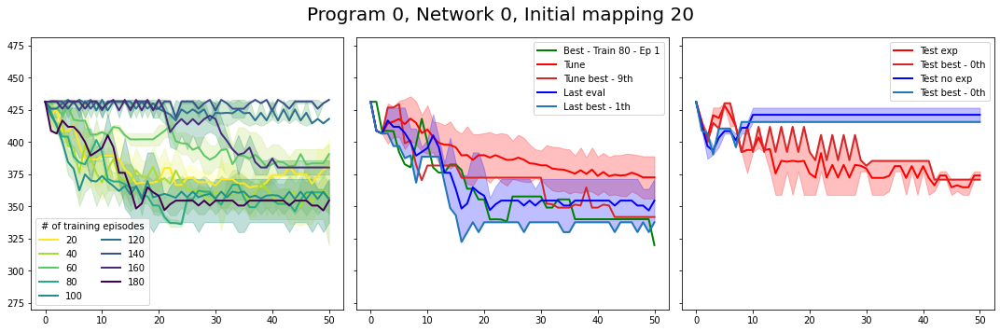

P1, N0, S20


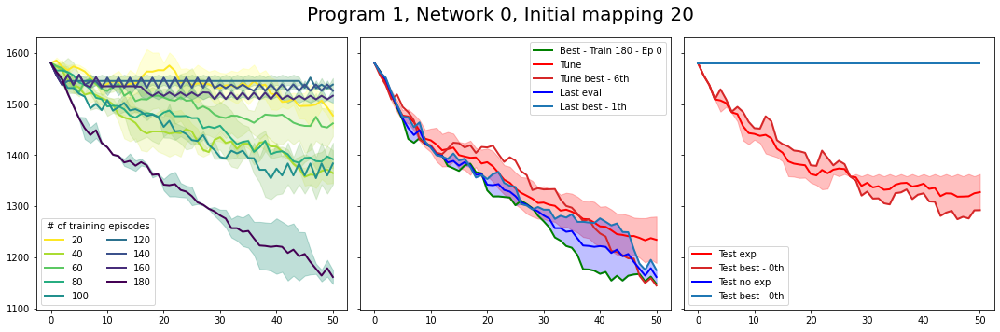

P1, N1, S20


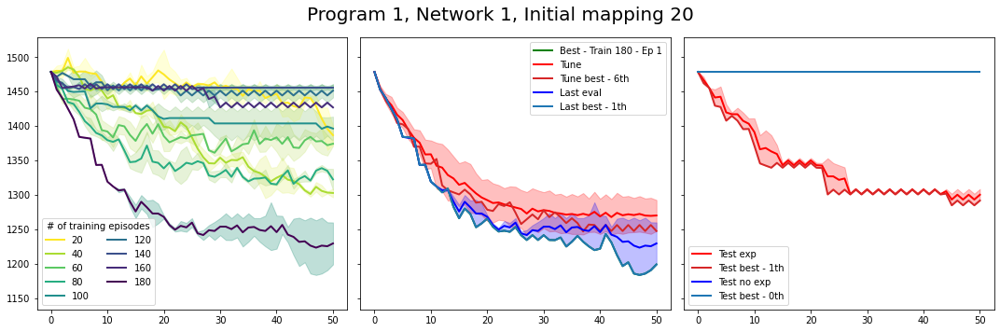

In [6]:
test_programs = data_id['test_program']
test_networks = data_id['test_network']

train_programs = data_id['train_program']
train_networks = data_id['train_network']

print(f'{len(train_programs)} test programs on {len(train_networks)}')
print(f'{len(test_programs)} test programs on {len(test_networks)}')

num_training_episode = 20 * len(train_data)

for test_program in test_cases:
    for test_network in test_cases[test_program]:
        for init_seed in test_cases[test_program][test_network]:
            print(f'P{test_program}, N{test_network}, S{init_seed}')
            fig, ax = plt.subplots(1,3, figsize=(15,5), sharex=True, sharey=True)
            e = [list(filter(lambda episode: 
                             episode['network_id'] == test_network and
                             episode['program_id'] == test_program and
                             episode['init_seed'] == init_seed, record)) for record in eval_data]
            latency = [[a['latency_trace'] for a in r] for r in e]
            reward = [[a['ep_return'] for a in r] for r in e]
            color_idx = np.linspace(0, 1, len(latency))
            legend = np.linspace(20, num_training_episode, len(latency)).astype(int)
            
            best_trace = latency[0][0]
            best_latency = np.amin(best_trace)
            best_label = f'Train 20 - Ep 1'
            for i, label, trace, rewards in zip(color_idx, legend, latency, reward):
                lat_train = np.array(trace)
                average = np.average(lat_train, axis=0)
                var = np.std(lat_train, axis=0)
                ax[0].plot(range(lat_train.shape[1]), average, linewidth=2, color=plt.cm.viridis_r(i), label=label)
                ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color=plt.cm.summer_r(i))
                
                cur_best = np.amin(lat_train)
                if cur_best < best_latency:
                    idx = np.where(lat_train==cur_best)
                    best_label = f'Train {label} - Ep {idx[0][0]}'
                    best_trace = trace[idx[0][0]]
                    best_latency = cur_best
                    
            leg = ax[0].legend(ncol=2)
            leg.set_title('# of training episodes')
            
            
            ax[1].plot(range(lat_train.shape[1]), best_trace, linewidth=2, color='green', label=f'Best - {best_label}')
            
            tune_data = f'tune_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            test_e = f'test_explore_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            test_n = f'test_noexp_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            
            
            tune_data = pickle.load(open(join(logdir, tune_data), 'rb'))
            test_e = pickle.load(open(join(logdir, test_e), 'rb'))
            test_n = pickle.load(open(join(logdir, test_n), 'rb'))
            
            lat_test = [episode['latency_trace'] for episode in tune_data]
            re = [a['ep_return'] for a in tune_data]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[1].plot(range(lat_train.shape[1]), average, linewidth=2, color='red', label='Tune')
            ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
            ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Tune best - {np.argmax(re)}th", color='tab:red',
             linewidth=2)
            
            lat_test = latency[-1]
            re = reward[-1]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[1].plot(range(lat_train.shape[1]), average, linewidth=2, color='blue', label='Last eval')
            ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
            ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Last best - {np.argmax(re)}th", color='tab:blue',
             linewidth=2)
            
            
            ax[1].legend()
            
            lat_test = [episode['latency_trace'] for episode in test_e]
            re = [a['ep_return'] for a in test_e]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[2].plot(range(lat_train.shape[1]), average, linewidth=2, color='red', label='Test exp')
            ax[2].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
            ax[2].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best - {np.argmax(re)}th", color='tab:red',
             linewidth=2)
            
            ax[2].set_ylim([np.amin(best_trace)-50, np.amax(best_trace)+50])
            
            
            lat_test = [episode['latency_trace'] for episode in test_n]
            re = [a['ep_return'] for a in test_n]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[2].plot(range(lat_train.shape[1]), average, linewidth=2, color='blue', label='Test no exp')
            ax[2].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
            ax[2].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best - {np.argmax(re)}th", color='tab:blue',
             linewidth=2)
            
            ax[2].legend()

            
            fig.suptitle(f'Program {test_program}, Network {test_network}, Initial mapping {init_seed}', fontsize=20)
            fig.tight_layout()
            plt.savefig(join(logdir, f'program_{test_program}_init_{init_seed}.jpg'))
            plt.show()

# 20 devices, 10 operators, same init mapping,  5 graphs

In [15]:
data_dir = 'data'
sub_dir = 'N_20_P_10_5P_same_init'

n_devices = [10, 20, 30]
n_operators = [10, 20, 30]
networks = {n: StarNetwork(*generate_network(n, seed=0)) for n in n_devices}
num_programs = 5

programs = {}
for n in n_devices:
    programs[n] = {}
    for m in n_operators:
        programs[n][m] = []
        for seed in range(num_programs):
            DAG, constraints = generate_program(m, n, seed=seed)
            programs[n][m].append(Program(DAG, constraints))

output_dim = 10

n_device = 20
n_program= 10
env = PlacementEnv([networks[n_device]], programs[n_device][n_program])

agent = PlacementAgent(env.get_node_feature_dim(), env.get_edge_feature_dim(), output_dim, output_dim, hidden_dim=32, lr=0.01)
num_iterations = 50
episode_per_program=20


program_ids = list(range(num_programs)) * episode_per_program
np.random.shuffle(program_ids)
network_ids = [0] * num_programs * episode_per_program
seeds = [0] * num_programs * episode_per_program

record = run_episodes(env,
                 agent,
                 program_ids,
                 network_ids,
                 seeds,
                 use_full_graph=True,
                 use_bip_connection=False,
                 explore=True,
                 max_iter=num_iterations,
                 use_baseline=True,
                 update_op_policy=False,
                 update_policy=True,
                 save_data=True,
                 save_dir=join(data_dir, sub_dir),
                 save_suffix='train',
                 noise=0)
torch.save(agent.full_policy.state_dict(), join(data_dir, sub_dir, 'policy.pk'))
torch.save(agent.full_embedding.state_dict(), join(data_dir, sub_dir, 'embedding.pk'))


{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}


/Users/yihu/opt/anaconda3/envs/default/lib/python3.8/site-packages/dgl/base.py:45: DGLWarning: The input graph for the user-defined edge function does not contain valid edges
  return warnings.warn(message, category=category, stacklevel=1)


[4, 13, 17, 11, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 11, 2, 12, 6, 8, 6, 16]
[4, 13, 17, 11, 2, 12, 6, 8, 2, 16]


KeyboardInterrupt: 

In [4]:
for i in range(5):
    agent.full_policy.load_state_dict(torch.load(join(data_dir, sub_dir, 'policy.pk')))
    agent.full_embedding.load_state_dict(torch.load(join(data_dir, sub_dir, 'embedding.pk')))

    run_episodes(env, agent, [i] * 10, [0] * 10, [0] * 10,
                               use_full_graph=True, use_bip_connection=False,
                               explore=True,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=True,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_tune',
                               noise=0)
    
    run_episodes(env, agent, [i] * 5, [0] * 5, [0] * 5,
                               use_full_graph=True, use_bip_connection=False,
                               explore=True,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=False,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_test_exp',
                               noise=0)
    
    run_episodes(env, agent, [i] * 5, [0] * 5, [0] * 5,
                               use_full_graph=True, use_bip_connection=False,
                               explore=False,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=False,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_test_no_exp',
                               noise=0)

{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 19, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 19, 6, 8, 4, 13, 19, 18, 3]
[13, 12, 19, 6, 8, 4, 1, 19, 18, 3]
[13, 2, 19, 6, 8, 4, 1, 19, 18, 3]
[13, 2, 19, 6, 8, 4, 18, 19, 18, 3]
[13, 2, 19, 6, 8, 4, 4, 19, 18, 3]
[13, 2, 19, 13, 8, 4, 4, 19, 18, 3]
[13, 2, 19, 13, 8, 4, 1, 19, 18, 3]
[13, 2, 19, 18, 8, 4, 1, 19, 18, 3]
[13, 2, 19, 18, 2, 4, 1, 19, 18, 3]
[13, 2, 19, 18, 2, 4, 4, 19, 18, 3]
[13, 2, 19, 18, 2, 4, 4, 8, 18, 3]
[13, 2, 19, 18, 2, 4, 4, 19, 18, 3]
[13, 2, 19, 18, 2, 4, 6, 19, 18, 3]
[13, 2, 19, 18, 2, 4, 1, 19, 18, 3]
[13, 2, 19, 18, 2, 4, 1, 19, 19, 3]
[13, 2, 19, 18, 2, 4, 1, 2, 19, 3]
[13, 2, 19, 18, 2, 4, 18, 2, 19, 3]
[13, 2, 19, 18, 2, 4, 18, 19, 19, 3]
[13, 2, 19, 18, 2, 4, 13, 19, 19, 3]
[13, 2, 19, 18, 2, 4, 13, 2, 19, 3]
[13, 2, 19, 18, 2, 4, 1, 2, 19, 3]
[13, 2, 19, 13, 2, 4, 1, 2, 19, 3]
[13, 2, 19, 13, 2, 4, 18, 2, 19, 3]
[13, 2, 19, 1

[13, 2, 19, 18, 17, 4, 4, 2, 18, 3]
[13, 2, 19, 18, 17, 4, 18, 2, 18, 3]
[13, 10, 19, 18, 17, 4, 18, 2, 18, 3]
[13, 10, 19, 18, 17, 4, 18, 19, 18, 3]
[13, 10, 19, 18, 19, 4, 18, 19, 18, 3]
[13, 10, 19, 18, 2, 4, 18, 19, 18, 3]
[13, 10, 19, 18, 2, 4, 18, 2, 18, 3]
[13, 10, 19, 18, 2, 4, 18, 8, 18, 3]
[13, 2, 19, 18, 2, 4, 18, 8, 18, 3]
[13, 2, 19, 18, 2, 4, 18, 2, 18, 3]
[13, 2, 19, 18, 2, 4, 18, 2, 2, 3]
[13, 2, 19, 18, 2, 4, 4, 2, 2, 3]
[13, 2, 19, 4, 2, 4, 4, 2, 2, 3]
[13, 2, 19, 1, 2, 4, 4, 2, 2, 3]
[13, 2, 19, 1, 2, 4, 13, 2, 2, 3]
[13, 2, 19, 1, 2, 4, 13, 19, 2, 3]
[13, 2, 2, 1, 2, 4, 13, 19, 2, 3]
[13, 2, 2, 1, 2, 4, 4, 19, 2, 3]
[13, 2, 2, 1, 2, 4, 18, 19, 2, 3]
[13, 2, 2, 1, 2, 4, 18, 19, 19, 3]
[13, 2, 2, 13, 2, 4, 18, 19, 19, 3]
[13, 2, 2, 13, 2, 4, 18, 2, 19, 3]
[13, 2, 2, 13, 19, 4, 18, 2, 19, 3]
[13, 2, 2, 13, 19, 4, 18, 19, 19, 3]
[13, 2, 19, 13, 19, 4, 18, 19, 19, 3]
[13, 2, 19, 13, 2, 4, 18, 19, 19, 3]
[13, 2, 19, 13, 2, 4, 18, 2, 19, 3]
[13, 2, 19, 13, 2, 4, 18, 19, 19

[13, 19, 2, 4, 19, 4, 4, 19, 2, 3]
[13, 19, 2, 13, 19, 4, 4, 19, 2, 3]
[13, 19, 2, 18, 19, 4, 4, 19, 2, 3]
[13, 19, 2, 18, 19, 4, 4, 19, 10, 3]
[13, 19, 2, 18, 19, 4, 13, 19, 10, 3]
[13, 19, 2, 18, 19, 4, 4, 19, 10, 3]
[13, 19, 2, 18, 19, 4, 4, 19, 2, 3]
[13, 19, 2, 18, 19, 4, 4, 2, 2, 3]
[13, 19, 2, 18, 19, 4, 4, 19, 2, 3]
[13, 19, 2, 18, 2, 4, 4, 19, 2, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 6, 2, 18, 3]
[13, 12, 0, 13, 8, 4, 6, 2, 18, 3]
[13, 12, 0, 13, 8, 4, 4, 2, 18, 3]
[13, 12, 0, 13, 8, 4, 4, 19, 18, 3]
[13, 19, 0, 13, 8, 4, 4, 19, 18, 3]
[13, 19, 0, 13, 8, 4, 4, 2, 18, 3]
[13, 19, 0, 18, 8, 4, 4, 2, 18, 3]
[13, 19, 0, 18, 19, 4, 4, 2, 18, 3]
[13, 2, 0, 18, 19, 4, 4, 2, 18, 3]
[13, 2, 0, 18, 0, 4, 4, 2, 18, 3]
[13, 2, 0, 18, 0, 4, 4, 0, 18, 3]
[13, 2, 0, 18, 0, 4, 4, 2, 18, 3]
[13, 2, 0, 18, 10, 4, 4, 2, 18, 3]
[13, 2, 0, 18, 10, 4, 1, 2, 18, 3]
[13, 2, 2, 18, 10, 4, 1, 2, 18, 3]
[13, 2, 2, 18, 10, 6, 1,

[13, 2, 10, 4, 2, 4, 4, 10, 18, 3]
[13, 2, 10, 4, 17, 4, 4, 10, 18, 3]
[13, 2, 10, 4, 17, 4, 4, 2, 18, 3]
[13, 2, 10, 4, 17, 4, 4, 10, 18, 3]
[13, 19, 10, 4, 17, 4, 4, 10, 18, 3]
[13, 19, 10, 4, 17, 4, 4, 10, 2, 3]
[13, 19, 10, 4, 19, 4, 4, 10, 2, 3]
[13, 19, 10, 4, 19, 4, 4, 19, 2, 3]
[13, 19, 10, 18, 19, 4, 4, 19, 2, 3]
[13, 19, 10, 18, 19, 4, 4, 2, 2, 3]
[13, 19, 10, 18, 19, 4, 4, 19, 2, 3]
[13, 19, 10, 18, 19, 4, 4, 10, 2, 3]
[13, 19, 10, 18, 19, 4, 4, 2, 2, 3]
[13, 19, 10, 18, 19, 4, 4, 19, 2, 3]
[13, 19, 10, 18, 19, 4, 4, 10, 2, 3]
[13, 19, 10, 13, 19, 4, 4, 10, 2, 3]
[13, 8, 10, 13, 19, 4, 4, 10, 2, 3]
[13, 8, 10, 13, 19, 4, 4, 10, 19, 3]
[13, 8, 10, 13, 19, 4, 13, 10, 19, 3]
[13, 8, 19, 13, 19, 4, 13, 10, 19, 3]
[13, 8, 19, 13, 10, 4, 13, 10, 19, 3]
[13, 8, 19, 4, 10, 4, 13, 10, 19, 3]
[13, 8, 19, 4, 2, 4, 13, 10, 19, 3]
[13, 8, 19, 4, 2, 4, 13, 19, 19, 3]
[13, 8, 19, 4, 2, 4, 13, 2, 19, 3]
[13, 8, 19, 4, 2, 4, 1, 2, 19, 3]
[13, 8, 19, 4, 2, 6, 1, 2, 19, 3]
[13, 8, 19, 4, 2, 6,

[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]

{'n_devices': 20, 'n_operators': 10, 'seed': 1, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 4, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 4, 16, 5, 11, 8, 18, 14, 16, 17]
[13, 4, 4, 5, 11, 8, 18, 14, 16, 17]
[13, 4, 4, 4, 11, 8, 18, 14, 16, 17]
[13, 4, 4, 4, 11, 8, 18, 4, 16, 17]
[13, 4, 4, 4, 11, 8, 18, 4, 18, 17]
[13, 4, 4, 4, 11, 4, 18, 4, 18, 17]
[13, 4, 4, 4, 11, 1, 18, 4, 18, 17]
[13, 4, 4, 4, 11, 13, 18, 4, 18, 17]
[13, 4, 4, 4, 11, 4, 18, 4, 18, 17]
[13, 13, 4, 4, 11, 4, 18, 4, 18, 17]
[13, 13, 4, 1, 11, 4, 18, 4, 18, 17]
[13, 13, 13, 1, 11, 4, 18, 4, 18, 17]
[13, 13, 13, 1, 11, 4, 18, 17, 18, 17]
[13, 13, 13, 1, 11, 13, 18, 17, 18, 17]
[13, 13, 13, 13, 11, 13, 18, 17, 18, 17]
[13, 13, 13, 13, 11, 13, 18, 13, 18, 17]
[13, 13, 13, 1, 11, 13, 18, 13, 18, 17]
[13, 13, 13, 13, 11, 13, 18, 13, 18, 17]
[13, 13, 13, 13, 11, 6, 18, 13, 18, 17]
[13, 13, 13, 13, 11, 4, 18, 13, 18, 17]
[13, 13, 13, 13, 11, 13, 18, 13, 18, 17]
[13, 13, 13, 13, 11, 13, 18, 4, 18, 17]
[13, 13, 13, 8, 11, 13, 18,

[13, 13, 13, 5, 11, 8, 18, 13, 16, 17]
[13, 13, 13, 5, 11, 13, 18, 13, 16, 17]
[13, 13, 13, 5, 11, 1, 18, 13, 16, 17]
[13, 13, 13, 5, 11, 1, 18, 13, 0, 17]
[13, 13, 13, 4, 11, 1, 18, 13, 0, 17]
[13, 13, 13, 4, 11, 13, 18, 13, 0, 17]
[13, 13, 13, 0, 11, 13, 18, 13, 0, 17]
[13, 13, 13, 0, 0, 13, 18, 13, 0, 17]
[13, 4, 13, 0, 0, 13, 18, 13, 0, 17]
[13, 4, 13, 0, 0, 13, 18, 13, 18, 17]
[13, 4, 13, 6, 0, 13, 18, 13, 18, 17]
[13, 4, 13, 8, 0, 13, 18, 13, 18, 17]
[13, 4, 1, 8, 0, 13, 18, 13, 18, 17]
[13, 4, 1, 8, 0, 13, 18, 0, 18, 17]
[13, 4, 1, 4, 0, 13, 18, 0, 18, 17]
[13, 4, 1, 4, 17, 13, 18, 0, 18, 17]
[13, 4, 1, 13, 17, 13, 18, 0, 18, 17]
[13, 4, 1, 13, 17, 6, 18, 0, 18, 17]
[13, 4, 1, 13, 17, 6, 18, 17, 18, 17]
[13, 4, 1, 13, 17, 4, 18, 17, 18, 17]
[13, 4, 1, 13, 17, 1, 18, 17, 18, 17]
[13, 4, 4, 13, 17, 1, 18, 17, 18, 17]
[13, 4, 4, 6, 17, 1, 18, 17, 18, 17]
[13, 13, 4, 6, 17, 1, 18, 17, 18, 17]
[13, 13, 4, 13, 17, 1, 18, 17, 18, 17]
[13, 13, 4, 13, 17, 1, 18, 1, 18, 17]
[13, 13, 4, 13

[13, 13, 13, 1, 5, 13, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 13, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 4, 18, 13, 18, 17]
[13, 13, 13, 13, 5, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 5, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 1, 18, 13, 18, 17]
[13, 13, 13, 1, 5, 1, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 1, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 13, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 13, 18, 1, 18, 17]
[13, 13, 13, 4, 5, 13, 18, 4, 18, 17]
[13, 13, 13, 4, 5, 4, 18, 4, 18, 17]
[13, 13, 1, 4, 5, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 5, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 5, 4, 18, 1, 18, 17]
[13, 13, 13, 13, 5, 4, 18, 1, 18, 17]
[13, 13, 13, 13, 5, 4, 18, 13, 18, 17]
[13, 13, 13, 13, 5, 4, 18, 1, 18, 17]
[13, 13, 13, 13, 5, 13, 18, 1, 18, 17]
[13, 13, 13, 13, 5, 13, 18, 13, 18, 17]
[13, 13, 13, 13, 5, 1, 18, 13, 18, 17]
[13, 13, 13, 13, 5, 13, 18, 13, 18, 17]
[13, 13, 13, 4, 5, 13, 18, 13, 18, 17]
[13, 13, 13, 13, 5, 13, 18, 13, 18, 17]
[13,

[13, 13, 13, 4, 5, 13, 18, 4, 18, 17]
[13, 13, 13, 4, 5, 13, 18, 4, 0, 17]
[13, 13, 13, 0, 5, 13, 18, 4, 0, 17]
[13, 13, 13, 0, 0, 13, 18, 4, 0, 17]
[13, 13, 13, 0, 0, 13, 18, 0, 0, 17]
[13, 13, 13, 0, 0, 4, 18, 0, 0, 17]
[13, 13, 13, 0, 0, 13, 18, 0, 0, 17]
[13, 13, 13, 13, 0, 13, 18, 0, 0, 17]
[13, 13, 13, 0, 0, 13, 18, 0, 0, 17]
[13, 4, 13, 0, 0, 13, 18, 0, 0, 17]
[13, 4, 13, 0, 0, 4, 18, 0, 0, 17]
[13, 1, 13, 0, 0, 4, 18, 0, 0, 17]
[13, 1, 13, 0, 0, 4, 18, 0, 18, 17]
[13, 1, 13, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 1, 18, 17]
[13, 13, 13, 4, 0, 13, 18, 1, 18, 17]
[13, 13, 13, 4, 0, 13, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 6, 18, 0, 18, 17]
[13, 13, 13, 1, 0, 6, 18, 0, 18, 17]
[13, 13, 13, 1, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 13, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 13, 18, 0, 18, 17]
[13, 13, 18, 4, 0, 13, 18, 0, 18, 17]

[13, 13, 13, 5, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18, 4, 16, 17]
[13, 13, 13, 13, 11, 4, 18

[9, 2, 13, 10, 13, 2, 9, 16, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 16, 2, 9]
[9, 2, 8, 4, 13, 2, 9, 16, 2, 9]
[9, 2, 8, 8, 13, 2, 9, 16, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 2, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[9, 2, 8, 8, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 8, 9, 11, 5, 6, 14, 9]
[9, 2, 8, 8, 9, 11, 5, 6, 2, 9]
[9, 2, 8, 8, 13, 11, 5, 6, 2, 9]
[9, 2, 8, 8, 13, 2, 5, 6, 2, 9]
[9, 2, 8, 6, 13, 2, 5, 6, 2, 9]
[9, 2, 8, 6, 13, 2, 19, 6, 2, 9]
[9, 2, 8, 6, 13, 2, 9, 6, 2, 9]
[9, 2, 8, 6, 13, 2, 9, 9, 2, 9]
[9, 2, 8, 19, 13, 2, 9, 9, 2, 9]
[9, 2, 8, 6, 13, 2, 9, 9, 2, 9]
[9, 2, 19, 6, 13, 2, 9, 9, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 9, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 9, 2, 9]
[9, 2, 13, 6, 13, 2, 9, 9, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 9, 2, 9]
[9, 2, 13, 6, 13, 2, 9, 9, 2, 9]
[9, 2, 19, 6, 13, 2, 9, 9, 2, 9]
[9, 2, 1, 6, 13, 2, 9, 9, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 9, 2, 9]
[9, 2, 8, 4, 13, 2, 9, 9, 2, 9]
[9, 2, 8, 10, 13, 2, 9, 9, 2, 9]
[9, 2, 8, 10, 1, 2, 9, 9, 2, 9]
[9, 2, 8, 18, 1, 2, 9, 

[9, 2, 13, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 10, 2, 9]
[9, 2, 13, 10, 13, 2, 9, 10, 2, 9]
[9, 2, 13, 10, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 8, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 8, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 1, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 1, 2, 9]
[9, 2, 1, 4, 13, 2, 8, 1, 2, 9]
[9, 2, 13, 4, 13, 2, 8, 1, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 19, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 19, 17, 2, 9, 1, 2, 9]
[9, 2, 13, 19, 17, 2, 9, 6, 2, 9]
[9, 2, 13, 18, 17, 2, 9, 6, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 2, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[9, 2, 8, 4, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 4, 9, 11, 5, 13, 14, 9]
[9, 2, 8, 4, 9, 11, 9, 13, 14, 9]
[9, 2, 19, 4, 9, 11, 9, 13, 14, 9]
[9, 2, 19, 4, 9, 11, 4, 13, 14, 9]
[9, 2, 19, 4, 9, 11, 19, 13, 14, 9]


[9, 2, 1, 18, 1, 2, 9, 9, 14, 9]
[9, 2, 1, 19, 1, 2, 9, 9, 14, 9]
[9, 2, 1, 19, 13, 2, 9, 9, 14, 9]
[9, 2, 1, 18, 13, 2, 9, 9, 14, 9]
[9, 2, 1, 18, 1, 2, 9, 9, 14, 9]
[9, 2, 1, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 1, 18, 1, 2, 9, 4, 2, 9]
[9, 2, 1, 18, 1, 2, 9, 13, 2, 9]
[9, 2, 1, 18, 1, 2, 9, 1, 2, 9]
[9, 2, 0, 18, 1, 2, 9, 1, 2, 9]
[9, 2, 1, 18, 1, 2, 9, 1, 2, 9]
[9, 2, 19, 18, 1, 2, 9, 1, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 1, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 19, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 8, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 13, 18, 1, 2, 19, 9, 2, 9]
[9, 2, 13, 18, 1, 2, 0, 9, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 13, 4, 1, 2, 9, 9, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 1, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 1, 4, 1, 2, 9, 9, 2, 9]
[9, 2, 1, 4, 17, 2, 9, 9, 2, 9]
[9, 2, 1, 4, 17, 2, 9, 13, 2, 9]
[9, 2, 1, 4, 17, 2, 9, 9, 2, 9]
[9, 2, 1, 10, 17, 2, 9, 9, 2, 9]
[9, 2, 19, 10, 17, 2, 9, 9, 2, 9]
[9, 2, 19, 6, 17, 

[9, 2, 8, 19, 9, 11, 5, 12, 2, 9]
[9, 2, 8, 19, 9, 11, 9, 12, 2, 9]
[9, 2, 8, 19, 9, 11, 9, 6, 2, 9]
[9, 2, 8, 18, 9, 11, 9, 6, 2, 9]
[9, 2, 8, 18, 13, 11, 9, 6, 2, 9]
[9, 2, 8, 18, 13, 11, 9, 4, 2, 9]
[9, 2, 1, 18, 13, 11, 9, 4, 2, 9]
[9, 2, 1, 4, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 4, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 19, 6, 1, 2, 9, 4, 2, 9]
[9, 2, 16, 6, 1, 2, 9, 4, 2, 9]
[9, 2, 16, 6, 1, 2, 9, 4, 2, 9]
[9, 2, 16, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 8, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 8, 19, 1, 2, 9, 18, 2, 9]
[9, 2, 8, 19, 1, 2, 9, 1, 2, 9]
[9, 2, 8, 4, 1, 2, 9, 1, 2, 9]
[9, 2, 8, 18, 1, 2, 9, 1, 2, 9]
[9, 2, 8, 10, 1, 2, 9, 1, 2, 9]
[9, 2, 1, 10, 1, 2, 9, 1, 2, 9]
[9, 2, 1, 10, 1, 2, 9, 1, 2, 9]
[9, 2, 19, 10, 1, 2, 9, 1, 2, 9]
[9, 2, 19, 10, 13, 2, 9, 1, 2, 9]
[9, 2, 19, 6, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 6, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 1, 2, 9]
[9, 2, 13, 18,

[4, 2, 17, 4, 13, 13, 18, 2, 13, 16]
[4, 2, 17, 4, 13, 13, 18, 2, 18, 16]
[4, 2, 17, 18, 13, 13, 18, 2, 18, 16]
[4, 2, 17, 4, 13, 13, 18, 2, 18, 16]
[4, 2, 17, 4, 2, 13, 18, 2, 18, 16]
[4, 2, 17, 4, 2, 13, 19, 2, 18, 16]
[4, 2, 17, 4, 2, 13, 19, 2, 2, 16]
[4, 2, 17, 4, 2, 13, 4, 2, 2, 16]
[4, 2, 17, 4, 2, 13, 4, 2, 4, 16]
[4, 2, 17, 1, 2, 13, 4, 2, 4, 16]
[4, 2, 17, 1, 2, 2, 4, 2, 4, 16]
[4, 2, 17, 1, 2, 13, 4, 2, 4, 16]
[4, 2, 17, 1, 2, 13, 1, 2, 4, 16]
[4, 2, 17, 1, 2, 13, 1, 2, 2, 16]
[4, 2, 17, 1, 2, 2, 1, 2, 2, 16]
[4, 2, 17, 6, 2, 2, 1, 2, 2, 16]
[4, 2, 17, 6, 2, 2, 1, 2, 1, 16]
[4, 2, 17, 6, 2, 2, 4, 2, 1, 16]
[4, 2, 17, 6, 2, 2, 4, 2, 2, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 12, 6, 8, 6, 16]
[4, 13, 17, 9, 2, 12, 1, 8, 6, 16]
[4, 13, 17, 9, 2, 2, 1, 8, 6, 16]
[4, 13, 17, 18, 2, 2, 1, 8, 6, 16]
[4, 13, 17, 18, 2, 2, 1, 8, 2, 16]
[4, 13, 17, 18, 2, 2, 1, 8, 19, 16]
[4, 13, 17, 18, 2, 2, 1, 8, 1, 16]
[4, 13

[4, 2, 17, 4, 2, 12, 6, 8, 12, 16]
[4, 2, 17, 4, 2, 2, 6, 8, 12, 16]
[4, 2, 17, 19, 2, 2, 6, 8, 12, 16]
[4, 2, 17, 19, 2, 2, 6, 8, 4, 16]
[4, 2, 17, 19, 2, 2, 6, 2, 4, 16]
[4, 2, 17, 1, 2, 2, 6, 2, 4, 16]
[4, 2, 17, 1, 2, 2, 19, 2, 4, 16]
[4, 2, 17, 1, 2, 2, 4, 2, 4, 16]
[4, 2, 17, 1, 8, 2, 4, 2, 4, 16]
[4, 2, 17, 1, 8, 2, 19, 2, 4, 16]
[4, 2, 17, 1, 2, 2, 19, 2, 4, 16]
[4, 2, 17, 1, 13, 2, 19, 2, 4, 16]
[4, 2, 17, 1, 13, 2, 18, 2, 4, 16]
[4, 2, 17, 19, 13, 2, 18, 2, 4, 16]
[4, 2, 17, 19, 13, 2, 18, 2, 19, 16]
[4, 2, 17, 19, 8, 2, 18, 2, 19, 16]
[4, 2, 17, 19, 8, 2, 18, 2, 1, 16]
[4, 2, 17, 19, 8, 2, 1, 2, 1, 16]
[4, 8, 17, 19, 8, 2, 1, 2, 1, 16]
[4, 8, 17, 19, 8, 8, 1, 2, 1, 16]
[4, 8, 17, 18, 8, 8, 1, 2, 1, 16]
[4, 8, 17, 18, 8, 8, 1, 2, 4, 16]
[4, 8, 17, 1, 8, 8, 1, 2, 4, 16]
[4, 8, 17, 1, 8, 8, 1, 2, 1, 16]
[4, 8, 17, 4, 8, 8, 1, 2, 1, 16]
[4, 8, 17, 4, 8, 8, 1, 2, 19, 16]
[4, 8, 17, 4, 8, 8, 19, 2, 19, 16]
[4, 8, 17, 4, 8, 8, 19, 2, 18, 16]
[4, 8, 17, 4, 8, 8, 1, 2, 18, 16]
[4, 8,

[4, 2, 17, 1, 8, 8, 19, 13, 4, 16]
[4, 2, 17, 1, 8, 8, 1, 13, 4, 16]
[4, 2, 17, 18, 8, 8, 1, 13, 4, 16]
[4, 2, 17, 18, 8, 8, 1, 13, 19, 16]
[4, 2, 17, 18, 8, 8, 1, 13, 2, 16]
[4, 2, 17, 18, 8, 8, 1, 12, 2, 16]
[4, 2, 17, 18, 8, 8, 1, 12, 19, 16]
[4, 13, 17, 18, 8, 8, 1, 12, 19, 16]
[4, 13, 17, 4, 8, 8, 1, 12, 19, 16]
[4, 13, 17, 4, 8, 8, 18, 12, 19, 16]
[4, 13, 17, 19, 8, 8, 18, 12, 19, 16]
[4, 13, 17, 19, 8, 8, 1, 12, 19, 16]
[4, 13, 17, 4, 8, 8, 1, 12, 19, 16]
[4, 13, 17, 4, 8, 8, 18, 12, 19, 16]
[4, 13, 17, 4, 8, 8, 18, 12, 18, 16]
[4, 13, 17, 4, 8, 8, 18, 2, 18, 16]
[4, 13, 17, 4, 8, 8, 1, 2, 18, 16]
[4, 13, 17, 4, 13, 8, 1, 2, 18, 16]
[4, 13, 17, 1, 13, 8, 1, 2, 18, 16]
[4, 13, 17, 1, 13, 2, 1, 2, 18, 16]
[4, 2, 17, 1, 13, 2, 1, 2, 18, 16]
[4, 2, 17, 1, 2, 2, 1, 2, 18, 16]
[4, 2, 17, 1, 13, 2, 1, 2, 18, 16]
[4, 2, 17, 4, 13, 2, 1, 2, 18, 16]
[4, 2, 17, 4, 13, 2, 18, 2, 18, 16]
[4, 2, 10, 4, 13, 2, 18, 2, 18, 16]
[4, 2, 10, 4, 2, 2, 18, 2, 18, 16]
[4, 2, 10, 4, 13, 2, 18, 2, 18, 16

[4, 2, 0, 1, 13, 13, 19, 2, 19, 16]
[4, 2, 0, 1, 13, 13, 19, 13, 19, 16]
[4, 2, 0, 1, 13, 13, 19, 2, 19, 16]
[4, 2, 0, 1, 13, 13, 18, 2, 19, 16]
[4, 2, 0, 1, 13, 13, 18, 2, 4, 16]
[4, 2, 0, 19, 13, 13, 18, 2, 4, 16]
[4, 2, 10, 19, 13, 13, 18, 2, 4, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 2, 6, 8, 12, 16]
[4, 13, 17, 4, 2, 2, 6, 8, 12, 16]
[4, 13, 17, 4, 2, 2, 6, 8, 2, 16]
[4, 13, 17, 6, 2, 2, 6, 8, 2, 16]
[4, 13, 17, 6, 2, 2, 6, 8, 13, 16]
[4, 13, 17, 18, 2, 2, 6, 8, 13, 16]
[4, 13, 17, 18, 2, 2, 6, 8, 8, 16]
[4, 13, 17, 4, 2, 2, 6, 8, 8, 16]
[4, 13, 17, 4, 2, 2, 6, 8, 6, 16]
[4, 13, 17, 4, 2, 2, 6, 13, 6, 16]
[4, 13, 17, 6, 2, 2, 6, 13, 6, 16]
[4, 13, 17, 6, 2, 2, 6, 13, 6, 16]
[4, 13, 17, 6, 2, 2, 6, 2, 6, 16]
[4, 13, 17, 6, 2, 2, 6, 2, 4, 16]
[4, 13, 17, 18, 2, 2, 6, 2, 4, 16]
[4, 13, 17, 18, 8, 2, 6, 2, 4, 16]
[4, 13, 17, 18, 8, 2, 19, 2, 4, 16]
[4, 13, 17, 18, 8, 2, 19, 2, 4, 16]
[4, 13, 17, 18, 8, 2, 19, 2, 

[4, 13, 17, 1, 2, 2, 6, 8, 19, 16]
[4, 13, 17, 18, 2, 2, 6, 8, 19, 16]
[4, 15, 17, 18, 2, 2, 6, 8, 19, 16]
[4, 15, 17, 1, 2, 2, 6, 8, 19, 16]
[4, 15, 17, 19, 2, 2, 6, 8, 19, 16]
[4, 15, 17, 19, 2, 2, 6, 13, 19, 16]
[4, 13, 17, 19, 2, 2, 6, 13, 19, 16]
[4, 13, 17, 19, 2, 2, 19, 13, 19, 16]
[4, 13, 17, 19, 2, 2, 19, 9, 19, 16]
[4, 13, 17, 19, 13, 2, 19, 9, 19, 16]
[4, 13, 17, 4, 13, 2, 19, 9, 19, 16]
[4, 13, 17, 4, 2, 2, 19, 9, 19, 16]
[4, 13, 17, 4, 2, 2, 19, 2, 19, 16]
[4, 13, 17, 4, 8, 2, 19, 2, 19, 16]
[4, 13, 17, 4, 8, 13, 19, 2, 19, 16]
[4, 13, 17, 4, 8, 2, 19, 2, 19, 16]
[4, 13, 17, 19, 8, 2, 19, 2, 19, 16]
[4, 13, 17, 19, 2, 2, 19, 2, 19, 16]
[4, 13, 17, 4, 2, 2, 19, 2, 19, 16]
[4, 13, 17, 19, 2, 2, 19, 2, 19, 16]
[4, 13, 17, 19, 2, 2, 18, 2, 19, 16]
[4, 13, 17, 4, 2, 2, 18, 2, 19, 16]
[4, 13, 17, 4, 2, 2, 18, 2, 6, 16]
[4, 13, 17, 4, 13, 2, 18, 2, 6, 16]
[4, 13, 17, 4, 13, 2, 4, 2, 6, 16]
[4, 13, 17, 4, 13, 2, 4, 2, 6, 16]
[4, 13, 17, 4, 13, 2, 4, 8, 6, 16]
[4, 13, 17, 4, 2, 2, 

[8, 6, 6, 6, 10, 4, 19, 2, 19, 1]
[8, 6, 6, 6, 10, 17, 19, 2, 19, 1]
[8, 6, 6, 6, 10, 17, 6, 2, 19, 1]
[8, 6, 6, 13, 10, 17, 6, 2, 19, 1]
[8, 6, 6, 13, 10, 17, 6, 6, 19, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 6, 3, 6, 6, 11, 1]
[8, 2, 2, 6, 6, 3, 6, 6, 11, 1]
[8, 2, 2, 6, 6, 3, 6, 6, 19, 1]
[8, 2, 2, 6, 6, 3, 6, 2, 19, 1]
[8, 2, 2, 6, 2, 3, 6, 2, 19, 1]
[8, 2, 2, 6, 2, 3, 19, 2, 19, 1]
[8, 2, 2, 6, 2, 3, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 3, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 13, 6, 2, 19, 1]
[8, 2, 2, 2, 2, 13, 6, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 6, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 6, 1, 13, 2, 2, 19, 1]
[8, 2, 2, 6, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 6, 1, 13, 2, 2, 19, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 19, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4,

[8, 6, 6, 6, 10, 4, 2, 2, 18, 1]
[8, 2, 6, 6, 10, 4, 2, 2, 18, 1]
[8, 2, 6, 6, 10, 4, 2, 2, 19, 1]
[8, 2, 6, 6, 10, 4, 18, 2, 19, 1]
[8, 2, 6, 6, 6, 4, 18, 2, 19, 1]
[8, 2, 6, 6, 6, 4, 18, 2, 18, 1]
[8, 2, 6, 6, 6, 4, 18, 2, 19, 1]
[8, 2, 2, 6, 6, 4, 18, 2, 19, 1]
[8, 2, 2, 6, 2, 4, 18, 2, 19, 1]
[8, 2, 2, 6, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 6, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 8, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 8, 4, 6, 2, 19, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 2, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 2, 3, 7, 2, 11, 1]
[8, 15, 2, 6, 2, 3, 7, 2, 19, 1]
[8, 15, 15, 6, 2, 3, 7, 2, 19, 1]
[8, 15, 15, 6, 2, 3, 2, 2, 19, 1]
[8, 2, 15, 6, 2, 3, 2, 2, 19, 1]
[8, 2, 15, 6, 2, 13, 2, 2, 19, 1]
[8, 2, 2, 6, 2, 13, 2, 2, 19, 1]
[8, 2, 2, 6, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 6, 2, 2, 2, 13, 2

[8, 2, 2, 15, 6, 13, 18, 2, 18, 1]
[8, 2, 2, 2, 6, 13, 18, 2, 18, 1]
[8, 2, 2, 2, 6, 13, 19, 2, 18, 1]
[8, 2, 2, 2, 6, 13, 6, 2, 18, 1]
[8, 2, 2, 2, 6, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 6, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 6, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 10, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 4, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 8, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 8, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 4, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 13, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 13, 2, 13, 2, 6, 18, 1]
[8, 2, 2, 13, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 13, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 6, 19, 1]
[8, 2,

[8, 15, 2, 4, 2, 3, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 3, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 6, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 6, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 6, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 6, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 18, 2, 18, 1]
[8, 2,

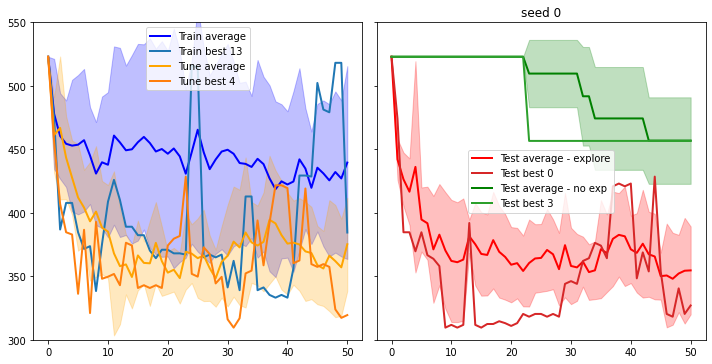

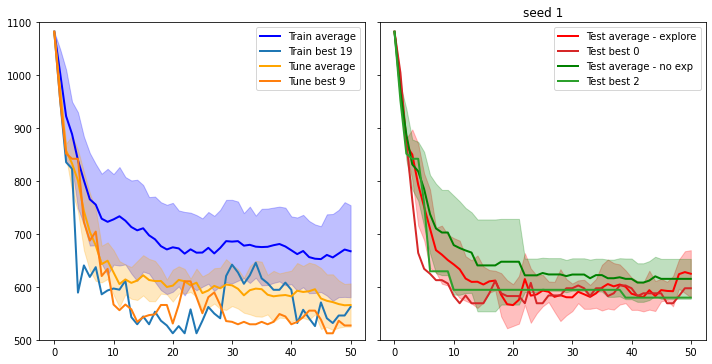

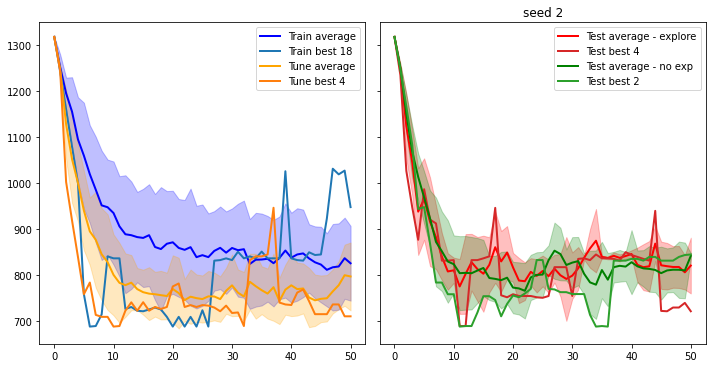

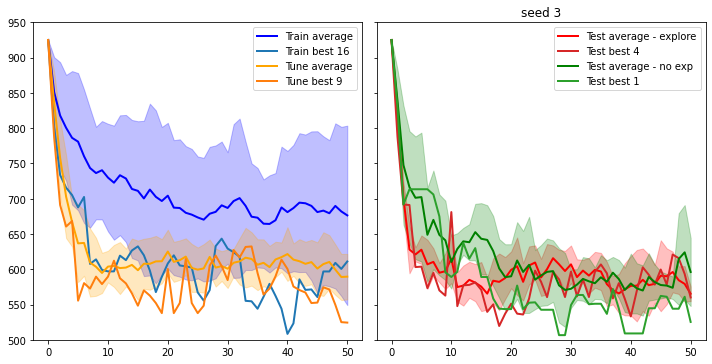

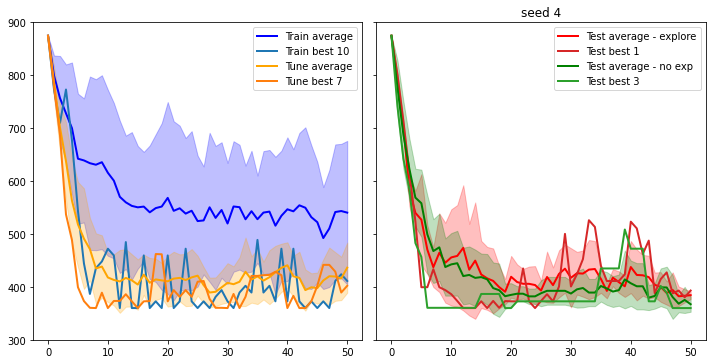

In [27]:
from os import listdir
from os.path import isfile, join

data_dir = 'data'
sub_dir = 'N_20_P_10_5P_same_init'
data_folder = join(data_dir, sub_dir)
record = pickle.load(open(join(data_folder, 'full_graph_2022-04-20_12-00-11_train.pk'), 'rb'))

file_names = [join(data_folder, f) for f in listdir(data_folder) if isfile(join(data_folder, f))]
y_range = {
    0: (300, 550),
    1: (500, 1100),
    2: (650, 1350),
    3: (500, 950),
    4: (300, 900)
}
for i in range(5):
    fig, ax = plt.subplots(1, 2, figsize=(10,5), sharey=True, sharex=True)
    
    train_date = list(filter(lambda data: data['seed'] == i, record))
    lat_train = np.array([episode['latency_trace'] for episode in train_date])
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[0].plot(range(lat_train.shape[1]), average, label="Train average", color='blue', linewidth=2)
    ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Train best {np.argmax(re)}", color='tab:blue',
             linewidth=2)
    ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
    

    tune_data = f'id_{i}_tune'
    test1_data = f'id_{i}_test_exp'
    test2_data = f'id_{i}_test_no_exp'
    
    for f in file_names:
        if tune_data in f:
            tune_data = f
            continue
        if test1_data in f:
            test1_data = f
            continue
        if test2_data in f:
            test2_data = f
            continue

    record_test = pickle.load(open(tune_data, 'rb'))
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[0].plot(range(lat_train.shape[1]), average, label="Tune average", color='orange', linewidth=2)
    ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Tune best {np.argmax(re)}", color='tab:orange',
             linewidth=2)
    ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='orange')
    
    
    record_test = pickle.load(open(test1_data, 'rb'))
    
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[1].plot(range(lat_train.shape[1]), average, label="Test average - explore", color='red', linewidth=2)
    ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best {np.argmax(re)}", color='tab:red',
             linewidth=2)
    ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
    
    ax[1].set_ylim(y_range[i])
    
    record_test = pickle.load(open(test2_data, 'rb'))
    
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[1].plot(range(lat_train.shape[1]), average, label="Test average - no exp", color='green', linewidth=2)
    ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best {np.argmax(re)}", color='tab:green',
             linewidth=2)
    ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='green')

    ax[0].legend()
    ax[1].legend()
    fig.tight_layout()
    plt.title(f'seed {i}')
    plt.savefig(join(data_folder, f'Program {i}.png'))
    plt.show()


# 20 devices, 10 operators, same init mapping,  10 graphs

In [10]:
data_dir = 'data'
sub_dir = 'N_20_P_10_10P_same_init'
n_devices = [10, 20, 30]
n_operators = [10, 20, 30]
networks = {n: StarNetwork(*generate_network(n, seed=0)) for n in n_devices}
num_programs = 10

programs = {}
for n in n_devices:
    programs[n] = {}
    for m in n_operators:
        programs[n][m] = []
        for seed in range(num_programs):
            DAG, constraints = generate_program(m, n, seed=seed)
            programs[n][m].append(Program(DAG, constraints))

output_dim = 10

n_device = 20
n_program= 10
env = PlacementEnv([networks[n_device]], programs[n_device][n_program])

agent = PlacementAgent(env.get_node_feature_dim(), env.get_edge_feature_dim(), output_dim, output_dim, hidden_dim=32, lr=0.01)
num_iterations = 50
episode_per_program=10

program_ids = list(range(num_programs)) * episode_per_program
np.random.shuffle(program_ids)
network_ids = [0] * num_programs * episode_per_program
seeds = [0] * num_programs * episode_per_program

record = run_episodes(env,
                 agent,
                 program_ids,
                 network_ids,
                 seeds,
                 use_full_graph=True,
                 use_bip_connection=False,
                 explore=True,
                 max_iter=num_iterations,
                 use_baseline=True,
                 update_op_policy=False,
                 update_policy=True,
                 save_data=True,
                 save_dir=join(data_dir, sub_dir),
                 save_suffix='train',
                 noise=0)
torch.save(agent.full_policy.state_dict(), join(data_dir, sub_dir, 'policy.pk'))
torch.save(agent.full_embedding.state_dict(), join(data_dir, sub_dir, 'embedding.pk'))

{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 8, 3, 7, 6, 11, 1]


/Users/yihu/opt/anaconda3/envs/default/lib/python3.8/site-packages/dgl/base.py:45: DGLWarning: The input graph for the user-defined edge function does not contain valid edges
  return warnings.warn(message, category=category, stacklevel=1)


[8, 15, 2, 6, 8, 13, 7, 6, 11, 1]
[8, 15, 2, 6, 15, 13, 7, 6, 11, 1]
[8, 2, 2, 6, 15, 13, 7, 6, 11, 1]
[8, 2, 2, 16, 15, 13, 7, 6, 11, 1]
[8, 2, 12, 16, 15, 13, 7, 6, 11, 1]
[8, 2, 12, 16, 15, 13, 18, 6, 11, 1]
[8, 2, 12, 16, 15, 13, 18, 15, 11, 1]
[8, 2, 2, 16, 15, 13, 18, 15, 11, 1]
[8, 2, 2, 12, 15, 13, 18, 15, 11, 1]
[8, 2, 2, 12, 15, 13, 6, 15, 11, 1]
[8, 12, 2, 12, 15, 13, 6, 15, 11, 1]
[8, 12, 2, 12, 15, 13, 19, 15, 11, 1]
[8, 12, 15, 12, 15, 13, 19, 15, 11, 1]
[8, 12, 15, 12, 15, 13, 6, 15, 11, 1]
[8, 12, 15, 12, 15, 3, 6, 15, 11, 1]
[8, 12, 15, 3, 15, 3, 6, 15, 11, 1]
[8, 12, 15, 3, 15, 3, 19, 15, 11, 1]
[8, 12, 15, 3, 6, 3, 19, 15, 11, 1]
[8, 15, 15, 3, 6, 3, 19, 15, 11, 1]
[8, 15, 15, 3, 6, 3, 19, 16, 11, 1]
[8, 15, 16, 3, 6, 3, 19, 16, 11, 1]
[8, 15, 15, 3, 6, 3, 19, 16, 11, 1]
[8, 15, 15, 3, 0, 3, 19, 16, 11, 1]
[8, 15, 16, 3, 0, 3, 19, 16, 11, 1]
[8, 15, 16, 3, 8, 3, 19, 16, 11, 1]
[8, 15, 12, 3, 8, 3, 19, 16, 11, 1]
[8, 15, 12, 3, 8, 3, 19, 16, 18, 1]
[8, 15, 16, 3, 8, 3

[8, 11, 0, 13, 17, 11, 13, 11, 6, 12]
[8, 11, 0, 13, 17, 11, 11, 11, 6, 12]
[8, 11, 0, 13, 17, 11, 11, 16, 6, 12]
[8, 11, 0, 13, 17, 11, 11, 16, 8, 12]
[8, 11, 0, 13, 17, 11, 11, 7, 8, 12]
[8, 4, 0, 13, 17, 11, 11, 7, 8, 12]
[8, 4, 19, 13, 17, 11, 11, 7, 8, 12]
[8, 4, 19, 6, 17, 11, 11, 7, 8, 12]
[8, 4, 12, 6, 17, 11, 11, 7, 8, 12]
[8, 4, 12, 6, 15, 11, 11, 7, 8, 12]
[8, 4, 12, 6, 15, 5, 11, 7, 8, 12]
[8, 4, 12, 6, 15, 11, 11, 7, 8, 12]
[8, 4, 15, 6, 15, 11, 11, 7, 8, 12]
[8, 4, 15, 12, 15, 11, 11, 7, 8, 12]
[8, 4, 15, 12, 15, 11, 1, 7, 8, 12]
[8, 4, 6, 12, 15, 11, 1, 7, 8, 12]
[8, 4, 6, 12, 15, 11, 1, 16, 8, 12]
[8, 4, 14, 12, 15, 11, 1, 16, 8, 12]
[8, 4, 14, 12, 9, 11, 1, 16, 8, 12]
[8, 4, 14, 12, 9, 11, 1, 5, 8, 12]
[8, 4, 14, 12, 9, 6, 1, 5, 8, 12]
[8, 4, 3, 12, 9, 6, 1, 5, 8, 12]
[8, 4, 3, 12, 9, 18, 1, 5, 8, 12]
[8, 6, 3, 12, 9, 18, 1, 5, 8, 12]
[8, 6, 3, 12, 2, 18, 1, 5, 8, 12]
[8, 6, 3, 12, 2, 18, 1, 5, 6, 12]
[8, 6, 12, 12, 2, 18, 1, 5, 6, 12]
[8, 6, 7, 12, 2, 18, 1, 5, 6, 12]

[13, 7, 1, 1, 14, 4, 18, 1, 0, 17]
[13, 7, 1, 1, 14, 4, 18, 6, 0, 17]
[13, 7, 1, 1, 14, 4, 16, 6, 0, 17]
[13, 1, 1, 1, 14, 4, 16, 6, 0, 17]
[13, 1, 4, 1, 14, 4, 16, 6, 0, 17]
[13, 1, 16, 1, 14, 4, 16, 6, 0, 17]
[13, 1, 16, 1, 14, 4, 16, 8, 0, 17]
[13, 1, 16, 1, 17, 4, 16, 8, 0, 17]
[13, 1, 6, 1, 17, 4, 16, 8, 0, 17]
[13, 1, 6, 1, 5, 4, 16, 8, 0, 17]
[13, 1, 6, 6, 5, 4, 16, 8, 0, 17]
[13, 1, 6, 6, 5, 4, 16, 8, 16, 17]
[13, 17, 6, 6, 5, 4, 16, 8, 16, 17]
[13, 17, 6, 6, 5, 4, 16, 1, 16, 17]
[13, 17, 6, 6, 17, 4, 16, 1, 16, 17]
{'n_devices': 20, 'n_operators': 10, 'seed': 6, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[11, 19, 16, 1, 5, 6, 14, 18, 7, 3]
[11, 19, 16, 1, 5, 13, 14, 18, 7, 3]
[11, 9, 16, 1, 5, 13, 14, 18, 7, 3]
[11, 9, 8, 1, 5, 13, 14, 18, 7, 3]
[11, 10, 8, 1, 5, 13, 14, 18, 7, 3]
[11, 10, 8, 1, 10, 13, 14, 18, 7, 3]
[11, 11, 8, 1, 10, 13, 14, 18, 7, 3]
[11, 11, 12, 1, 10, 13, 14, 18, 7, 3]
[11, 11, 12, 1, 10, 16, 14, 18, 7, 3]
[11, 11, 12, 1, 10, 12, 14, 18, 7, 3]
[11, 11, 12

[15, 8, 5, 5, 2, 1, 19, 5, 5, 7]
[15, 8, 5, 5, 2, 8, 19, 5, 5, 7]
[15, 6, 5, 5, 2, 8, 19, 5, 5, 7]
[15, 16, 5, 5, 2, 8, 19, 5, 5, 7]
[15, 16, 5, 5, 2, 13, 19, 5, 5, 7]
[15, 18, 5, 5, 2, 13, 19, 5, 5, 7]
[15, 18, 5, 5, 2, 13, 14, 5, 5, 7]
[15, 1, 5, 5, 2, 13, 14, 5, 5, 7]
[15, 13, 5, 5, 2, 13, 14, 5, 5, 7]
[15, 16, 5, 5, 2, 13, 14, 5, 5, 7]
[15, 16, 5, 5, 2, 1, 14, 5, 5, 7]
[15, 16, 5, 5, 2, 1, 19, 5, 5, 7]
[15, 16, 5, 5, 2, 1, 19, 5, 17, 7]
[15, 16, 5, 5, 14, 1, 19, 5, 17, 7]
[15, 16, 5, 5, 14, 18, 19, 5, 17, 7]
[15, 1, 5, 5, 14, 18, 19, 5, 17, 7]
[15, 8, 5, 5, 14, 18, 19, 5, 17, 7]
[15, 6, 5, 5, 14, 18, 19, 5, 17, 7]
[15, 6, 5, 5, 14, 18, 19, 5, 5, 7]
[15, 6, 5, 16, 14, 18, 19, 5, 5, 7]
[15, 18, 5, 16, 14, 18, 19, 5, 5, 7]
[15, 18, 5, 16, 14, 18, 14, 5, 5, 7]
[15, 18, 5, 16, 14, 8, 14, 5, 5, 7]
[15, 1, 5, 16, 14, 8, 14, 5, 5, 7]
[15, 1, 5, 16, 14, 8, 14, 5, 9, 7]
[15, 5, 5, 16, 14, 8, 14, 5, 9, 7]
[15, 5, 5, 16, 14, 8, 14, 5, 0, 7]
[15, 8, 5, 16, 14, 8, 14, 5, 0, 7]
[15, 16, 5, 16, 14

[12, 9, 2, 2, 16, 1, 10, 1, 4, 7]
[12, 9, 2, 2, 16, 13, 10, 1, 4, 7]
[12, 2, 2, 2, 16, 13, 10, 1, 4, 7]
[12, 2, 2, 2, 16, 13, 10, 17, 4, 7]
[12, 2, 2, 2, 16, 1, 10, 17, 4, 7]
[12, 2, 7, 2, 16, 1, 10, 17, 4, 7]
[12, 2, 0, 2, 16, 1, 10, 17, 4, 7]
[12, 2, 0, 2, 10, 1, 10, 17, 4, 7]
[12, 2, 0, 2, 10, 1, 10, 17, 9, 7]
[12, 2, 0, 2, 16, 1, 10, 17, 9, 7]
[12, 2, 0, 2, 16, 1, 10, 6, 9, 7]
[12, 2, 6, 2, 16, 1, 10, 6, 9, 7]
[12, 13, 6, 2, 16, 1, 10, 6, 9, 7]
[12, 13, 6, 2, 16, 17, 10, 6, 9, 7]
[12, 13, 6, 2, 16, 2, 10, 6, 9, 7]
[12, 13, 6, 2, 16, 2, 17, 6, 9, 7]
[12, 13, 6, 2, 16, 2, 8, 6, 9, 7]
[12, 13, 6, 2, 16, 2, 8, 6, 5, 7]
[12, 13, 6, 2, 16, 2, 10, 6, 5, 7]
[12, 13, 6, 2, 16, 2, 10, 17, 5, 7]
[12, 13, 6, 2, 16, 1, 10, 17, 5, 7]
[12, 13, 6, 2, 10, 1, 10, 17, 5, 7]
[12, 13, 6, 2, 10, 1, 10, 17, 13, 7]
[12, 13, 6, 2, 10, 1, 10, 6, 13, 7]
[12, 13, 6, 2, 10, 12, 10, 6, 13, 7]
[12, 13, 0, 2, 10, 12, 10, 6, 13, 7]
[12, 13, 18, 2, 10, 12, 10, 6, 13, 7]
[12, 13, 18, 2, 10, 12, 10, 6, 18, 7]
{'n_dev

[9, 2, 8, 4, 15, 2, 0, 4, 14, 9]
[9, 2, 19, 4, 15, 2, 0, 4, 14, 9]
[9, 2, 0, 4, 15, 2, 0, 4, 14, 9]
[9, 2, 0, 4, 15, 2, 1, 4, 14, 9]
[9, 2, 0, 4, 15, 2, 1, 4, 2, 9]
[9, 2, 0, 4, 15, 2, 1, 9, 2, 9]
[9, 2, 5, 4, 15, 2, 1, 9, 2, 9]
[9, 2, 5, 4, 15, 2, 10, 9, 2, 9]
[9, 2, 19, 4, 15, 2, 10, 9, 2, 9]
[9, 2, 19, 4, 15, 2, 10, 10, 2, 9]
[9, 2, 19, 4, 13, 2, 10, 10, 2, 9]
[9, 2, 19, 10, 13, 2, 10, 10, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 13, 6, 12, 18, 3]
[13, 12, 0, 1, 8, 13, 6, 12, 18, 3]
[13, 12, 12, 1, 8, 13, 6, 12, 18, 3]
[13, 12, 12, 11, 8, 13, 6, 12, 18, 3]
[13, 12, 12, 11, 8, 13, 18, 12, 18, 3]
[13, 12, 12, 11, 8, 13, 18, 12, 2, 3]
[13, 10, 12, 11, 8, 13, 18, 12, 2, 3]
[13, 10, 12, 11, 8, 13, 18, 17, 2, 3]
[13, 10, 12, 11, 19, 13, 18, 17, 2, 3]
[13, 16, 12, 11, 19, 13, 18, 17, 2, 3]
[13, 16, 12, 11, 19, 1, 18, 17, 2, 3]
[13, 16, 12, 11, 19, 1, 18, 17, 10, 3]
[13, 10, 12, 11, 19, 1, 18, 17, 10, 3]
[13, 10, 15, 

[17, 18, 0, 6, 5, 2, 13, 9, 6, 3]
[17, 18, 5, 6, 5, 2, 13, 9, 6, 3]
[17, 18, 5, 6, 5, 2, 4, 9, 6, 3]
[17, 18, 5, 6, 5, 2, 1, 9, 6, 3]
[17, 18, 5, 6, 5, 2, 1, 5, 6, 3]
[17, 11, 5, 6, 5, 2, 1, 5, 6, 3]
[17, 2, 5, 6, 5, 2, 1, 5, 6, 3]
[17, 4, 5, 6, 5, 2, 1, 5, 6, 3]
[17, 4, 5, 6, 5, 2, 1, 17, 6, 3]
[17, 4, 5, 15, 5, 2, 1, 17, 6, 3]
[17, 11, 5, 15, 5, 2, 1, 17, 6, 3]
[17, 11, 5, 1, 5, 2, 1, 17, 6, 3]
[17, 11, 5, 1, 5, 2, 6, 17, 6, 3]
[17, 11, 5, 1, 19, 2, 6, 17, 6, 3]
[17, 11, 5, 4, 19, 2, 6, 17, 6, 3]
[17, 11, 5, 4, 19, 2, 6, 17, 13, 3]
[17, 4, 5, 4, 19, 2, 6, 17, 13, 3]
[17, 4, 5, 4, 19, 9, 6, 17, 13, 3]
[17, 4, 5, 14, 19, 9, 6, 17, 13, 3]
[17, 4, 4, 14, 19, 9, 6, 17, 13, 3]
[17, 4, 4, 14, 19, 10, 6, 17, 13, 3]
[17, 4, 4, 14, 19, 10, 6, 17, 14, 3]
[17, 4, 4, 14, 11, 10, 6, 17, 14, 3]
[17, 4, 4, 14, 11, 18, 6, 17, 14, 3]
[17, 4, 4, 14, 11, 18, 6, 17, 6, 3]
[17, 5, 4, 14, 11, 18, 6, 17, 6, 3]
[17, 5, 4, 14, 4, 18, 6, 17, 6, 3]
[17, 5, 4, 14, 4, 18, 13, 17, 6, 3]
[17, 5, 4, 14, 4, 18, 13, 5

[17, 18, 10, 9, 11, 10, 13, 17, 6, 3]
[17, 18, 10, 4, 11, 10, 13, 17, 6, 3]
[17, 18, 10, 8, 11, 10, 13, 17, 6, 3]
[17, 18, 10, 8, 11, 10, 13, 17, 13, 3]
[17, 10, 10, 8, 11, 10, 13, 17, 13, 3]
[17, 10, 10, 8, 11, 10, 13, 6, 13, 3]
[17, 10, 1, 8, 11, 10, 13, 6, 13, 3]
[17, 10, 1, 8, 4, 10, 13, 6, 13, 3]
[17, 10, 1, 8, 4, 10, 1, 6, 13, 3]
[17, 2, 1, 8, 4, 10, 1, 6, 13, 3]
[17, 2, 1, 8, 4, 10, 1, 8, 13, 3]
[17, 1, 1, 8, 4, 10, 1, 8, 13, 3]
[17, 1, 1, 8, 19, 10, 1, 8, 13, 3]
[17, 1, 1, 8, 19, 10, 6, 8, 13, 3]
[17, 1, 1, 8, 19, 10, 6, 8, 14, 3]
[17, 1, 0, 8, 19, 10, 6, 8, 14, 3]
[17, 1, 0, 8, 19, 10, 13, 8, 14, 3]
[17, 1, 0, 8, 19, 10, 13, 8, 17, 3]
[17, 1, 0, 8, 19, 10, 13, 4, 17, 3]
[17, 1, 0, 8, 19, 18, 13, 4, 17, 3]
[17, 1, 0, 11, 19, 18, 13, 4, 17, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 7, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[12, 9, 7, 2, 10, 17, 10, 11, 18, 7]
[12, 9, 7, 2, 10, 17, 10, 18, 18, 7]
[12, 9, 6, 2, 10, 17, 10, 18, 18, 7]
[12, 9, 9, 2, 10, 17, 10, 18, 18, 7]


[17, 18, 18, 1, 19, 2, 4, 4, 1, 3]
[17, 18, 1, 1, 19, 2, 4, 4, 1, 3]
[17, 18, 1, 1, 19, 6, 4, 4, 1, 3]
[17, 18, 1, 13, 19, 6, 4, 4, 1, 3]
[17, 18, 1, 4, 19, 6, 4, 4, 1, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 9, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 16, 7, 1, 4, 11, 13, 13, 9, 12]
[8, 16, 7, 1, 4, 11, 13, 13, 18, 12]
[8, 2, 7, 1, 4, 11, 13, 13, 18, 12]
[8, 2, 18, 1, 4, 11, 13, 13, 18, 12]
[8, 2, 18, 1, 4, 1, 13, 13, 18, 12]
[8, 2, 10, 1, 4, 1, 13, 13, 18, 12]
[8, 2, 10, 1, 4, 1, 13, 13, 17, 12]
[8, 18, 10, 1, 4, 1, 13, 13, 17, 12]
[8, 18, 10, 13, 4, 1, 13, 13, 17, 12]
[8, 18, 19, 13, 4, 1, 13, 13, 17, 12]
[8, 18, 19, 13, 4, 13, 13, 13, 17, 12]
[8, 18, 19, 13, 4, 13, 13, 10, 17, 12]
[8, 18, 19, 13, 10, 13, 13, 10, 17, 12]
[8, 18, 19, 13, 10, 13, 13, 6, 17, 12]
[8, 18, 19, 13, 10, 6, 13, 6, 17, 12]
[8, 13, 19, 13, 10, 6, 13, 6, 17, 12]
[8, 13, 19, 13, 10, 6, 13, 6, 8, 12]
[8, 13, 19, 6, 10, 6, 13, 6, 8, 12]
[8, 2, 19, 6, 10, 6, 13, 6, 8, 12]
[8, 2, 0, 6, 10, 6, 13, 6, 8,

[4, 13, 17, 19, 2, 2, 4, 8, 19, 16]
[4, 13, 17, 19, 2, 2, 4, 8, 8, 16]
[4, 13, 17, 19, 2, 2, 4, 8, 6, 16]
[4, 13, 3, 19, 2, 2, 4, 8, 6, 16]
[4, 13, 3, 19, 2, 2, 4, 2, 6, 16]
[4, 13, 3, 19, 2, 2, 4, 2, 13, 16]
[4, 13, 3, 19, 2, 2, 4, 2, 8, 16]
[4, 13, 3, 19, 2, 2, 4, 2, 2, 16]
[4, 13, 3, 19, 13, 2, 4, 2, 2, 16]
[4, 13, 0, 19, 13, 2, 4, 2, 2, 16]
[4, 13, 0, 19, 13, 2, 6, 2, 2, 16]
[4, 13, 0, 19, 13, 2, 6, 2, 13, 16]
[4, 13, 0, 19, 13, 2, 6, 2, 4, 16]
[4, 13, 17, 19, 13, 2, 6, 2, 4, 16]
[4, 13, 17, 19, 13, 2, 6, 2, 6, 16]
[4, 13, 10, 19, 13, 2, 6, 2, 6, 16]
[4, 13, 10, 19, 13, 2, 1, 2, 6, 16]
[4, 13, 10, 19, 13, 2, 1, 2, 1, 16]
[4, 13, 10, 19, 13, 2, 6, 2, 1, 16]
[4, 13, 10, 19, 13, 2, 6, 2, 13, 16]
[4, 13, 10, 19, 13, 2, 6, 2, 4, 16]
[4, 13, 10, 19, 13, 2, 6, 16, 4, 16]
[4, 13, 10, 19, 13, 2, 6, 2, 4, 16]
[4, 13, 10, 1, 13, 2, 6, 2, 4, 16]
[4, 13, 10, 1, 13, 2, 18, 2, 4, 16]
[4, 13, 10, 1, 8, 2, 18, 2, 4, 16]
[4, 13, 10, 1, 8, 2, 18, 13, 4, 16]
[4, 13, 10, 1, 8, 2, 18, 13, 13, 16]
[4, 13

[15, 6, 5, 5, 5, 18, 19, 5, 5, 7]
[15, 6, 5, 5, 5, 18, 2, 5, 5, 7]
[15, 6, 5, 5, 5, 1, 2, 5, 5, 7]
[15, 18, 5, 5, 5, 1, 2, 5, 5, 7]
[15, 18, 5, 5, 5, 1, 4, 5, 5, 7]
[15, 18, 5, 5, 5, 1, 2, 5, 5, 7]
[15, 18, 5, 5, 5, 18, 2, 5, 5, 7]
[15, 18, 16, 5, 5, 18, 2, 5, 5, 7]
[15, 18, 16, 5, 5, 18, 2, 16, 5, 7]
[15, 1, 16, 5, 5, 18, 2, 16, 5, 7]
[15, 13, 16, 5, 5, 18, 2, 16, 5, 7]
{'n_devices': 20, 'n_operators': 10, 'seed': 9, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 16, 7, 1, 4, 11, 13, 10, 8, 12]
[8, 2, 7, 1, 4, 11, 13, 10, 8, 12]
[8, 2, 7, 1, 4, 1, 13, 10, 8, 12]
[8, 2, 7, 1, 4, 1, 1, 10, 8, 12]
[8, 2, 7, 1, 4, 12, 1, 10, 8, 12]
[8, 2, 7, 1, 4, 13, 1, 10, 8, 12]
[8, 2, 7, 1, 4, 13, 1, 10, 19, 12]
[8, 2, 7, 1, 4, 13, 1, 2, 19, 12]
[8, 2, 7, 1, 4, 13, 1, 2, 6, 12]
[8, 2, 7, 1, 4, 13, 1, 2, 19, 12]
[8, 2, 7, 1, 4, 18, 1, 2, 19, 12]
[8, 2, 4, 1, 4, 18, 1, 2, 19, 12]
[8, 2, 4, 1, 4, 18, 1, 2, 18, 12]
[8, 2, 4, 1, 19, 18, 1, 2, 18, 12]
[8, 2, 4, 1, 19, 13, 1, 2, 18, 12]
[8, 2, 4, 1, 19, 13, 

[12, 9, 2, 2, 10, 9, 10, 4, 18, 7]
[12, 2, 2, 2, 10, 9, 10, 4, 18, 7]
[12, 2, 2, 2, 10, 9, 1, 4, 18, 7]
[12, 2, 2, 2, 10, 9, 1, 1, 18, 7]
[12, 2, 2, 2, 10, 9, 1, 18, 18, 7]
[12, 2, 2, 2, 10, 9, 10, 18, 18, 7]
[12, 2, 2, 2, 10, 9, 10, 4, 18, 7]
[12, 2, 2, 2, 10, 9, 10, 4, 2, 7]
[12, 2, 2, 2, 10, 9, 19, 4, 2, 7]
[12, 2, 2, 2, 10, 9, 19, 8, 2, 7]
[12, 2, 2, 2, 10, 9, 19, 6, 2, 7]
[12, 2, 2, 2, 10, 9, 19, 1, 2, 7]
[12, 2, 2, 2, 10, 9, 19, 4, 2, 7]
[12, 2, 2, 2, 10, 9, 19, 4, 4, 7]
[12, 2, 2, 2, 10, 9, 1, 4, 4, 7]
[12, 2, 2, 2, 10, 9, 1, 18, 4, 7]
[12, 2, 2, 2, 10, 9, 19, 18, 4, 7]
[12, 2, 2, 2, 10, 9, 10, 18, 4, 7]
[12, 2, 2, 2, 10, 9, 10, 17, 4, 7]
[12, 2, 2, 2, 10, 9, 10, 18, 4, 7]
[12, 2, 2, 2, 10, 9, 10, 6, 4, 7]
[12, 2, 2, 2, 10, 2, 10, 6, 4, 7]
[12, 2, 2, 2, 10, 2, 10, 4, 4, 7]
[12, 2, 2, 2, 10, 2, 8, 4, 4, 7]
[12, 2, 2, 2, 10, 2, 19, 4, 4, 7]
[12, 2, 2, 2, 10, 2, 19, 8, 4, 7]
[12, 2, 2, 2, 10, 2, 19, 1, 4, 7]
[12, 2, 2, 2, 10, 2, 1, 1, 4, 7]
[12, 2, 2, 2, 10, 2, 1, 1, 6, 7]
[12, 2, 

[17, 4, 10, 6, 1, 6, 13, 6, 6, 3]
[17, 4, 4, 6, 1, 6, 13, 6, 6, 3]
[17, 4, 4, 6, 1, 6, 14, 6, 6, 3]
[17, 4, 4, 6, 1, 6, 4, 6, 6, 3]
[17, 4, 4, 6, 1, 6, 8, 6, 6, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 5, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[17, 10, 0, 6, 5, 8, 13, 13, 6, 3]
[17, 10, 0, 6, 5, 8, 4, 13, 6, 3]
[17, 10, 0, 6, 5, 10, 4, 13, 6, 3]
[17, 10, 0, 6, 5, 6, 4, 13, 6, 3]
[17, 10, 0, 6, 5, 6, 13, 13, 6, 3]
[17, 10, 0, 6, 5, 6, 4, 13, 6, 3]
[17, 10, 0, 6, 5, 6, 1, 13, 6, 3]
[17, 10, 0, 6, 5, 6, 6, 13, 6, 3]
[17, 10, 16, 6, 5, 6, 6, 13, 6, 3]
[17, 10, 16, 6, 5, 6, 8, 13, 6, 3]
[17, 10, 16, 6, 5, 6, 6, 13, 6, 3]
[17, 10, 16, 6, 5, 6, 13, 13, 6, 3]
[17, 10, 16, 6, 5, 6, 6, 13, 6, 3]
[17, 10, 16, 6, 5, 6, 1, 13, 6, 3]
[17, 10, 16, 6, 5, 6, 6, 13, 6, 3]
[17, 10, 16, 6, 5, 13, 6, 13, 6, 3]
[17, 10, 16, 6, 5, 13, 13, 13, 6, 3]
[17, 10, 16, 6, 5, 10, 13, 13, 6, 3]
[17, 10, 10, 6, 5, 10, 13, 13, 6, 3]
[17, 10, 10, 6, 5, 2, 13, 13, 6, 3]
[17, 10, 10, 6, 5, 2, 13, 4, 6, 3]
[17, 1

[13, 13, 16, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 17, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 6, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 8, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 8, 18, 17, 18, 17]
[13, 13, 13, 13, 17, 8, 18, 6, 18, 17]
[13, 13, 13, 13, 17, 4, 18, 6, 18, 17]
[13, 13, 13, 13, 17, 4, 18, 17, 18, 17]
[13, 13, 13, 13, 17, 8, 18, 17, 18, 17]
[13, 13, 13, 4, 17, 8, 18, 17, 18, 17]
[13, 13, 13, 4, 17, 1, 18, 17, 18, 17]
[13, 13, 13, 4, 17, 1, 18, 4, 18, 17]
[13, 8, 13, 4, 17, 1, 18, 4, 18, 17]
[13, 1, 13, 4, 17, 1, 18, 4, 18, 17]
[13, 1, 13, 4, 17, 1, 18, 8, 18, 17]
[13, 13, 13, 4, 17, 1, 18, 8, 18, 17]
[13, 13, 13, 4, 17, 1, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 8, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 6, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 6, 18, 6, 18, 17]
[13, 13, 13, 4, 17, 6, 18, 8, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 8,

[8, 13, 10, 6, 2, 1, 1, 10, 19, 12]
[8, 13, 10, 6, 2, 1, 1, 10, 6, 12]
[8, 13, 10, 6, 2, 1, 1, 4, 6, 12]
[8, 13, 10, 13, 2, 1, 1, 4, 6, 12]
[8, 13, 10, 13, 8, 1, 1, 4, 6, 12]
[8, 13, 10, 13, 8, 1, 1, 4, 17, 12]
[8, 13, 10, 13, 4, 1, 1, 4, 17, 12]
[8, 13, 19, 13, 4, 1, 1, 4, 17, 12]
[8, 13, 19, 13, 4, 1, 1, 13, 17, 12]
[8, 13, 19, 13, 4, 1, 1, 13, 15, 12]
[8, 13, 19, 13, 4, 13, 1, 13, 15, 12]
[8, 13, 19, 13, 4, 13, 1, 13, 19, 12]
[8, 13, 19, 13, 4, 13, 13, 13, 19, 12]
{'n_devices': 20, 'n_operators': 10, 'seed': 7, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[12, 9, 7, 2, 10, 9, 10, 18, 18, 7]
[12, 9, 4, 2, 10, 9, 10, 18, 18, 7]
[12, 9, 4, 2, 10, 9, 1, 18, 18, 7]
[12, 9, 4, 2, 10, 13, 1, 18, 18, 7]
[12, 9, 4, 2, 10, 13, 1, 18, 13, 7]
[12, 9, 9, 2, 10, 13, 1, 18, 13, 7]
[12, 9, 9, 2, 10, 13, 1, 18, 4, 7]
[12, 9, 9, 2, 10, 13, 1, 1, 4, 7]
[12, 9, 9, 2, 10, 13, 19, 1, 4, 7]
[12, 9, 9, 2, 10, 13, 19, 1, 13, 7]
[12, 9, 9, 2, 10, 13, 19, 18, 13, 7]
[12, 9, 9, 2, 10, 13, 19, 6, 13, 7]
[12, 9, 9

[15, 6, 16, 16, 16, 13, 19, 16, 16, 7]
[15, 6, 16, 16, 16, 13, 2, 16, 16, 7]
[15, 6, 16, 16, 16, 13, 4, 16, 16, 7]
[15, 6, 16, 16, 16, 13, 19, 16, 16, 7]
[15, 6, 16, 16, 16, 6, 19, 16, 16, 7]
[15, 6, 16, 16, 16, 6, 4, 16, 16, 7]
[15, 6, 16, 16, 16, 13, 4, 16, 16, 7]
[15, 6, 16, 16, 16, 18, 4, 16, 16, 7]
[15, 6, 16, 16, 2, 18, 4, 16, 16, 7]
[15, 6, 16, 16, 19, 18, 4, 16, 16, 7]
[15, 6, 16, 16, 19, 18, 2, 16, 16, 7]
[15, 6, 16, 16, 19, 18, 19, 16, 16, 7]
[15, 6, 16, 16, 16, 18, 19, 16, 16, 7]
[15, 6, 16, 16, 16, 18, 2, 16, 16, 7]
[15, 6, 16, 16, 16, 18, 19, 16, 16, 7]
[15, 6, 16, 16, 16, 18, 4, 16, 16, 7]
[15, 6, 16, 16, 16, 18, 2, 16, 16, 7]
[15, 6, 16, 16, 16, 18, 4, 16, 16, 7]
[15, 8, 16, 16, 16, 18, 4, 16, 16, 7]
[15, 8, 16, 16, 16, 8, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 8, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 18, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 18, 2, 16, 16, 7]
[15, 18, 16, 16, 16, 18, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 1, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 1, 2, 16, 16, 7]
[15, 18

[4, 13, 10, 1, 13, 13, 6, 2, 18, 16]
[4, 13, 10, 1, 13, 13, 6, 2, 2, 16]
[4, 13, 10, 4, 13, 13, 6, 2, 2, 16]
[4, 13, 10, 4, 13, 13, 6, 16, 2, 16]
[4, 13, 10, 19, 13, 13, 6, 16, 2, 16]
[4, 13, 10, 19, 13, 13, 6, 2, 2, 16]
[4, 2, 10, 19, 13, 13, 6, 2, 2, 16]
[4, 2, 10, 19, 8, 13, 6, 2, 2, 16]
[4, 2, 10, 19, 13, 13, 6, 2, 2, 16]
[4, 2, 10, 19, 13, 13, 6, 2, 19, 16]
[4, 2, 10, 19, 13, 13, 6, 2, 4, 16]
[4, 2, 10, 19, 13, 13, 6, 2, 2, 16]
[4, 2, 10, 18, 13, 13, 6, 2, 2, 16]
[4, 2, 10, 18, 2, 13, 6, 2, 2, 16]
[4, 2, 10, 18, 2, 13, 6, 2, 19, 16]
[4, 2, 10, 18, 2, 2, 6, 2, 19, 16]
[4, 2, 10, 18, 2, 2, 6, 2, 2, 16]
[4, 2, 10, 18, 2, 2, 18, 2, 2, 16]
[4, 2, 10, 18, 2, 2, 18, 2, 13, 16]
[4, 2, 10, 18, 2, 2, 18, 2, 2, 16]
[4, 2, 10, 18, 2, 2, 18, 2, 18, 16]
[4, 2, 10, 19, 2, 2, 18, 2, 18, 16]
[4, 2, 10, 19, 2, 2, 19, 2, 18, 16]
[4, 2, 10, 19, 2, 2, 19, 2, 13, 16]
[4, 2, 10, 19, 2, 2, 19, 2, 19, 16]
[4, 2, 10, 18, 2, 2, 19, 2, 19, 16]
[4, 2, 10, 18, 2, 2, 18, 2, 19, 16]
[4, 2, 10, 18, 2, 2, 18, 2, 2

[4, 2, 17, 4, 13, 2, 18, 2, 8, 16]
[4, 2, 17, 4, 13, 2, 18, 13, 8, 16]
[4, 2, 17, 4, 13, 2, 18, 2, 8, 16]
[4, 2, 17, 4, 13, 2, 19, 2, 8, 16]
[4, 2, 17, 4, 13, 2, 4, 2, 8, 16]
[4, 2, 17, 4, 13, 2, 1, 2, 8, 16]
[4, 2, 17, 4, 13, 2, 19, 2, 8, 16]
[4, 2, 17, 4, 2, 2, 19, 2, 8, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 1, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 13, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 13, 16, 4, 11, 8, 18, 14, 11, 17]
[13, 13, 13, 4, 11, 8, 18, 14, 11, 17]
[13, 13, 13, 4, 11, 8, 18, 14, 14, 17]
[13, 13, 18, 4, 11, 8, 18, 14, 14, 17]
[13, 13, 18, 4, 11, 8, 18, 14, 18, 17]
[13, 13, 18, 4, 11, 8, 18, 13, 18, 17]
[13, 13, 1, 4, 11, 8, 18, 13, 18, 17]
[13, 13, 1, 1, 11, 8, 18, 13, 18, 17]
[13, 13, 13, 1, 11, 8, 18, 13, 18, 17]
[13, 13, 13, 1, 11, 8, 18, 6, 18, 17]
[13, 13, 13, 4, 11, 8, 18, 6, 18, 17]
[13, 13, 13, 4, 11, 8, 18, 11, 18, 17]
[13, 13, 13, 8, 11, 8, 18, 11, 18, 17]
[13, 13, 13, 13, 11, 8, 18, 11, 18, 17]
[13, 13, 13, 13, 11, 13, 18, 11, 18, 17]
[13, 13,

[8, 2, 2, 4, 6, 13, 6, 6, 11, 1]
[8, 2, 2, 4, 6, 13, 19, 6, 11, 1]
[8, 2, 2, 4, 6, 13, 19, 6, 19, 1]
[8, 2, 2, 2, 6, 13, 19, 6, 19, 1]
[8, 2, 2, 4, 6, 13, 19, 6, 19, 1]
[8, 2, 2, 2, 6, 13, 19, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 19, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 2, 6, 19, 1]
[8, 2, 2, 2, 1, 13, 2, 6, 19, 1]
[8, 2, 2, 2, 1, 13, 19, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 19, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 18, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 19, 6, 19, 1]
[8, 2, 2, 2, 2, 4, 19, 6, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 2, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 16, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 17, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 13, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 13, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 17, 2, 2, 19, 1]
[8, 2, 2, 13, 2, 17, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 17, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 17, 2, 2, 19, 1]
[8, 2, 2, 2, 6, 17, 2, 2, 19, 1]
[8, 2, 2, 2, 6, 17, 19, 2, 19, 1]
[8

[15, 13, 5, 16, 16, 18, 19, 16, 5, 7]
[15, 1, 5, 16, 16, 18, 19, 16, 5, 7]
[15, 18, 5, 16, 16, 18, 19, 16, 5, 7]
[15, 13, 5, 16, 16, 18, 19, 16, 5, 7]
[15, 1, 5, 16, 16, 18, 19, 16, 5, 7]
[15, 13, 5, 16, 16, 18, 19, 16, 5, 7]
[15, 1, 5, 16, 16, 18, 19, 16, 5, 7]
[15, 1, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 13, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 10, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 18, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 10, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 13, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 18, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 13, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 1, 16, 16, 16, 18, 19, 16, 5, 7]
[15, 1, 16, 16, 16, 8, 19, 16, 5, 7]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 8, 6, 8, 4, 6, 12, 18, 3]
[13, 2, 8, 6, 8, 4, 6, 12, 18, 3]
[13, 2, 8, 6, 2, 4, 6, 12, 18, 3]
[13, 2, 8, 6, 2, 4, 6, 12, 2, 3]
[13, 2, 8, 6, 19, 4, 6, 12, 2, 3]
[13, 2, 8, 6, 2, 4, 6, 12, 2, 3]
[13, 2, 2, 6, 2, 4, 6, 12, 2, 3]
[13, 2, 10, 6, 2, 4, 6, 

[9, 2, 8, 19, 9, 11, 9, 13, 2, 9]
[9, 2, 8, 19, 9, 11, 9, 1, 2, 9]
[9, 2, 13, 19, 9, 11, 9, 1, 2, 9]
[9, 2, 13, 19, 9, 11, 9, 4, 2, 9]
[9, 2, 13, 19, 9, 11, 9, 9, 2, 9]
[9, 2, 13, 19, 13, 11, 9, 9, 2, 9]
[9, 2, 19, 19, 13, 11, 9, 9, 2, 9]
[9, 2, 19, 19, 13, 11, 9, 13, 2, 9]
[9, 2, 19, 19, 13, 11, 9, 1, 2, 9]
[9, 2, 19, 19, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 10, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 18, 2, 9]
[9, 2, 1, 18, 13, 11, 9, 18, 2, 9]
[9, 2, 9, 18, 13, 11, 9, 18, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 18, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 13, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 1, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 13, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 9, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 18, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 1, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 13, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 4, 2, 9]
[9, 14, 19, 18, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 18, 13, 11, 9, 4, 2, 9]
[9, 2, 19, 18, 13

[9, 2, 1, 18, 1, 14, 9, 13, 2, 9]
[9, 2, 1, 18, 1, 14, 9, 10, 2, 9]
[9, 2, 15, 18, 1, 14, 9, 10, 2, 9]
[9, 2, 19, 18, 1, 14, 9, 10, 2, 9]
[9, 2, 19, 18, 1, 14, 9, 18, 2, 9]
[9, 2, 19, 18, 1, 14, 9, 13, 2, 9]
[9, 2, 19, 18, 1, 14, 9, 9, 2, 9]
[9, 2, 19, 18, 1, 14, 9, 13, 2, 9]
[9, 2, 19, 18, 1, 14, 9, 6, 2, 9]
[9, 2, 19, 18, 1, 14, 9, 9, 2, 9]
[9, 2, 19, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 19, 18, 1, 2, 18, 9, 2, 9]
[9, 2, 19, 18, 1, 2, 18, 18, 2, 9]
[9, 2, 19, 18, 1, 2, 18, 4, 2, 9]
[9, 2, 19, 18, 1, 2, 18, 1, 2, 9]
[9, 2, 19, 18, 1, 2, 18, 18, 2, 9]
[9, 14, 19, 18, 1, 2, 18, 18, 2, 9]
[9, 14, 19, 18, 1, 2, 4, 18, 2, 9]
[9, 14, 19, 18, 1, 2, 4, 4, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 2, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 2, 3, 19, 6, 11, 1]
[8, 15, 15, 6, 2, 3, 19, 6, 11, 1]
[8, 15, 15, 6, 2, 3, 2, 6, 11, 1]
[8, 2, 15, 6, 2, 3, 2, 6, 11, 1]
[8, 2, 2, 6, 2, 3, 2, 6, 11, 1]
[8, 2, 2, 6, 2, 17, 2, 6, 11, 1]
[8, 2, 2, 6, 2, 13, 

{'n_devices': 20, 'n_operators': 10, 'seed': 9, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 16, 18, 1, 4, 11, 13, 10, 9, 12]
[8, 6, 18, 1, 4, 11, 13, 10, 9, 12]
[8, 6, 18, 1, 4, 1, 13, 10, 9, 12]
[8, 6, 18, 1, 4, 13, 13, 10, 9, 12]
[8, 4, 18, 1, 4, 13, 13, 10, 9, 12]
[8, 4, 18, 1, 4, 13, 13, 10, 19, 12]
[8, 4, 2, 1, 4, 13, 13, 10, 19, 12]
[8, 2, 2, 1, 4, 13, 13, 10, 19, 12]
[8, 2, 2, 1, 4, 13, 13, 2, 19, 12]
[8, 2, 2, 1, 4, 13, 13, 4, 19, 12]
[8, 4, 2, 1, 4, 13, 13, 4, 19, 12]
[8, 4, 2, 1, 2, 13, 13, 4, 19, 12]
[8, 4, 2, 1, 2, 13, 13, 2, 19, 12]
[8, 4, 4, 1, 2, 13, 13, 2, 19, 12]
[8, 13, 4, 1, 2, 13, 13, 2, 19, 12]
[8, 13, 4, 1, 0, 13, 13, 2, 19, 12]
[8, 13, 4, 1, 19, 13, 13, 2, 19, 12]
[8, 13, 4, 18, 19, 13, 13, 2, 19, 12]
[8, 2, 4, 18, 19, 13, 13, 2, 19, 12]
[8, 2, 19, 18, 19, 13, 13, 2, 19, 12]
[8, 2, 4, 18, 19, 13, 13, 2, 19, 12]
[8, 1, 4, 18, 19, 13, 13, 2, 19, 12]
[8, 2, 4, 18, 19, 13, 13, 2, 19, 12]
[8, 2, 4, 18, 19, 13, 13, 18, 19, 12]
[8, 2, 2, 18, 19, 13, 13, 18, 19, 12]
[

In [11]:
for i in range(5):
    agent.full_policy.load_state_dict(torch.load(join(data_dir, sub_dir, 'policy.pk')))
    agent.full_embedding.load_state_dict(torch.load(join(data_dir, sub_dir, 'embedding.pk')))

    run_episodes(env, agent, [i] * 10, [0] * 10, [0] * 10,
                               use_full_graph=True, use_bip_connection=False,
                               explore=True,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=True,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_tune',
                               noise=0)
    
    run_episodes(env, agent, [i] * 5, [0] * 5, [0] * 5,
                               use_full_graph=True, use_bip_connection=False,
                               explore=True,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=False,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_test_exp',
                               noise=0)
    
    run_episodes(env, agent, [i] * 5, [0] * 5, [0] * 5,
                               use_full_graph=True, use_bip_connection=False,
                               explore=False,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=False,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_test_no_exp',
                               noise=0)

{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 13, 12, 18, 3]
[13, 12, 2, 6, 8, 4, 13, 12, 18, 3]
[13, 19, 2, 6, 8, 4, 13, 12, 18, 3]
[13, 19, 2, 13, 8, 4, 13, 12, 18, 3]
[13, 2, 2, 13, 8, 4, 13, 12, 18, 3]
[13, 2, 2, 13, 8, 4, 13, 19, 18, 3]
[13, 2, 2, 13, 19, 4, 13, 19, 18, 3]
[13, 2, 2, 13, 19, 4, 13, 19, 8, 3]
[13, 2, 2, 13, 19, 4, 4, 19, 8, 3]
[13, 2, 2, 13, 19, 4, 4, 19, 19, 3]
[13, 2, 2, 13, 19, 4, 4, 19, 2, 3]
[13, 2, 2, 1, 19, 4, 4, 19, 2, 3]
[13, 19, 2, 1, 19, 4, 4, 19, 2, 3]
[13, 0, 2, 1, 19, 4, 4, 19, 2, 3]
[13, 0, 2, 1, 2, 4, 4, 19, 2, 3]
[13, 19, 2, 1, 2, 4, 4, 19, 2, 3]
[13, 19, 2, 1, 19, 4, 4, 19, 2, 3]
[13, 19, 2, 1, 19, 4, 4, 2, 2, 3]
[13, 19, 2, 1, 10, 4, 4, 2, 2, 3]
[13, 19, 2, 4, 10, 4, 4, 2, 2, 3]
[13, 19, 2, 4, 10, 4, 4, 2, 19, 3]
[13, 19, 2, 4, 2, 4, 4, 2, 19, 3]
[13, 19, 2, 4, 19, 4, 4, 2, 19, 3]
[13, 19, 19, 4, 19, 4, 4, 2, 19, 3]
[13, 19, 19, 6, 19, 4, 4, 2, 19, 3]
[13, 19, 19, 6, 8, 4, 4, 2, 19

[13, 2, 8, 4, 2, 4, 13, 2, 19, 3]
[13, 2, 2, 4, 2, 4, 13, 2, 19, 3]
[13, 2, 2, 4, 17, 4, 13, 2, 19, 3]
[13, 2, 2, 4, 17, 4, 4, 2, 19, 3]
[13, 2, 2, 4, 17, 4, 4, 2, 10, 3]
[13, 2, 2, 4, 2, 4, 4, 2, 10, 3]
[13, 2, 2, 4, 2, 4, 18, 2, 10, 3]
[13, 2, 2, 4, 10, 4, 18, 2, 10, 3]
[13, 2, 2, 4, 10, 4, 13, 2, 10, 3]
[13, 2, 2, 4, 2, 4, 13, 2, 10, 3]
[13, 2, 2, 4, 2, 4, 18, 2, 10, 3]
[13, 2, 2, 4, 2, 4, 4, 2, 10, 3]
[13, 2, 2, 4, 0, 4, 4, 2, 10, 3]
[13, 2, 2, 4, 0, 4, 4, 2, 18, 3]
[13, 2, 2, 4, 2, 4, 4, 2, 18, 3]
[13, 2, 2, 4, 19, 4, 4, 2, 18, 3]
[13, 2, 2, 13, 19, 4, 4, 2, 18, 3]
[13, 2, 2, 18, 19, 4, 4, 2, 18, 3]
[13, 8, 2, 18, 19, 4, 4, 2, 18, 3]
[13, 8, 2, 18, 19, 4, 4, 2, 2, 3]
[13, 8, 2, 4, 19, 4, 4, 2, 2, 3]
[13, 8, 2, 13, 19, 4, 4, 2, 2, 3]
[13, 19, 2, 13, 19, 4, 4, 2, 2, 3]
[13, 19, 2, 13, 19, 4, 4, 2, 19, 3]
[13, 19, 2, 13, 19, 4, 4, 2, 2, 3]
[13, 2, 2, 13, 19, 4, 4, 2, 2, 3]
[13, 2, 2, 13, 10, 4, 4, 2, 2, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n

[13, 19, 19, 4, 2, 4, 4, 2, 2, 3]
[13, 19, 19, 4, 2, 4, 4, 2, 18, 3]
[13, 19, 19, 4, 2, 4, 4, 2, 8, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 19, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 19, 0, 6, 8, 4, 6, 12, 19, 3]
[13, 19, 0, 4, 8, 4, 6, 12, 19, 3]
[13, 19, 19, 4, 8, 4, 6, 12, 19, 3]
[13, 19, 19, 4, 19, 4, 6, 12, 19, 3]
[13, 19, 19, 4, 10, 4, 6, 12, 19, 3]
[13, 19, 19, 4, 10, 4, 6, 12, 2, 3]
[13, 19, 19, 4, 10, 4, 4, 12, 2, 3]
[13, 19, 19, 4, 10, 4, 4, 12, 19, 3]
[13, 19, 19, 4, 10, 4, 4, 12, 2, 3]
[13, 19, 19, 4, 10, 4, 4, 2, 2, 3]
[13, 19, 19, 4, 10, 4, 4, 2, 19, 3]
[13, 0, 19, 4, 10, 4, 4, 2, 19, 3]
[13, 3, 19, 4, 10, 4, 4, 2, 19, 3]
[13, 3, 19, 4, 10, 4, 4, 2, 2, 3]
[13, 8, 19, 4, 10, 4, 4, 2, 2, 3]
[13, 8, 19, 4, 10, 4, 4, 2, 19, 3]
[13, 8, 19, 4, 10, 4, 4, 2, 18, 3]
[13, 8, 19, 4, 19, 4, 4, 2, 18, 3]
[13, 8, 2, 4, 19, 4, 4, 2, 18, 3]
[13, 16, 2, 4, 19, 4, 4, 2, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 2, 18, 3]
[13, 19, 2, 18, 19, 4, 4, 2,

[13, 19, 19, 1, 2, 4, 4, 10, 18, 3]
[13, 19, 2, 1, 2, 4, 4, 10, 18, 3]
[13, 19, 2, 1, 3, 4, 4, 10, 18, 3]
[13, 19, 2, 1, 19, 4, 4, 10, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 10, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 10, 19, 3]
[13, 12, 2, 4, 19, 4, 4, 10, 19, 3]
[13, 19, 2, 4, 19, 4, 4, 10, 19, 3]
[13, 19, 2, 1, 19, 4, 4, 10, 19, 3]
[13, 19, 2, 1, 19, 4, 4, 10, 18, 3]
[13, 19, 2, 1, 2, 4, 4, 10, 18, 3]
[13, 19, 2, 1, 2, 4, 4, 10, 19, 3]
[13, 19, 2, 1, 2, 4, 4, 10, 2, 3]
[13, 19, 2, 1, 19, 4, 4, 10, 2, 3]
[13, 19, 2, 13, 19, 4, 4, 10, 2, 3]
[13, 19, 2, 4, 19, 4, 4, 10, 2, 3]
[13, 2, 2, 4, 19, 4, 4, 10, 2, 3]
[13, 2, 2, 13, 19, 4, 4, 10, 2, 3]
[13, 2, 8, 13, 19, 4, 4, 10, 2, 3]
[13, 2, 2, 13, 19, 4, 4, 10, 2, 3]
[13, 2, 2, 18, 19, 4, 4, 10, 2, 3]
[13, 2, 2, 13, 19, 4, 4, 10, 2, 3]
[13, 19, 2, 13, 19, 4, 4, 10, 2, 3]
[13, 19, 2, 13, 19, 4, 4, 10, 19, 3]
[13, 2, 2, 13, 19, 4, 4, 10, 19, 3]
[13, 15, 2, 13, 19, 4, 4, 10, 19, 3]
[13, 15, 2, 13, 2, 4, 4, 10, 19, 3]
[13, 15, 2, 13, 2, 4, 4, 10, 18, 3]
[13, 

[13, 8, 19, 6, 10, 13, 13, 8, 2, 3]
[13, 8, 19, 4, 10, 13, 13, 8, 2, 3]
[13, 8, 19, 4, 10, 13, 13, 8, 19, 3]
[13, 8, 19, 4, 10, 4, 13, 8, 19, 3]
[13, 8, 19, 4, 10, 4, 13, 8, 2, 3]
[13, 19, 19, 4, 10, 4, 13, 8, 2, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 4, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 4, 12, 2, 3]
[13, 2, 0, 6, 8, 4, 4, 12, 2, 3]
[13, 2, 0, 6, 8, 4, 4, 12, 2, 3]
[13, 2, 0, 6, 8, 4, 4, 12, 2, 3]
[13, 2, 0, 6, 8, 4, 4, 12, 2, 3]
[13, 2, 0, 4, 8, 4, 4, 12, 2, 3]
[13, 2, 2, 4, 8, 4, 4, 12, 2, 3]
[13, 2, 2, 1, 8, 4, 4, 12, 2, 3]
[13, 2, 2, 1, 8, 4, 4, 12, 2, 3]
[13, 2, 2, 1, 2, 4, 4, 12, 2, 3]
[13, 2, 2, 1, 2, 13, 4, 12, 2, 3]
[13, 2, 2, 1, 2, 13, 4, 12, 19, 3]
[13, 2, 2, 1, 2, 13, 13, 12, 19, 3]
[13, 19, 2, 1, 2, 13, 13, 12, 19, 3]
[13, 19, 2, 1, 2, 13, 13, 12, 14, 3]
[13, 19, 2, 6, 2, 13, 13, 12, 14, 3]
[13, 19, 2, 6, 2, 13, 13, 12, 10, 3]
[13, 19, 2, 6, 2, 13, 13, 12, 2, 3]
[13, 19, 2, 6, 19, 13, 13, 12, 2, 3]
[

[13, 13, 13, 14, 11, 8, 18, 11, 14, 17]
[13, 13, 13, 14, 14, 8, 18, 11, 14, 17]
[13, 13, 13, 14, 14, 8, 18, 11, 18, 17]
[13, 13, 13, 14, 14, 8, 18, 0, 18, 17]
[13, 13, 13, 13, 14, 8, 18, 0, 18, 17]
[13, 13, 13, 13, 14, 8, 18, 4, 18, 17]
[13, 13, 13, 13, 14, 4, 18, 4, 18, 17]
[13, 13, 13, 1, 14, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 14, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 14, 4, 18, 4, 16, 17]
[13, 13, 13, 4, 0, 4, 18, 4, 16, 17]
[13, 13, 13, 4, 0, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 1, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 13, 14, 4, 18, 0, 18, 17]
[13, 13, 13, 13, 14, 4, 18, 14, 18, 17]
[13, 13, 13, 13, 0, 4, 18, 14, 18, 17]
[13, 13, 13, 13, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 13, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 13, 17, 4, 18, 0, 18, 17]
[13, 13, 4, 13, 17, 13, 18, 0, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 0, 18, 17]
[13, 13, 13, 4, 17, 13, 18, 0, 18, 17]


[13, 13, 4, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 6, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 4, 0, 4, 18, 0, 0, 17]
[13, 13, 4, 4, 0, 4, 18, 0, 16, 17]
[13, 13, 4, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 18, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 17, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 1, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 1, 14, 4, 18, 0, 18, 17]
[13, 13, 13, 8, 14, 4, 18, 0, 18, 17]
[13, 13, 13, 8, 14, 4, 18, 14, 18, 17]
[13, 13, 13, 8, 17, 4, 18, 14, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 14, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 6, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 18, 17]
[13, 13, 1, 4, 17, 4, 18, 4, 18, 17

[13, 13, 4, 4, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 18, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 1, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 1, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 1, 17, 4, 18, 4, 17, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 17, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 0, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 1, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 4, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 4, 13, 17, 13, 18, 4, 18, 17]
[13, 13, 4, 13, 17, 13, 18, 4, 14, 17]
[13, 13, 13, 13, 17, 13, 18, 4, 14, 17]
[13, 13, 13, 14, 17, 13, 18, 4, 14, 17]
[13, 13, 13, 14, 17, 13, 18, 4, 18, 17]
[13, 13, 13, 8, 17, 13

[13, 13, 13, 1, 17, 4, 18, 13, 18, 17]
[13, 13, 13, 1, 17, 13, 18, 13, 18, 17]
[13, 13, 13, 1, 17, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 8, 18, 13, 18, 17]
[13, 4, 13, 4, 17, 8, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 8, 18, 13, 18, 17]
[13, 13, 13, 1, 17, 8, 18, 13, 18, 17]
[13, 13, 13, 8, 17, 8, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 8, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 13, 18, 17]
[13, 13, 13, 13, 17, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 13, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 0, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 0, 0, 4, 18, 1, 18, 17]
[13, 13, 13, 0, 0, 4, 18, 0, 18, 17]
[13, 4, 13, 0, 0, 4, 18, 0, 18, 17]
[13, 4, 13, 1, 0, 4, 18, 0, 18, 17]
[13, 4, 4, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 1, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 4, 0, 1, 18, 0, 18, 17]
[13, 13, 1, 4, 0, 1, 18, 0, 18, 17]
[13, 13, 4, 4, 0, 1, 18, 0, 18, 17]
{'n_devices': 20

[13, 13, 13, 13, 17, 8, 18, 1, 18, 17]
[13, 13, 13, 13, 17, 8, 18, 1, 18, 17]
[13, 13, 13, 13, 17, 8, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 8, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 8, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 1, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 4, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 1, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 4, 18, 4, 18, 17]
[13, 13, 13, 4, 17, 1, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 1, 18, 4, 18, 17]
[13, 13, 13, 13, 17, 6, 18, 4, 18, 17]
{'n_devices': 20, 'n_operators': 10, 'seed': 1, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 4, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 4, 4, 5, 11, 8, 18, 14, 11, 17]
[13, 4, 4, 5, 5, 8, 18, 14, 11, 17]
[13, 4, 4, 4, 5, 8, 18, 14, 11, 17]
[13, 4, 4, 11, 5, 8, 18, 14, 11, 17]
[13, 4, 4, 11, 11, 8, 18, 14, 11, 17]

[9, 2, 19, 4, 9, 11, 9, 9, 2, 9]
[9, 2, 1, 4, 9, 11, 9, 9, 2, 9]
[9, 2, 0, 4, 9, 11, 9, 9, 2, 9]
[9, 2, 8, 4, 9, 11, 9, 9, 2, 9]
[9, 2, 8, 4, 13, 11, 9, 9, 2, 9]
[9, 2, 8, 4, 13, 11, 17, 9, 2, 9]
[9, 2, 8, 4, 13, 11, 9, 9, 2, 9]
[9, 2, 8, 4, 13, 2, 9, 9, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 9, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 9, 2, 9]
[9, 2, 13, 4, 13, 2, 4, 9, 2, 9]
[9, 2, 13, 4, 13, 2, 4, 18, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 18, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 18, 2, 9]
[9, 2, 19, 19, 13, 2, 9, 18, 2, 9]
[9, 2, 19, 19, 1, 2, 9, 18, 2, 9]
[9, 2, 13, 19, 1, 2, 9, 18, 2, 9]
[9, 2, 13, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 19, 1, 2, 9, 18, 2, 9]
[9, 2, 13, 19, 1, 2, 9, 1, 2, 9]
[9, 2, 13, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 1, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 19, 1, 2, 9, 9, 2, 9]
[9, 2, 19, 19, 1, 2, 9, 9, 2, 9]
[9, 2, 19, 19, 1, 2, 9, 1, 2, 9]
[9, 2, 19, 19, 1, 2, 9, 13, 2, 9]
[9, 2, 19, 19, 1, 2, 9, 18, 2, 9]
[9, 2, 8, 19, 1, 2, 9, 18, 2, 9]
[9, 2, 8, 19, 1, 2, 9, 4, 2, 9]
[9, 2

[9, 2, 19, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 0, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 13, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 2, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[9, 2, 8, 0, 9, 11, 4, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 4, 4, 14, 9]
[9, 2, 8, 4, 9, 11, 4, 4, 14, 9]
[9, 2, 8, 4, 9, 11, 4, 4, 2, 9]
[9, 2, 8, 4, 9, 2, 4, 4, 2, 9]
[9, 2, 8, 4, 1, 2, 4, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 4, 4, 2, 9]
[9, 2, 13, 4, 1, 2, 4, 4, 2, 9]
[9, 2, 13, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 1, 2, 9, 18, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 18, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 9, 2, 9]
[9, 2, 13, 18, 1, 2, 9, 13, 2, 9]
[9, 2, 19, 18, 1, 2, 9, 13, 2, 9]
[9, 2, 19, 18, 1, 2, 9, 4, 2, 9]
[9, 2, 19, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 1, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 1, 2, 9, 13, 2, 9]
[9, 2, 1, 4, 1, 2, 9, 

[9, 2, 13, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 18, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 18, 2, 9]
[9, 2, 19, 18, 13, 2, 9, 18, 2, 9]
[9, 2, 19, 18, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 18, 13, 2, 9, 4, 2, 9]
[9, 2, 19, 18, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 18, 13, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 17, 4, 2, 9]
[9, 2, 16, 4, 13, 2, 17, 4, 2, 9]
[9, 2, 0, 4, 13, 2, 17, 4, 2, 9]
[9, 2, 1, 4, 13, 2, 17, 4, 2, 9]
[9, 2, 1, 4, 13, 2, 19, 4, 2, 9]
[9, 2, 1, 4, 13, 2, 19, 13, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 13, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 2, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[9, 2, 8, 0, 9, 11, 5, 1, 14, 9]
[9, 2, 8, 0, 9, 11, 19, 1, 14, 9]
[9, 2, 8, 0, 9, 11, 19, 1, 2, 9]
[9, 2, 8, 18, 9, 11, 19, 1, 2, 9]
[9, 2,

[9, 2, 19, 18, 13, 2, 9, 18, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 18, 2, 9]
[9, 2, 13, 18, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 19, 13, 2, 9, 4, 2, 9]
[9, 2, 1, 19, 13, 2, 9, 4, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 1, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 13, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 17, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 1, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 1, 2, 9]
[9, 2, 19, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 4, 2, 9]
[9, 2, 13, 4, 13, 2, 9, 10, 2, 9]
[9, 2, 13, 19, 13, 2, 9, 10, 2, 9]
[9, 2, 13, 19, 13, 2, 9, 10, 2, 9]
[9, 2, 13, 19, 13, 2, 9, 13, 2, 9]
[9, 2, 1, 19, 13, 2, 9, 13, 2, 9]
[9, 2, 1, 19, 1, 2, 9, 13, 2, 9]
[9, 2, 1, 19, 1, 2, 9, 13, 2, 9]
[9, 2, 1, 19, 1, 2, 9, 4, 2, 9]
[9, 2, 1, 4, 1, 2, 9, 4, 2, 9]
[9, 2, 1, 4, 1, 2, 9, 1, 2, 9

[4, 2, 0, 4, 8, 8, 19, 13, 19, 16]
[4, 2, 3, 4, 8, 8, 19, 13, 19, 16]
[4, 2, 3, 19, 8, 8, 19, 13, 19, 16]
[4, 2, 16, 19, 8, 8, 19, 13, 19, 16]
[4, 2, 0, 19, 8, 8, 19, 13, 19, 16]
[4, 2, 3, 19, 8, 8, 19, 13, 19, 16]
[4, 2, 3, 4, 8, 8, 19, 13, 19, 16]
[4, 2, 3, 3, 8, 8, 19, 13, 19, 16]
[4, 2, 10, 3, 8, 8, 19, 13, 19, 16]
[4, 2, 10, 3, 8, 8, 4, 13, 19, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 2, 6, 8, 12, 16]
[4, 13, 17, 9, 13, 2, 6, 8, 12, 16]
[4, 2, 17, 9, 13, 2, 6, 8, 12, 16]
[4, 2, 17, 18, 13, 2, 6, 8, 12, 16]
[4, 2, 17, 19, 13, 2, 6, 8, 12, 16]
[4, 2, 17, 19, 13, 2, 6, 2, 12, 16]
[4, 2, 17, 19, 13, 2, 6, 2, 2, 16]
[4, 2, 17, 19, 13, 2, 19, 2, 2, 16]
[4, 2, 17, 19, 13, 13, 19, 2, 2, 16]
[4, 2, 17, 19, 13, 13, 19, 2, 19, 16]
[4, 2, 17, 18, 13, 13, 19, 2, 19, 16]
[4, 13, 17, 18, 13, 13, 19, 2, 19, 16]
[4, 2, 17, 18, 13, 13, 19, 2, 19, 16]
[4, 2, 17, 18, 2, 13, 19, 2, 19, 16]
[4, 2, 17, 4, 2, 13, 19, 2, 19, 16]
[4, 2

[4, 13, 17, 4, 13, 2, 6, 2, 4, 16]
[4, 13, 17, 4, 2, 2, 6, 2, 4, 16]
[4, 13, 17, 4, 13, 2, 6, 2, 4, 16]
[4, 13, 17, 4, 13, 2, 1, 2, 4, 16]
[4, 13, 17, 4, 2, 2, 1, 2, 4, 16]
[4, 2, 17, 4, 2, 2, 1, 2, 4, 16]
[4, 2, 17, 4, 2, 2, 1, 2, 19, 16]
[4, 2, 17, 4, 2, 2, 1, 13, 19, 16]
[4, 2, 17, 4, 2, 2, 1, 2, 19, 16]
[4, 2, 17, 4, 2, 2, 1, 2, 1, 16]
[4, 2, 17, 19, 2, 2, 1, 2, 1, 16]
[4, 2, 17, 19, 2, 2, 4, 2, 1, 16]
[4, 2, 17, 19, 2, 2, 4, 2, 4, 16]
[4, 13, 17, 19, 2, 2, 4, 2, 4, 16]
[4, 13, 10, 19, 2, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 19, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 2, 4, 16]
[4, 13, 10, 19, 2, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 13, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 13, 2, 19, 2, 4, 16]
[4, 2, 10, 19, 13, 2, 19, 2, 19, 16]
[4, 2, 10, 19, 13, 8, 19, 2, 19, 16]
[4, 13, 10, 19, 13, 8, 19, 2, 19, 16]
[4, 13, 10, 19, 13, 2, 19, 2, 19, 16]
[4, 8, 10, 19, 13, 2, 19, 2, 19, 16]
[4, 8, 10, 19, 2, 2, 19, 2, 19, 16]
[4, 8, 10, 19, 13, 2

[4, 2, 10, 19, 13, 13, 19, 2, 18, 16]
[4, 2, 10, 19, 2, 13, 19, 2, 18, 16]
[4, 2, 10, 19, 2, 2, 19, 2, 18, 16]
[4, 2, 10, 4, 2, 2, 19, 2, 18, 16]
[4, 2, 10, 4, 2, 2, 4, 2, 18, 16]
[4, 2, 10, 4, 2, 2, 6, 2, 18, 16]
[4, 8, 10, 4, 2, 2, 6, 2, 18, 16]
[4, 8, 10, 4, 2, 2, 6, 2, 19, 16]
[4, 8, 10, 4, 2, 2, 4, 2, 19, 16]
[4, 13, 10, 4, 2, 2, 4, 2, 19, 16]
[4, 13, 10, 4, 2, 2, 4, 2, 4, 16]
[4, 13, 10, 4, 2, 13, 4, 2, 4, 16]
[4, 13, 10, 4, 2, 2, 4, 2, 4, 16]
[4, 13, 10, 4, 2, 2, 19, 2, 4, 16]
[4, 13, 10, 4, 2, 2, 19, 2, 19, 16]
[4, 13, 10, 4, 2, 2, 4, 2, 19, 16]
[4, 13, 10, 4, 2, 2, 4, 2, 4, 16]
[4, 13, 10, 4, 2, 2, 18, 2, 4, 16]
[4, 13, 0, 4, 2, 2, 18, 2, 4, 16]
[4, 13, 10, 4, 2, 2, 18, 2, 4, 16]
[4, 2, 10, 4, 2, 2, 18, 2, 4, 16]
[4, 2, 10, 4, 2, 2, 18, 2, 19, 16]
[4, 2, 10, 4, 2, 2, 18, 2, 13, 16]
[4, 2, 10, 4, 2, 2, 18, 2, 18, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 12, 6, 2, 12, 16]
[4, 13, 17, 9, 2, 13, 6, 2, 12, 16]


[4, 13, 0, 18, 2, 2, 4, 8, 2, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 2, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 2, 6, 8, 2, 16]
[4, 13, 17, 9, 9, 2, 6, 8, 2, 16]
[4, 2, 17, 9, 9, 2, 6, 8, 2, 16]
[4, 2, 17, 1, 9, 2, 6, 8, 2, 16]
[4, 2, 17, 1, 9, 2, 6, 8, 2, 16]
[4, 2, 17, 1, 2, 2, 6, 8, 2, 16]
[4, 2, 17, 1, 2, 2, 6, 8, 2, 16]
[4, 2, 17, 19, 2, 2, 6, 8, 2, 16]
[4, 13, 17, 19, 2, 2, 6, 8, 2, 16]
[4, 13, 17, 19, 2, 2, 19, 8, 2, 16]
[4, 13, 17, 19, 2, 2, 19, 8, 1, 16]
[4, 13, 17, 19, 2, 2, 4, 8, 1, 16]
[4, 13, 17, 19, 2, 2, 4, 8, 4, 16]
[4, 2, 17, 19, 2, 2, 4, 8, 4, 16]
[4, 2, 17, 19, 2, 2, 1, 8, 4, 16]
[4, 2, 17, 19, 2, 2, 1, 8, 2, 16]
[4, 2, 0, 19, 2, 2, 1, 8, 2, 16]
[4, 2, 0, 19, 2, 2, 18, 8, 2, 16]
[4, 2, 0, 18, 2, 2, 18, 8, 2, 16]
[4, 2, 0, 1, 2, 2, 18, 8, 2, 16]
[4, 2, 0, 1, 2, 2, 18, 8, 2, 16]
[4, 2, 14, 1, 2, 2, 18, 8, 2, 16]
[4, 2, 14, 1, 2, 2, 18, 8, 18, 16]
[4, 2, 11, 1, 2, 2, 18, 8, 18, 16]
[4, 2, 11, 4, 2, 2, 18,

[4, 2, 17, 4, 13, 2, 19, 2, 19, 16]
[4, 2, 17, 4, 13, 2, 19, 2, 19, 16]
[4, 2, 17, 4, 13, 2, 19, 2, 19, 16]
[4, 2, 17, 4, 13, 13, 19, 2, 19, 16]
[4, 2, 17, 4, 13, 13, 4, 2, 19, 16]
[4, 2, 17, 4, 2, 13, 4, 2, 19, 16]
[4, 2, 17, 4, 2, 2, 4, 2, 19, 16]
[4, 2, 17, 4, 2, 2, 4, 2, 4, 16]
[4, 2, 17, 4, 2, 2, 4, 13, 4, 16]
[4, 2, 17, 4, 2, 2, 4, 13, 4, 16]
[4, 2, 17, 4, 2, 13, 4, 13, 4, 16]
[4, 2, 17, 4, 2, 2, 4, 13, 4, 16]
[4, 2, 17, 4, 2, 2, 4, 2, 4, 16]
[4, 2, 9, 4, 2, 2, 4, 2, 4, 16]
[4, 2, 9, 19, 2, 2, 4, 2, 4, 16]
[4, 2, 9, 19, 13, 2, 4, 2, 4, 16]
[4, 2, 9, 19, 13, 13, 4, 2, 4, 16]
[4, 2, 9, 19, 13, 13, 18, 2, 4, 16]
[4, 2, 9, 19, 2, 13, 18, 2, 4, 16]
[4, 2, 9, 19, 2, 2, 18, 2, 4, 16]
[4, 13, 9, 19, 2, 2, 18, 2, 4, 16]
[4, 13, 10, 19, 2, 2, 18, 2, 4, 16]
[4, 13, 0, 19, 2, 2, 18, 2, 4, 16]
[4, 13, 0, 19, 2, 2, 18, 2, 4, 16]
[4, 13, 0, 19, 2, 2, 18, 2, 4, 16]
[4, 13, 0, 19, 2, 2, 4, 2, 4, 16]
[4, 13, 0, 19, 2, 2, 19, 2, 4, 16]
[4, 13, 0, 19, 2, 2, 18, 2, 4, 16]
[4, 13, 0, 19, 13, 2, 18, 2,

[8, 6, 2, 6, 2, 3, 7, 6, 11, 1]
[8, 6, 2, 6, 2, 3, 2, 6, 11, 1]
[8, 6, 2, 6, 2, 13, 2, 6, 11, 1]
[8, 6, 2, 6, 2, 4, 2, 6, 11, 1]
[8, 6, 2, 13, 2, 4, 2, 6, 11, 1]
[8, 6, 2, 13, 2, 4, 2, 6, 19, 1]
[8, 6, 6, 13, 2, 4, 2, 6, 19, 1]
[8, 6, 6, 13, 2, 13, 2, 6, 19, 1]
[8, 6, 6, 13, 2, 3, 2, 6, 19, 1]
[8, 6, 6, 4, 2, 3, 2, 6, 19, 1]
[8, 6, 6, 4, 2, 4, 2, 6, 19, 1]
[8, 6, 6, 4, 2, 13, 2, 6, 19, 1]
[8, 6, 6, 4, 6, 13, 2, 6, 19, 1]
[8, 6, 6, 4, 1, 13, 2, 6, 19, 1]
[8, 6, 6, 4, 1, 4, 2, 6, 19, 1]
[8, 6, 6, 4, 2, 4, 2, 6, 19, 1]
[8, 6, 6, 4, 2, 17, 2, 6, 19, 1]
[8, 6, 6, 4, 1, 17, 2, 6, 19, 1]
[8, 6, 6, 2, 1, 17, 2, 6, 19, 1]
[8, 6, 6, 2, 1, 17, 2, 2, 19, 1]
[8, 6, 6, 2, 2, 17, 2, 2, 19, 1]
[8, 6, 6, 2, 10, 17, 2, 2, 19, 1]
[8, 6, 6, 2, 10, 17, 18, 2, 19, 1]
[8, 6, 6, 6, 10, 17, 18, 2, 19, 1]
[8, 6, 6, 6, 10, 17, 19, 2, 19, 1]
[8, 6, 6, 6, 10, 17, 2, 2, 19, 1]
[8, 6, 6, 6, 2, 17, 2, 2, 19, 1]
[8, 6, 6, 4, 2, 17, 2, 2, 19, 1]
[8, 2, 6, 4, 2, 17, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 17, 2, 2, 19, 1]
[8, 2, 2

[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 1, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 1, 4, 2, 2, 19, 1]
[8, 2, 2, 4, 1, 13, 2, 2, 19, 1]
[8, 2, 2, 13, 1, 13, 2, 2, 19, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 19, 1]
[8, 2, 2, 2, 1, 13, 2, 2, 19, 1]
[8, 2, 6, 2, 1, 13, 2, 2, 19, 1]
[8, 2, 6, 2, 1, 13, 19, 2, 19, 1]
[8, 2, 6, 2, 2, 13, 19, 2, 19, 1]
[8, 2, 6, 2, 6, 13, 19, 2, 19, 1]
[8, 2, 2, 2, 6, 13, 19, 2, 19, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 1, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 1, 3, 7, 6, 19, 1]
[8, 15, 2, 6, 1, 13, 7, 6, 19, 1]
[8, 15, 2, 6, 1, 13, 16, 6, 19, 1]
[8, 2, 2, 6, 1, 13, 16, 6, 19, 1]
[8, 2, 2, 6, 2, 13, 16, 6, 19, 1]
[8, 2, 2, 6, 2, 13, 19, 6, 19, 1]
[8, 2, 2, 4, 2, 13, 19, 6, 19, 1]
[8, 2, 2, 4, 2, 13, 18, 6, 19, 1]
[8, 2, 2, 4, 2, 4, 18, 6, 19, 1]
[8, 2, 2, 2, 2, 4, 18, 6, 19, 1]
[8, 2, 2, 4, 2, 4, 18, 6, 19, 1]
[8, 2, 2, 6, 2, 4, 18, 6, 19, 1]
[8, 2, 2, 6, 2, 4, 19, 6, 19, 1]
[8, 2, 2

[8, 2, 2, 3, 2, 13, 2, 6, 19, 1]
[8, 2, 2, 4, 2, 13, 2, 6, 19, 1]
[8, 2, 2, 2, 2, 13, 2, 6, 19, 1]
[8, 2, 2, 4, 2, 13, 2, 6, 19, 1]
[8, 2, 2, 4, 2, 13, 2, 2, 19, 1]
[8, 2, 2, 4, 2, 13, 19, 2, 19, 1]
[8, 2, 2, 4, 2, 13, 18, 2, 19, 1]
[8, 2, 2, 4, 2, 13, 19, 2, 19, 1]
[8, 2, 2, 4, 2, 13, 18, 2, 19, 1]
[8, 2, 2, 4, 0, 13, 18, 2, 19, 1]
[8, 2, 2, 4, 0, 13, 19, 2, 19, 1]
[8, 2, 2, 4, 1, 13, 19, 2, 19, 1]
[8, 2, 2, 4, 2, 13, 19, 2, 19, 1]
[8, 2, 2, 4, 2, 4, 19, 2, 19, 1]
[8, 2, 2, 4, 2, 13, 19, 2, 19, 1]
[8, 2, 2, 2, 2, 13, 19, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 18, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 2, 2, 2, 6, 4, 19, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 6, 4, 2, 2, 19, 1]
[8, 2, 2, 2, 6, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 6, 13, 2, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 2, 2, 18, 1]
[8, 2, 2, 13, 2, 13, 2, 2, 18, 1]
{'n_

[8, 2, 2, 6, 1, 3, 6, 6, 11, 1]
[8, 2, 2, 6, 1, 13, 6, 6, 11, 1]
[8, 2, 2, 6, 1, 13, 6, 6, 11, 1]
[8, 2, 2, 6, 8, 13, 6, 6, 11, 1]
[8, 2, 2, 6, 1, 13, 6, 6, 11, 1]
[8, 2, 2, 6, 1, 13, 6, 6, 18, 1]
[8, 2, 2, 6, 1, 13, 2, 6, 18, 1]
[8, 2, 2, 6, 1, 13, 19, 6, 18, 1]
[8, 2, 2, 13, 1, 13, 19, 6, 18, 1]
[8, 2, 2, 13, 1, 13, 19, 6, 18, 1]
[8, 2, 2, 13, 1, 13, 2, 6, 18, 1]
[8, 2, 2, 4, 1, 13, 2, 6, 18, 1]
[8, 2, 2, 4, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 4, 1, 13, 18, 2, 18, 1]
[8, 6, 2, 4, 1, 13, 18, 2, 18, 1]
[8, 6, 2, 4, 1, 13, 18, 2, 18, 1]
[8, 6, 2, 4, 1, 13, 18, 2, 18, 1]
[8, 2, 2, 4, 1, 13, 18, 2, 18, 1]
[8, 2, 2, 4, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 4, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 13, 1, 13, 2, 2, 18, 1]
[8, 2, 2, 13, 1, 13, 19, 2, 18, 1]
[8, 2, 2, 13, 1, 13, 19, 2, 18, 1]
[8, 2, 2, 2, 1, 13, 19, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 19, 2, 18, 1]
[8, 2, 2, 2, 2, 13, 19, 2, 18, 1]
[8, 2, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 2, 2, 2, 8, 4, 19, 2, 18, 1]
[8, 2, 2, 13, 8, 4, 19, 2, 18, 1]
[8, 2, 2, 13, 2, 4, 19, 

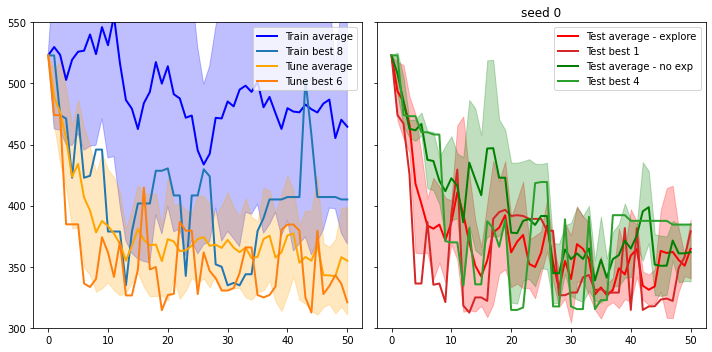

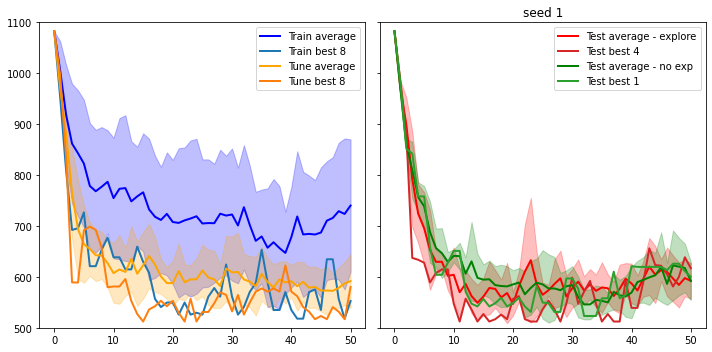

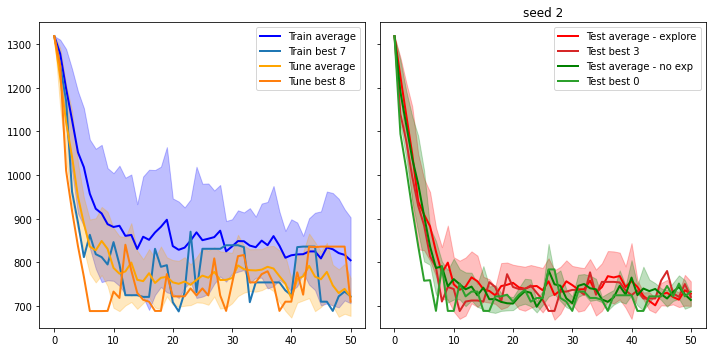

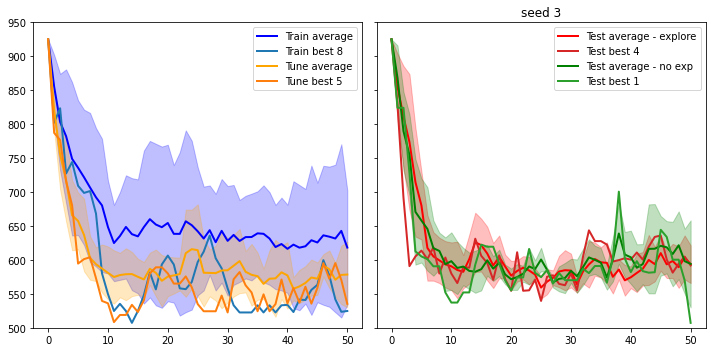

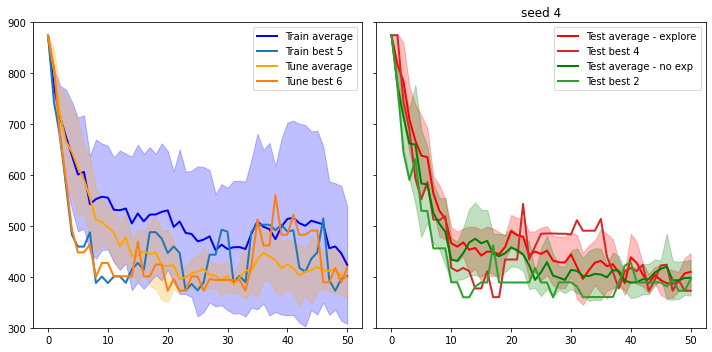

In [29]:
from os import listdir
from os.path import isfile, join
data_dir = 'data'
sub_dir = 'N_20_P_10_10P_same_init'
data_folder = join(data_dir, sub_dir)
record = pickle.load(open(join(data_folder, 'full_graph_2022-04-20_15-06-28_train.pk'), 'rb'))

file_names = [join(data_folder, f) for f in listdir(data_folder) if isfile(join(data_folder, f))]

y_range = {
    0: (300, 550),
    1: (500, 1100),
    2: (650, 1350),
    3: (500, 950),
    4: (300, 900)
}

for i in range(5):
    fig, ax = plt.subplots(1, 2, figsize=(10,5), sharey=True, sharex=True)
    
    train_date = list(filter(lambda data: data['seed'] == i, record))
    lat_train = np.array([episode['latency_trace'] for episode in train_date])
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[0].plot(range(lat_train.shape[1]), average, label="Train average", color='blue', linewidth=2)
    ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Train best {np.argmax(re)}", color='tab:blue',
             linewidth=2)
    ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
    

    tune_data = f'id_{i}_tune'
    test1_data = f'id_{i}_test_exp'
    test2_data = f'id_{i}_test_no_exp'
    
    for f in file_names:
        if tune_data in f:
            tune_data = f
            continue
        if test1_data in f:
            test1_data = f
            continue
        if test2_data in f:
            test2_data = f
            continue

    record_test = pickle.load(open(tune_data, 'rb'))
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[0].plot(range(lat_train.shape[1]), average, label="Tune average", color='orange', linewidth=2)
    ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Tune best {np.argmax(re)}", color='tab:orange',
             linewidth=2)
    ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='orange')
    
    
    record_test = pickle.load(open(test1_data, 'rb'))
    
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[1].plot(range(lat_train.shape[1]), average, label="Test average - explore", color='red', linewidth=2)
    ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best {np.argmax(re)}", color='tab:red',
             linewidth=2)
    ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
    
    record_test = pickle.load(open(test2_data, 'rb'))
    
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[1].plot(range(lat_train.shape[1]), average, label="Test average - no exp", color='green', linewidth=2)
    ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best {np.argmax(re)}", color='tab:green',
             linewidth=2)
    ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='green')

    ax[0].legend()
    ax[1].legend()
    ax[0].set_ylim(y_range[i])
    plt.title(f'seed {i}')
    fig.tight_layout()
    plt.savefig(join(data_folder, f'Program {i}.png'))
    plt.show()


# 20 devices, 10 operators, different init mapping,  10 graphs

In [18]:
data_dir = 'data'
sub_dir = 'N_20_P_10_10P_diff_init'
n_devices = [10, 20, 30]
n_operators = [10, 20, 30]
networks = {n: StarNetwork(*generate_network(n, seed=0)) for n in n_devices}
num_programs = 10

programs = {}
for n in n_devices:
    programs[n] = {}
    for m in n_operators:
        programs[n][m] = []
        for seed in range(num_programs):
            DAG, constraints = generate_program(m, n, seed=seed)
            programs[n][m].append(Program(DAG, constraints))

output_dim = 10

n_device = 20
n_program= 10
env = PlacementEnv([networks[n_device]], programs[n_device][n_program])

agent = PlacementAgent(env.get_node_feature_dim(), env.get_edge_feature_dim(), output_dim, output_dim, hidden_dim=32, lr=0.01)
num_iterations = 50
episode_per_program=10

program_ids = list(range(num_programs)) * episode_per_program
np.random.shuffle(program_ids)
network_ids = [0] * num_programs * episode_per_program
seeds = np.random.randint(5, size= num_programs * episode_per_program).tolist()

record = run_episodes(env,
                 agent,
                 program_ids,
                 network_ids,
                 seeds,
                 use_full_graph=True,
                 use_bip_connection=False,
                 explore=True,
                 max_iter=num_iterations,
                 use_baseline=True,
                 update_op_policy=False,
                 update_policy=True,
                 save_data=True,
                 save_dir=join(data_dir, sub_dir),
                 save_suffix='train',
                 noise=0)
torch.save(agent.full_policy.state_dict(), join(data_dir, sub_dir, 'policy.pk'))
torch.save(agent.full_embedding.state_dict(), join(data_dir, sub_dir, 'embedding.pk'))

{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 1, 'noise': 0, 'n_iters': 50}
[8, 12, 16, 16, 16, 9, 12, 16, 19, 1]


/Users/yihu/opt/anaconda3/envs/default/lib/python3.8/site-packages/dgl/base.py:45: DGLWarning: The input graph for the user-defined edge function does not contain valid edges
  return warnings.warn(message, category=category, stacklevel=1)


[8, 12, 16, 16, 16, 9, 16, 16, 19, 1]
[8, 12, 16, 16, 16, 4, 16, 16, 19, 1]
[8, 12, 16, 16, 16, 4, 16, 6, 19, 1]
[8, 12, 16, 16, 2, 4, 16, 6, 19, 1]
[8, 12, 16, 9, 2, 4, 16, 6, 19, 1]
[8, 12, 16, 17, 2, 4, 16, 6, 19, 1]
[8, 12, 16, 17, 2, 4, 16, 2, 19, 1]
[8, 6, 16, 17, 2, 4, 16, 2, 19, 1]
[8, 6, 16, 12, 2, 4, 16, 2, 19, 1]
[8, 6, 16, 12, 2, 4, 5, 2, 19, 1]
[8, 6, 16, 13, 2, 4, 5, 2, 19, 1]
[8, 6, 16, 4, 2, 4, 5, 2, 19, 1]
[8, 6, 16, 4, 2, 4, 5, 15, 19, 1]
[8, 6, 16, 4, 2, 4, 2, 15, 19, 1]
[8, 6, 16, 4, 2, 4, 6, 15, 19, 1]
[8, 6, 16, 4, 2, 4, 7, 15, 19, 1]
[8, 6, 16, 4, 12, 4, 7, 15, 19, 1]
[8, 6, 16, 4, 12, 4, 16, 15, 19, 1]
[8, 12, 16, 4, 12, 4, 16, 15, 19, 1]
[8, 12, 16, 4, 10, 4, 16, 15, 19, 1]
[8, 12, 16, 4, 16, 4, 16, 15, 19, 1]
[8, 12, 16, 15, 16, 4, 16, 15, 19, 1]
[8, 12, 16, 15, 16, 4, 12, 15, 19, 1]
[8, 12, 16, 12, 16, 4, 12, 15, 19, 1]
[8, 12, 16, 12, 16, 4, 16, 15, 19, 1]
[8, 12, 16, 12, 16, 4, 19, 15, 19, 1]
[8, 12, 16, 12, 16, 4, 18, 15, 19, 1]
[8, 12, 16, 6, 16, 4, 18, 1

[8, 12, 3, 1, 2, 12, 5, 18, 9, 12]
[8, 2, 3, 1, 2, 12, 5, 18, 9, 12]
[8, 0, 3, 1, 2, 12, 5, 18, 9, 12]
[8, 0, 3, 1, 2, 12, 5, 6, 9, 12]
[8, 0, 4, 1, 2, 12, 5, 6, 9, 12]
[8, 0, 6, 1, 2, 12, 5, 6, 9, 12]
[8, 0, 6, 13, 2, 12, 5, 6, 9, 12]
[8, 14, 6, 13, 2, 12, 5, 6, 9, 12]
[8, 14, 6, 18, 2, 12, 5, 6, 9, 12]
[8, 14, 3, 18, 2, 12, 5, 6, 9, 12]
[8, 1, 3, 18, 2, 12, 5, 6, 9, 12]
[8, 1, 3, 18, 2, 12, 1, 6, 9, 12]
[8, 1, 3, 18, 2, 12, 1, 4, 9, 12]
[8, 1, 3, 18, 19, 12, 1, 4, 9, 12]
[8, 1, 3, 18, 10, 12, 1, 4, 9, 12]
[8, 1, 3, 18, 10, 12, 1, 4, 15, 12]
[8, 1, 3, 18, 10, 12, 13, 4, 15, 12]
[8, 1, 17, 18, 10, 12, 13, 4, 15, 12]
[8, 1, 17, 11, 10, 12, 13, 4, 15, 12]
[8, 7, 17, 11, 10, 12, 13, 4, 15, 12]
[8, 6, 17, 11, 10, 12, 13, 4, 15, 12]
[8, 6, 17, 11, 10, 6, 13, 4, 15, 12]
[8, 6, 17, 11, 10, 6, 13, 13, 15, 12]
[8, 6, 9, 11, 10, 6, 13, 13, 15, 12]
[8, 6, 9, 11, 10, 6, 13, 13, 12, 12]
[8, 6, 9, 6, 10, 6, 13, 13, 12, 12]
[8, 6, 9, 6, 10, 6, 13, 13, 18, 12]
[8, 6, 9, 6, 10, 6, 13, 18, 18, 12]
[8, 6

[13, 6, 1, 11, 14, 1, 18, 17, 16, 17]
[13, 6, 1, 11, 14, 1, 18, 17, 18, 17]
[13, 13, 1, 11, 14, 1, 18, 17, 18, 17]
[13, 13, 1, 11, 17, 1, 18, 17, 18, 17]
[13, 13, 1, 11, 17, 1, 18, 17, 5, 17]
[13, 5, 1, 11, 17, 1, 18, 17, 5, 17]
[13, 14, 1, 11, 17, 1, 18, 17, 5, 17]
[13, 14, 1, 1, 17, 1, 18, 17, 5, 17]
[13, 4, 1, 1, 17, 1, 18, 17, 5, 17]
[13, 4, 1, 1, 17, 1, 18, 17, 0, 17]
[13, 13, 1, 1, 17, 1, 18, 17, 0, 17]
[13, 13, 1, 1, 17, 8, 18, 17, 0, 17]
[13, 13, 1, 1, 17, 8, 18, 17, 16, 17]
[13, 13, 1, 1, 17, 8, 18, 4, 16, 17]
[13, 13, 1, 6, 17, 8, 18, 4, 16, 17]
[13, 13, 1, 6, 7, 8, 18, 4, 16, 17]
[13, 13, 1, 6, 7, 6, 18, 4, 16, 17]
{'n_devices': 20, 'n_operators': 10, 'seed': 6, 'init_seed': 2, 'noise': 0, 'n_iters': 50}
[11, 13, 8, 1, 10, 5, 17, 13, 4, 3]
[11, 13, 8, 1, 10, 5, 17, 1, 4, 3]
[11, 13, 8, 1, 10, 5, 3, 1, 4, 3]
[11, 13, 8, 10, 10, 5, 3, 1, 4, 3]
[11, 13, 8, 10, 19, 5, 3, 1, 4, 3]
[11, 13, 8, 10, 19, 5, 5, 1, 4, 3]
[11, 13, 8, 10, 4, 5, 5, 1, 4, 3]
[11, 13, 8, 10, 4, 1, 5, 1, 4, 

[4, 13, 0, 18, 8, 13, 4, 13, 18, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 8, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[15, 6, 5, 5, 4, 8, 19, 5, 5, 7]
[15, 6, 5, 5, 4, 8, 12, 5, 5, 7]
[15, 13, 5, 5, 4, 8, 12, 5, 5, 7]
[15, 6, 5, 5, 4, 8, 12, 5, 5, 7]
[15, 6, 5, 5, 4, 6, 12, 5, 5, 7]
[15, 6, 5, 5, 5, 6, 12, 5, 5, 7]
[15, 6, 5, 5, 14, 6, 12, 5, 5, 7]
[15, 6, 5, 5, 5, 6, 12, 5, 5, 7]
[15, 18, 5, 5, 5, 6, 12, 5, 5, 7]
[15, 18, 5, 5, 5, 8, 12, 5, 5, 7]
[15, 18, 5, 5, 5, 18, 12, 5, 5, 7]
[15, 5, 5, 5, 5, 18, 12, 5, 5, 7]
[15, 10, 5, 5, 5, 18, 12, 5, 5, 7]
[15, 10, 5, 5, 5, 13, 12, 5, 5, 7]
[15, 10, 16, 5, 5, 13, 12, 5, 5, 7]
[15, 13, 16, 5, 5, 13, 12, 5, 5, 7]
[15, 13, 5, 5, 5, 13, 12, 5, 5, 7]
[15, 13, 5, 5, 5, 13, 12, 16, 5, 7]
[15, 6, 5, 5, 5, 13, 12, 16, 5, 7]
[15, 6, 5, 16, 5, 13, 12, 16, 5, 7]
[15, 6, 5, 16, 5, 13, 2, 16, 5, 7]
[15, 6, 5, 16, 4, 13, 2, 16, 5, 7]
[15, 6, 5, 16, 4, 13, 2, 5, 5, 7]
[15, 13, 5, 16, 4, 13, 2, 5, 5, 7]
[15, 13, 5, 16, 4, 13, 4, 5, 5, 7]
[15, 18, 5,

[12, 9, 0, 2, 19, 1, 10, 8, 6, 7]
[12, 9, 0, 2, 19, 1, 8, 8, 6, 7]
[12, 9, 4, 2, 19, 1, 8, 8, 6, 7]
[12, 2, 4, 2, 19, 1, 8, 8, 6, 7]
[12, 2, 4, 2, 19, 1, 8, 8, 0, 7]
[12, 2, 4, 2, 19, 1, 14, 8, 0, 7]
[12, 2, 4, 2, 19, 1, 14, 8, 6, 7]
[12, 2, 4, 2, 19, 1, 14, 17, 6, 7]
[12, 2, 4, 2, 19, 2, 14, 17, 6, 7]
[12, 2, 4, 2, 19, 13, 14, 17, 6, 7]
[12, 2, 13, 2, 19, 13, 14, 17, 6, 7]
[12, 2, 13, 2, 19, 13, 8, 17, 6, 7]
[12, 2, 13, 2, 19, 2, 8, 17, 6, 7]
[12, 2, 13, 2, 19, 2, 3, 17, 6, 7]
[12, 2, 13, 2, 19, 2, 19, 17, 6, 7]
[12, 2, 6, 2, 19, 2, 19, 17, 6, 7]
[12, 2, 6, 2, 19, 2, 19, 8, 6, 7]
[12, 2, 18, 2, 19, 2, 19, 8, 6, 7]
[12, 2, 18, 2, 19, 2, 19, 11, 6, 7]
[12, 2, 7, 2, 19, 2, 19, 11, 6, 7]
[12, 2, 7, 13, 19, 2, 19, 11, 6, 7]
[12, 2, 7, 13, 19, 13, 19, 11, 6, 7]
[12, 2, 6, 13, 19, 13, 19, 11, 6, 7]
[12, 2, 6, 13, 19, 13, 15, 11, 6, 7]
[12, 2, 13, 13, 19, 13, 15, 11, 6, 7]
[12, 2, 13, 13, 19, 13, 15, 4, 6, 7]
[12, 2, 13, 13, 19, 8, 15, 4, 6, 7]
[12, 2, 13, 2, 19, 8, 15, 4, 6, 7]
[12, 2, 13, 2

[9, 2, 13, 19, 7, 2, 4, 6, 2, 9]
[9, 2, 13, 19, 7, 2, 9, 6, 2, 9]
[9, 2, 19, 19, 7, 2, 9, 6, 2, 9]
[9, 2, 1, 19, 7, 2, 9, 6, 2, 9]
[9, 2, 13, 19, 7, 2, 9, 6, 2, 9]
[9, 2, 13, 19, 7, 2, 18, 6, 2, 9]
[9, 2, 13, 19, 7, 2, 6, 6, 2, 9]
[9, 2, 13, 19, 7, 2, 9, 6, 2, 9]
[9, 2, 13, 18, 7, 2, 9, 6, 2, 9]
[9, 2, 0, 18, 7, 2, 9, 6, 2, 9]
[9, 2, 19, 18, 7, 2, 9, 6, 2, 9]
[9, 2, 19, 19, 7, 2, 9, 6, 2, 9]
[9, 2, 19, 19, 13, 2, 9, 6, 2, 9]
[9, 2, 8, 19, 13, 2, 9, 6, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 3, 'noise': 0, 'n_iters': 50}
[13, 17, 19, 6, 17, 1, 1, 12, 14, 3]
[13, 16, 19, 6, 17, 1, 1, 12, 14, 3]
[13, 16, 19, 18, 17, 1, 1, 12, 14, 3]
[13, 16, 19, 4, 17, 1, 1, 12, 14, 3]
[13, 16, 19, 4, 17, 1, 6, 12, 14, 3]
[13, 16, 19, 4, 17, 1, 6, 12, 8, 3]
[13, 16, 19, 4, 8, 1, 6, 12, 8, 3]
[13, 8, 19, 4, 8, 1, 6, 12, 8, 3]
[13, 8, 19, 4, 8, 1, 6, 12, 10, 3]
[13, 8, 19, 4, 2, 1, 6, 12, 10, 3]
[13, 8, 19, 4, 2, 1, 6, 12, 18, 3]
[13, 8, 17, 4, 2, 1, 6, 12, 18, 3]
[13, 8, 17, 13, 

[17, 1, 18, 1, 1, 10, 1, 1, 1, 3]
[17, 1, 18, 1, 1, 10, 1, 13, 1, 3]
[17, 1, 18, 1, 19, 10, 1, 13, 1, 3]
[17, 1, 18, 1, 19, 10, 1, 13, 13, 3]
[17, 1, 1, 1, 19, 10, 1, 13, 13, 3]
[17, 18, 1, 1, 19, 10, 1, 13, 13, 3]
[17, 18, 1, 1, 19, 13, 1, 13, 13, 3]
[17, 2, 1, 1, 19, 13, 1, 13, 13, 3]
[17, 2, 1, 1, 19, 13, 1, 8, 13, 3]
[17, 2, 1, 8, 19, 13, 1, 8, 13, 3]
[17, 2, 1, 8, 19, 13, 1, 9, 13, 3]
[17, 2, 1, 8, 19, 13, 1, 11, 13, 3]
[17, 18, 1, 8, 19, 13, 1, 11, 13, 3]
[17, 18, 1, 8, 19, 13, 13, 11, 13, 3]
[17, 18, 0, 8, 19, 13, 13, 11, 13, 3]
[17, 18, 0, 8, 19, 13, 13, 11, 4, 3]
[17, 18, 2, 8, 19, 13, 13, 11, 4, 3]
[17, 18, 2, 8, 19, 16, 13, 11, 4, 3]
[17, 18, 2, 8, 19, 16, 13, 17, 4, 3]
[17, 18, 2, 8, 19, 16, 13, 4, 4, 3]
[17, 18, 2, 4, 19, 16, 13, 4, 4, 3]
[17, 18, 2, 4, 19, 10, 13, 4, 4, 3]
[17, 4, 2, 4, 19, 10, 13, 4, 4, 3]
[17, 4, 2, 4, 19, 10, 13, 4, 1, 3]
[17, 4, 2, 4, 19, 10, 13, 1, 1, 3]
[17, 4, 2, 4, 19, 10, 13, 13, 1, 3]
[17, 4, 2, 4, 4, 10, 13, 13, 1, 3]
[17, 18, 2, 4, 4, 10, 13, 

[17, 10, 18, 4, 4, 2, 4, 6, 1, 3]
[17, 10, 18, 4, 4, 10, 4, 6, 1, 3]
[17, 10, 18, 4, 4, 10, 4, 6, 13, 3]
[17, 10, 18, 4, 4, 13, 4, 6, 13, 3]
[17, 10, 18, 4, 4, 2, 4, 6, 13, 3]
[17, 10, 18, 4, 4, 2, 4, 6, 8, 3]
[17, 10, 10, 4, 4, 2, 4, 6, 8, 3]
[17, 4, 10, 4, 4, 2, 4, 6, 8, 3]
[17, 2, 10, 4, 4, 2, 4, 6, 8, 3]
[17, 16, 10, 4, 4, 2, 4, 6, 8, 3]
[17, 16, 10, 4, 4, 2, 4, 8, 8, 3]
[17, 16, 4, 4, 4, 2, 4, 8, 8, 3]
[17, 16, 4, 4, 4, 2, 4, 13, 8, 3]
[17, 16, 2, 4, 4, 2, 4, 13, 8, 3]
[17, 16, 2, 4, 19, 2, 4, 13, 8, 3]
[17, 1, 2, 4, 19, 2, 4, 13, 8, 3]
[17, 1, 2, 4, 19, 2, 4, 13, 4, 3]
[17, 1, 2, 4, 19, 2, 4, 14, 4, 3]
[17, 1, 18, 4, 19, 2, 4, 14, 4, 3]
[17, 1, 18, 4, 19, 2, 4, 8, 4, 3]
[17, 1, 18, 4, 19, 18, 4, 8, 4, 3]
[17, 1, 18, 4, 19, 6, 4, 8, 4, 3]
[17, 1, 18, 4, 19, 6, 4, 6, 4, 3]
[17, 4, 18, 4, 19, 6, 4, 6, 4, 3]
[17, 4, 18, 4, 19, 6, 8, 6, 4, 3]
[17, 4, 18, 4, 19, 6, 8, 6, 6, 3]
[17, 4, 18, 4, 4, 6, 8, 6, 6, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 7, 'init_seed': 2, 'noise': 0, '

[17, 4, 4, 1, 1, 2, 4, 8, 1, 3]
[17, 4, 4, 1, 1, 2, 4, 1, 1, 3]
[17, 4, 4, 1, 1, 2, 4, 4, 1, 3]
[17, 4, 2, 1, 1, 2, 4, 4, 1, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 9, 'init_seed': 4, 'noise': 0, 'n_iters': 50}
[8, 13, 19, 18, 8, 6, 1, 10, 19, 12]
[8, 13, 19, 18, 2, 6, 1, 10, 19, 12]
[8, 13, 19, 18, 2, 6, 1, 2, 19, 12]
[8, 4, 19, 18, 2, 6, 1, 2, 19, 12]
[8, 4, 19, 16, 2, 6, 1, 2, 19, 12]
[8, 4, 19, 6, 2, 6, 1, 2, 19, 12]
[8, 4, 19, 6, 2, 18, 1, 2, 19, 12]
[8, 4, 19, 6, 19, 18, 1, 2, 19, 12]
[8, 4, 19, 6, 19, 18, 13, 2, 19, 12]
[8, 4, 19, 6, 4, 18, 13, 2, 19, 12]
[8, 4, 19, 6, 4, 18, 13, 2, 18, 12]
[8, 4, 19, 6, 4, 18, 1, 2, 18, 12]
[8, 2, 19, 6, 4, 18, 1, 2, 18, 12]
[8, 2, 19, 6, 4, 13, 1, 2, 18, 12]
[8, 2, 19, 6, 4, 1, 1, 2, 18, 12]
[8, 2, 19, 13, 4, 1, 1, 2, 18, 12]
[8, 2, 19, 13, 4, 1, 13, 2, 18, 12]
[8, 2, 19, 13, 4, 18, 13, 2, 18, 12]
[8, 2, 2, 13, 4, 18, 13, 2, 18, 12]
[8, 2, 2, 13, 19, 18, 13, 2, 18, 12]
[8, 2, 2, 13, 19, 13, 13, 2, 18, 12]
[8, 2, 2, 13, 19, 13, 13, 2, 8

[4, 2, 10, 19, 16, 13, 1, 8, 1, 16]
[4, 2, 10, 19, 13, 13, 1, 8, 1, 16]
[4, 13, 10, 19, 13, 13, 1, 8, 1, 16]
[4, 13, 10, 19, 13, 13, 18, 8, 1, 16]
[4, 13, 10, 19, 13, 13, 18, 8, 2, 16]
[4, 13, 10, 19, 13, 13, 18, 8, 13, 16]
[4, 8, 10, 19, 13, 13, 18, 8, 13, 16]
[4, 8, 10, 19, 13, 13, 18, 8, 19, 16]
[4, 8, 10, 19, 13, 13, 18, 8, 6, 16]
[4, 8, 10, 19, 2, 13, 18, 8, 6, 16]
[4, 8, 10, 19, 2, 13, 18, 8, 1, 16]
[4, 8, 10, 19, 2, 13, 18, 8, 13, 16]
[4, 8, 10, 19, 2, 13, 18, 8, 2, 16]
[4, 8, 10, 19, 2, 13, 18, 8, 1, 16]
[4, 8, 10, 19, 2, 13, 18, 2, 1, 16]
[4, 8, 10, 19, 2, 13, 18, 2, 18, 16]
[4, 8, 10, 19, 2, 2, 18, 2, 18, 16]
[4, 8, 10, 19, 2, 2, 18, 2, 19, 16]
[4, 8, 10, 19, 2, 2, 4, 2, 19, 16]
[4, 8, 10, 19, 2, 2, 4, 2, 2, 16]
[4, 8, 10, 19, 13, 2, 4, 2, 2, 16]
[4, 8, 10, 19, 13, 2, 4, 2, 4, 16]
[4, 8, 10, 19, 13, 2, 4, 13, 4, 16]
[4, 8, 10, 19, 8, 2, 4, 13, 4, 16]
[4, 8, 10, 6, 8, 2, 4, 13, 4, 16]
[4, 2, 10, 6, 8, 2, 4, 13, 4, 16]
[4, 2, 10, 6, 8, 2, 19, 13, 4, 16]
[4, 2, 10, 6, 8, 2, 19, 

[15, 18, 16, 16, 16, 6, 19, 16, 16, 7]
[15, 18, 16, 16, 16, 6, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 13, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 10, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 13, 4, 16, 16, 7]
[15, 18, 16, 16, 16, 13, 19, 16, 16, 7]
[15, 18, 16, 16, 16, 8, 19, 16, 16, 7]
[15, 18, 16, 16, 16, 8, 2, 16, 16, 7]
[15, 13, 16, 16, 16, 8, 2, 16, 16, 7]
[15, 18, 16, 16, 16, 8, 2, 16, 16, 7]
[15, 18, 16, 16, 16, 1, 2, 16, 16, 7]
[15, 18, 16, 16, 16, 18, 2, 16, 16, 7]
[15, 18, 16, 16, 16, 10, 2, 16, 16, 7]
[15, 18, 16, 16, 16, 10, 19, 16, 16, 7]
[15, 18, 16, 16, 16, 13, 19, 16, 16, 7]
[15, 1, 16, 16, 16, 13, 19, 16, 16, 7]
[15, 13, 16, 16, 16, 13, 19, 16, 16, 7]
[15, 13, 16, 16, 16, 6, 19, 16, 16, 7]
[15, 13, 16, 16, 16, 6, 2, 16, 16, 7]
[15, 13, 16, 16, 16, 18, 2, 16, 16, 7]
[15, 13, 16, 16, 16, 13, 2, 16, 16, 7]
[15, 13, 16, 16, 16, 18, 2, 16, 16, 7]
{'n_devices': 20, 'n_operators': 10, 'seed': 9, 'init_seed': 4, 'noise': 0, 'n_iters': 50}
[8, 18, 19, 18, 8, 5, 1, 10, 19, 12]
[8, 18, 19, 18, 

{'n_devices': 20, 'n_operators': 10, 'seed': 7, 'init_seed': 4, 'noise': 0, 'n_iters': 50}
[12, 13, 11, 9, 3, 1, 16, 4, 4, 7]
[12, 13, 11, 9, 3, 1, 19, 4, 4, 7]
[12, 13, 13, 9, 3, 1, 19, 4, 4, 7]
[12, 13, 13, 13, 3, 1, 19, 4, 4, 7]
[12, 13, 2, 13, 3, 1, 19, 4, 4, 7]
[12, 13, 2, 13, 3, 1, 19, 18, 4, 7]
[12, 13, 2, 2, 3, 1, 19, 18, 4, 7]
[12, 13, 2, 2, 3, 1, 19, 4, 4, 7]
[12, 13, 13, 2, 3, 1, 19, 4, 4, 7]
[12, 13, 13, 13, 3, 1, 19, 4, 4, 7]
[12, 13, 13, 13, 3, 2, 19, 4, 4, 7]
[12, 13, 13, 13, 3, 2, 19, 4, 18, 7]
[12, 13, 13, 13, 10, 2, 19, 4, 18, 7]
[12, 13, 13, 13, 10, 2, 19, 4, 4, 7]
[12, 13, 13, 13, 10, 2, 10, 4, 4, 7]
[12, 13, 13, 13, 10, 2, 10, 1, 4, 7]
[12, 13, 18, 13, 10, 2, 10, 1, 4, 7]
[12, 13, 18, 13, 10, 2, 10, 1, 13, 7]
[12, 13, 18, 13, 19, 2, 10, 1, 13, 7]
[12, 13, 18, 2, 19, 2, 10, 1, 13, 7]
[12, 13, 18, 2, 19, 1, 10, 1, 13, 7]
[12, 13, 18, 2, 19, 1, 10, 1, 18, 7]
[12, 13, 18, 2, 19, 1, 10, 4, 18, 7]
[12, 13, 18, 2, 19, 13, 10, 4, 18, 7]
[12, 13, 13, 2, 19, 13, 10, 4, 18, 7

[17, 2, 4, 13, 4, 2, 4, 1, 4, 3]
[17, 2, 4, 1, 4, 2, 4, 1, 4, 3]
[17, 2, 4, 1, 4, 2, 1, 1, 4, 3]
[17, 2, 4, 1, 4, 2, 1, 4, 4, 3]
[17, 2, 4, 1, 4, 13, 1, 4, 4, 3]
[17, 2, 4, 1, 4, 13, 1, 8, 4, 3]
[17, 2, 4, 1, 4, 13, 4, 8, 4, 3]
[17, 2, 4, 1, 4, 13, 4, 1, 4, 3]
[17, 2, 2, 1, 4, 13, 4, 1, 4, 3]
[17, 2, 1, 1, 4, 13, 4, 1, 4, 3]
[17, 2, 1, 1, 4, 2, 4, 1, 4, 3]
[17, 2, 1, 13, 4, 2, 4, 1, 4, 3]
[17, 4, 1, 13, 4, 2, 4, 1, 4, 3]
[17, 4, 1, 1, 4, 2, 4, 1, 4, 3]
[17, 4, 1, 4, 4, 2, 4, 1, 4, 3]
[17, 4, 1, 4, 4, 2, 8, 1, 4, 3]
[17, 4, 1, 4, 4, 2, 13, 1, 4, 3]
[17, 4, 1, 4, 4, 13, 13, 1, 4, 3]
[17, 4, 1, 4, 1, 13, 13, 1, 4, 3]
[17, 4, 1, 4, 1, 13, 13, 1, 1, 3]
[17, 4, 1, 4, 1, 13, 13, 6, 1, 3]
[17, 4, 1, 4, 1, 13, 13, 1, 1, 3]
[17, 4, 4, 4, 1, 13, 13, 1, 1, 3]
[17, 4, 4, 4, 4, 13, 13, 1, 1, 3]
[17, 4, 4, 4, 4, 2, 13, 1, 1, 3]
[17, 4, 4, 4, 4, 2, 6, 1, 1, 3]
[17, 4, 4, 4, 4, 2, 6, 13, 1, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 5, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[17, 10, 0, 6, 19, 

[8, 2, 2, 2, 1, 4, 2, 2, 18, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 1, 'init_seed': 1, 'noise': 0, 'n_iters': 50}
[13, 7, 4, 4, 5, 8, 18, 0, 0, 17]
[13, 7, 4, 4, 5, 8, 18, 4, 0, 17]
[13, 6, 4, 4, 5, 8, 18, 4, 0, 17]
[13, 6, 4, 4, 5, 8, 18, 6, 0, 17]
[13, 6, 4, 4, 5, 8, 18, 4, 0, 17]
[13, 6, 4, 0, 5, 8, 18, 4, 0, 17]
[13, 6, 4, 0, 5, 8, 18, 13, 0, 17]
[13, 6, 4, 0, 5, 1, 18, 13, 0, 17]
[13, 6, 4, 0, 5, 1, 18, 4, 0, 17]
[13, 6, 4, 0, 0, 1, 18, 4, 0, 17]
[13, 6, 4, 0, 0, 1, 18, 13, 0, 17]
[13, 4, 4, 0, 0, 1, 18, 13, 0, 17]
[13, 4, 4, 0, 0, 1, 18, 0, 0, 17]
[13, 4, 4, 0, 0, 1, 18, 4, 0, 17]
[13, 4, 4, 0, 0, 13, 18, 4, 0, 17]
[13, 4, 4, 0, 0, 13, 18, 13, 0, 17]
[13, 4, 4, 0, 0, 13, 18, 4, 0, 17]
[13, 4, 4, 0, 0, 13, 18, 0, 0, 17]
[13, 13, 4, 0, 0, 13, 18, 0, 0, 17]
[13, 13, 4, 13, 0, 13, 18, 0, 0, 17]
[13, 13, 4, 13, 0, 1, 18, 0, 0, 17]
[13, 13, 4, 13, 17, 1, 18, 0, 0, 17]
[13, 13, 4, 13, 17, 1, 18, 8, 0, 17]
[13, 13, 18, 13, 17, 1, 18, 8, 0, 17]
[13, 13, 18, 0, 17, 1, 18, 8, 0, 17

[8, 4, 18, 18, 4, 13, 13, 13, 18, 12]
[8, 4, 18, 18, 4, 13, 13, 13, 6, 12]
[8, 4, 18, 18, 4, 6, 13, 13, 6, 12]
[8, 4, 18, 18, 4, 13, 13, 13, 6, 12]
[8, 4, 18, 18, 4, 13, 13, 13, 18, 12]
[8, 4, 18, 18, 4, 13, 13, 13, 19, 12]
[8, 4, 18, 18, 4, 13, 13, 13, 6, 12]
[8, 4, 18, 18, 2, 13, 13, 13, 6, 12]
[8, 4, 18, 18, 2, 13, 13, 1, 6, 12]
[8, 4, 18, 18, 2, 13, 13, 2, 6, 12]
[8, 4, 18, 18, 2, 13, 13, 2, 19, 12]
[8, 4, 18, 18, 2, 13, 13, 2, 6, 12]
[8, 4, 10, 18, 2, 13, 13, 2, 6, 12]
[8, 4, 4, 18, 2, 13, 13, 2, 6, 12]
[8, 4, 4, 18, 8, 13, 13, 2, 6, 12]
[8, 4, 4, 18, 8, 13, 13, 2, 19, 12]
[8, 4, 4, 18, 8, 1, 13, 2, 19, 12]
[8, 4, 4, 18, 8, 1, 13, 2, 18, 12]
[8, 4, 4, 18, 4, 1, 13, 2, 18, 12]
[8, 4, 4, 18, 4, 1, 13, 2, 19, 12]
[8, 4, 4, 18, 4, 6, 13, 2, 19, 12]
[8, 4, 4, 18, 4, 6, 13, 2, 8, 12]
[8, 13, 4, 18, 4, 6, 13, 2, 8, 12]
[8, 1, 4, 18, 4, 6, 13, 2, 8, 12]
[8, 1, 4, 18, 4, 6, 13, 2, 18, 12]
[8, 1, 4, 18, 4, 6, 13, 4, 18, 12]
[8, 1, 4, 18, 4, 6, 13, 4, 17, 12]
[8, 1, 4, 18, 10, 6, 13, 4, 17, 

[8, 6, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 6, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 6, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 6, 2, 2, 10, 4, 2, 2, 19, 1]
[8, 6, 2, 2, 10, 4, 2, 2, 18, 1]
[8, 6, 2, 2, 10, 4, 2, 2, 11, 1]
[8, 6, 2, 2, 10, 4, 2, 2, 19, 1]
[8, 6, 2, 2, 10, 4, 2, 2, 11, 1]
[8, 6, 2, 2, 10, 4, 2, 2, 19, 1]
[8, 6, 2, 2, 10, 4, 19, 2, 19, 1]
[8, 6, 2, 2, 10, 4, 19, 2, 18, 1]
[8, 6, 2, 2, 10, 4, 19, 2, 19, 1]
[8, 6, 2, 2, 10, 4, 19, 2, 18, 1]
[8, 6, 2, 2, 10, 4, 19, 2, 19, 1]
[8, 6, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 6, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 6, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 6, 2, 2, 10, 4, 2, 2, 18, 1]
[8, 6, 2, 2, 10, 4, 6, 2, 18, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 8, 'init_seed': 2, 'noise': 0, 'n_iters': 50}
[15, 16, 5, 5, 19, 8, 4, 5, 17, 7]
[15, 16, 5, 5, 19, 18, 4, 5, 17, 7]
[15, 16, 5, 5, 19, 18, 19, 5, 17, 7]
[15, 16, 5, 5, 19, 18, 2, 5, 17, 7]
[15, 16, 5, 5, 19, 18, 4, 5, 17, 7]
[15, 16, 5, 5, 19, 18, 2, 5, 17, 7]
[15, 16, 5, 5, 19, 18, 4, 5, 17, 7]
[15, 16, 5, 5, 19, 18, 2, 5, 

[4, 8, 11, 16, 11, 7, 1, 13, 13, 16]
[4, 8, 11, 16, 11, 7, 1, 13, 2, 16]
[4, 8, 11, 16, 11, 7, 1, 13, 13, 16]
[4, 8, 11, 16, 11, 7, 1, 13, 2, 16]
[4, 13, 11, 16, 11, 7, 1, 13, 2, 16]
[4, 13, 11, 11, 11, 7, 1, 13, 2, 16]
[4, 13, 11, 11, 11, 7, 1, 13, 13, 16]
[4, 13, 11, 11, 11, 7, 19, 13, 13, 16]
[4, 13, 0, 11, 11, 7, 19, 13, 13, 16]
[4, 13, 0, 11, 11, 7, 19, 13, 19, 16]
[4, 13, 11, 11, 11, 7, 19, 13, 19, 16]
[4, 13, 11, 11, 11, 7, 19, 13, 8, 16]
[4, 13, 11, 11, 11, 7, 19, 13, 19, 16]
[4, 13, 11, 11, 11, 7, 1, 13, 19, 16]
[4, 13, 11, 11, 11, 7, 1, 13, 4, 16]
[4, 13, 11, 11, 11, 13, 1, 13, 4, 16]
[4, 13, 11, 11, 11, 2, 1, 13, 4, 16]
[4, 13, 11, 11, 11, 2, 4, 13, 4, 16]
[4, 13, 11, 11, 11, 2, 4, 13, 2, 16]
[4, 13, 11, 11, 11, 2, 4, 13, 18, 16]
[4, 13, 11, 11, 11, 2, 4, 13, 4, 16]
[4, 13, 11, 11, 11, 2, 4, 9, 4, 16]
[4, 13, 11, 11, 11, 2, 19, 9, 4, 16]
[4, 13, 11, 11, 11, 2, 19, 9, 18, 16]
[4, 13, 11, 11, 11, 2, 19, 9, 4, 16]
[4, 13, 11, 11, 11, 2, 19, 9, 13, 16]
[4, 13, 11, 11, 11, 2, 19,

[4, 2, 10, 18, 13, 13, 1, 2, 2, 16]
[4, 2, 10, 18, 13, 13, 1, 2, 19, 16]
[4, 2, 10, 19, 13, 13, 1, 2, 19, 16]
[4, 2, 10, 19, 13, 13, 1, 2, 1, 16]
[4, 2, 10, 19, 13, 13, 1, 2, 6, 16]
[4, 2, 10, 19, 13, 13, 4, 2, 6, 16]
[4, 2, 10, 19, 13, 13, 4, 2, 13, 16]
[4, 2, 10, 19, 13, 13, 4, 2, 15, 16]
[4, 2, 10, 19, 13, 13, 4, 2, 18, 16]
[4, 2, 10, 19, 13, 13, 4, 2, 4, 16]
[4, 2, 10, 19, 13, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 6, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 2, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 11, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 16, 4, 16]
[4, 2, 10, 19, 2, 2, 4, 16, 2, 16]
[4, 2, 10, 18, 2, 2, 4, 16, 2, 16]
[4, 2, 10, 6, 2, 2, 4, 16, 2, 16]
[4, 2, 10, 6, 2, 2, 4, 16, 6, 16]
[4, 2, 10, 6, 2, 2, 4, 3, 6, 16]
[4, 2, 16, 6, 2, 2, 4, 3, 6, 16]
[4, 2, 16, 6, 2, 2, 4, 3, 19, 16]
[4, 2, 16, 6, 13, 2, 4, 3, 19, 16]
[4, 2, 16, 6, 13, 2, 4, 3, 2, 16]
[4, 2, 16, 6, 8, 2, 4, 3, 2, 16]
[4, 2, 16, 6, 8, 2, 4, 3, 19, 16]
[4, 2, 16, 6, 8, 2, 4, 3, 18, 16]
[4, 2, 16, 6, 8, 2, 

[15, 6, 16, 5, 2, 8, 19, 5, 17, 7]
[15, 1, 16, 5, 2, 8, 19, 5, 17, 7]
[15, 1, 16, 5, 2, 8, 19, 5, 16, 7]
[15, 1, 16, 5, 2, 8, 19, 5, 0, 7]
[15, 1, 16, 5, 2, 8, 2, 5, 0, 7]
[15, 1, 16, 5, 2, 13, 2, 5, 0, 7]
[15, 1, 16, 5, 2, 13, 2, 5, 17, 7]
[15, 1, 16, 5, 16, 13, 2, 5, 17, 7]
[15, 1, 16, 5, 2, 13, 2, 5, 17, 7]
[15, 1, 16, 5, 19, 13, 2, 5, 17, 7]
[15, 1, 16, 5, 19, 13, 4, 5, 17, 7]
[15, 1, 16, 5, 19, 18, 4, 5, 17, 7]
[15, 1, 16, 5, 19, 6, 4, 5, 17, 7]
[15, 1, 16, 5, 19, 6, 19, 5, 17, 7]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 1, 'noise': 0, 'n_iters': 50}
[8, 12, 16, 16, 16, 9, 12, 6, 18, 1]
[8, 12, 16, 16, 16, 9, 16, 6, 18, 1]
[8, 12, 16, 16, 16, 9, 16, 6, 19, 1]
[8, 12, 16, 16, 16, 9, 16, 16, 19, 1]
[8, 12, 16, 4, 16, 9, 16, 16, 19, 1]
[8, 12, 2, 4, 16, 9, 16, 16, 19, 1]
[8, 12, 2, 4, 10, 9, 16, 16, 19, 1]
[8, 12, 2, 4, 10, 9, 18, 16, 19, 1]
[8, 12, 2, 4, 10, 9, 18, 2, 19, 1]
[8, 12, 2, 4, 10, 9, 18, 2, 18, 1]
[8, 12, 2, 4, 10, 4, 18, 2, 18, 1]
[8, 12, 2, 4, 10, 4

[15, 18, 16, 5, 5, 10, 2, 16, 17, 7]
[15, 18, 16, 5, 5, 6, 2, 16, 17, 7]
[15, 18, 16, 5, 5, 6, 11, 16, 17, 7]
[15, 18, 16, 5, 5, 18, 11, 16, 17, 7]
[15, 18, 16, 5, 5, 18, 19, 16, 17, 7]
[15, 18, 16, 16, 5, 18, 19, 16, 17, 7]
[15, 18, 16, 16, 16, 18, 19, 16, 17, 7]
[15, 18, 16, 16, 16, 18, 19, 16, 0, 7]
[15, 18, 16, 16, 16, 18, 19, 16, 16, 7]
[15, 18, 16, 16, 16, 18, 19, 16, 0, 7]
[15, 18, 16, 16, 16, 6, 19, 16, 0, 7]
[15, 18, 16, 16, 16, 13, 19, 16, 0, 7]
[15, 18, 16, 16, 16, 13, 4, 16, 0, 7]
[15, 18, 16, 16, 16, 13, 19, 16, 0, 7]
[15, 18, 16, 16, 16, 13, 4, 16, 0, 7]
[15, 18, 16, 16, 16, 13, 4, 16, 17, 7]
[15, 18, 16, 16, 16, 13, 3, 16, 17, 7]
[15, 18, 16, 16, 16, 13, 19, 16, 17, 7]
[15, 10, 16, 16, 16, 13, 19, 16, 17, 7]
[15, 10, 16, 16, 16, 1, 19, 16, 17, 7]
[15, 10, 16, 16, 16, 1, 2, 16, 17, 7]
[15, 10, 16, 16, 16, 1, 4, 16, 17, 7]
[15, 10, 16, 16, 16, 1, 4, 16, 16, 7]
[15, 10, 16, 16, 16, 1, 19, 16, 16, 7]
[15, 10, 16, 16, 16, 1, 11, 16, 16, 7]
[15, 10, 16, 16, 16, 1, 19, 16, 16, 

[15, 1, 5, 5, 2, 8, 2, 5, 15, 7]
[15, 1, 5, 5, 2, 10, 2, 5, 15, 7]
[15, 1, 5, 5, 2, 18, 2, 5, 15, 7]
[15, 1, 5, 5, 19, 18, 2, 5, 15, 7]
[15, 1, 5, 5, 19, 18, 19, 5, 15, 7]
[15, 1, 5, 5, 19, 18, 19, 5, 7, 7]
[15, 1, 5, 5, 19, 18, 19, 5, 9, 7]
[15, 1, 5, 5, 19, 8, 19, 5, 9, 7]
[15, 1, 5, 5, 19, 1, 19, 5, 9, 7]
[15, 1, 5, 5, 19, 1, 2, 5, 9, 7]
[15, 1, 5, 5, 19, 18, 2, 5, 9, 7]
[15, 1, 5, 5, 4, 18, 2, 5, 9, 7]
[15, 1, 5, 5, 4, 18, 2, 5, 0, 7]
[15, 13, 5, 5, 4, 18, 2, 5, 0, 7]
[15, 13, 5, 5, 4, 18, 2, 5, 16, 7]
[15, 13, 5, 5, 19, 18, 2, 5, 16, 7]
[15, 13, 5, 5, 19, 1, 2, 5, 16, 7]
[15, 13, 5, 5, 4, 1, 2, 5, 16, 7]
[15, 13, 5, 5, 4, 1, 4, 5, 16, 7]
[15, 13, 16, 5, 4, 1, 4, 5, 16, 7]
[15, 13, 16, 5, 4, 1, 4, 5, 15, 7]
[15, 13, 16, 5, 4, 1, 2, 5, 15, 7]
[15, 13, 16, 5, 4, 10, 2, 5, 15, 7]
[15, 13, 16, 5, 19, 10, 2, 5, 15, 7]
[15, 13, 16, 5, 19, 10, 14, 5, 15, 7]
[15, 13, 16, 5, 19, 10, 2, 5, 15, 7]
[15, 13, 16, 5, 19, 10, 19, 5, 15, 7]
[15, 13, 16, 5, 19, 10, 2, 5, 15, 7]
[15, 13, 16, 5, 19, 1

[4, 15, 10, 19, 11, 12, 19, 2, 4, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 2, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 19, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 1, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 18, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 13, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 19, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 2, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 8, 16]
[4, 15, 10, 19, 11, 12, 19, 2, 15, 16]
[4, 15, 10, 4, 11, 12, 19, 2, 15, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 2, 'init_seed': 4, 'noise': 0, 'n_iters': 50}
[9, 14, 12, 10, 5, 2, 9, 18, 11, 9]
[9, 14, 12, 10, 1, 2, 9, 18, 11, 9]
[9, 14, 12, 10, 1, 2, 4, 18, 11, 9]
[9, 14, 12, 10, 1, 2, 4, 18, 2, 9]
[9, 14, 1, 10, 1, 2, 4, 18, 2, 9]
[9, 14, 1, 10, 13, 2, 4, 18, 2, 9]
[9, 14, 1, 4, 13, 2, 4, 18, 2, 9]
[9, 14, 1, 4, 1, 2, 4, 18, 2, 9]
[9, 14, 1, 4, 1, 14, 4, 18, 2, 9]
[9, 14, 1, 4, 13, 14, 4, 18, 2, 9]
[9, 14, 1, 4, 13, 2, 4, 18, 2, 9]
[9, 14, 1, 4, 1, 2, 4, 18, 2, 9]
[9, 14, 1, 18, 1, 2, 4, 18, 2, 9]
[9, 14, 1, 18, 13, 2, 4, 18, 2, 9]
[9

[13, 17, 17, 11, 2, 6, 1, 19, 18, 3]
[13, 17, 17, 4, 2, 6, 1, 19, 18, 3]
[13, 17, 17, 4, 2, 6, 1, 2, 18, 3]
[13, 17, 17, 4, 2, 4, 1, 2, 18, 3]
[13, 17, 17, 4, 2, 4, 1, 19, 18, 3]
[13, 17, 17, 4, 2, 4, 1, 10, 18, 3]
[13, 17, 17, 4, 2, 4, 4, 10, 18, 3]
[13, 17, 17, 4, 2, 4, 4, 2, 18, 3]
[13, 17, 17, 4, 2, 4, 4, 19, 18, 3]
[13, 17, 17, 4, 2, 4, 4, 2, 18, 3]
[13, 17, 17, 4, 2, 4, 4, 19, 18, 3]
[13, 17, 17, 4, 2, 13, 4, 19, 18, 3]
[13, 17, 17, 4, 2, 13, 6, 19, 18, 3]
[13, 17, 17, 4, 2, 13, 6, 10, 18, 3]
[13, 17, 17, 4, 2, 13, 6, 19, 18, 3]
[13, 17, 17, 4, 2, 13, 6, 2, 18, 3]
[13, 17, 17, 4, 2, 13, 13, 2, 18, 3]
[13, 17, 17, 4, 2, 13, 13, 8, 18, 3]
[13, 17, 17, 4, 2, 13, 13, 19, 18, 3]
[13, 17, 17, 4, 2, 13, 13, 2, 18, 3]
[13, 17, 17, 4, 2, 13, 13, 19, 18, 3]
[13, 17, 17, 4, 2, 13, 13, 8, 18, 3]
[13, 17, 17, 4, 2, 13, 13, 2, 18, 3]
[13, 17, 17, 4, 2, 13, 4, 2, 18, 3]
[13, 17, 17, 4, 2, 13, 4, 19, 18, 3]
[13, 17, 17, 4, 2, 13, 4, 2, 18, 3]
[13, 17, 17, 4, 2, 13, 4, 19, 18, 3]
[13, 17, 17, 4, 

In [22]:
data_dir = 'data'
sub_dir = 'N_20_P_10_10P_diff_init'

for i in range(5):
    agent.full_policy.load_state_dict(torch.load(join(data_dir, sub_dir, 'policy.pk')))
    agent.full_embedding.load_state_dict(torch.load(join(data_dir, sub_dir, 'embedding.pk')))

    run_episodes(env, agent, [i] * 10, [0] * 10, [0] * 10,
                               use_full_graph=True, use_bip_connection=False,
                               explore=True,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=True,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_tune',
                               noise=0)
    
    run_episodes(env, agent, [i] * 5, [0] * 5, [0] * 5,
                               use_full_graph=True, use_bip_connection=False,
                               explore=True,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=False,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_test_exp',
                               noise=0)
    
    run_episodes(env, agent, [i] * 5, [0] * 5, [0] * 5,
                               use_full_graph=True, use_bip_connection=False,
                               explore=False,
                               max_iter=num_iterations,
                               use_baseline=True,
                               update_op_policy=False,
                               update_policy=False,
                               save_data=True,
                               save_dir=join(data_dir, sub_dir),
                               save_suffix=f'id_{i}_test_no_exp',
                               noise=0)

{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 6, 2, 18, 3]


/Users/yihu/opt/anaconda3/envs/default/lib/python3.8/site-packages/dgl/base.py:45: DGLWarning: The input graph for the user-defined edge function does not contain valid edges
  return warnings.warn(message, category=category, stacklevel=1)


[13, 12, 0, 6, 8, 6, 6, 2, 18, 3]
[13, 12, 19, 6, 8, 6, 6, 2, 18, 3]
[13, 12, 19, 6, 8, 6, 6, 19, 18, 3]
[13, 12, 19, 6, 8, 6, 6, 2, 18, 3]
[13, 19, 19, 6, 8, 6, 6, 2, 18, 3]
[13, 19, 19, 6, 8, 6, 6, 19, 18, 3]
[13, 19, 19, 6, 8, 6, 6, 2, 18, 3]
[13, 19, 19, 6, 8, 6, 6, 10, 18, 3]
[13, 19, 19, 6, 8, 6, 6, 2, 18, 3]
[13, 19, 19, 6, 8, 6, 4, 2, 18, 3]
[13, 19, 19, 6, 8, 6, 4, 19, 18, 3]
[13, 19, 19, 6, 8, 6, 4, 2, 18, 3]
[13, 19, 19, 6, 8, 6, 4, 10, 18, 3]
[13, 19, 19, 6, 8, 6, 4, 19, 18, 3]
[13, 19, 19, 6, 8, 4, 4, 19, 18, 3]
[13, 19, 19, 6, 8, 4, 4, 19, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 2, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 8, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 10, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 19, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 10, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 2, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 10, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 8, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 19, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 2, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 19, 10, 3]
[13, 19, 19, 6, 8, 4, 4, 2, 10, 3]
[13, 19

[13, 12, 19, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 8, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 19, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 8, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 2, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 19, 19, 3]
[13, 12, 2, 6, 2, 4, 4, 19, 18, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'ini

[13, 19, 19, 6, 19, 4, 4, 19, 18, 3]
[13, 19, 19, 18, 19, 4, 4, 19, 18, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 6, 2, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 0, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 3, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 2, 6, 8, 4, 6, 19, 18, 3]
[13, 12, 2, 6, 8, 4, 6, 8, 18, 3]
[13, 12, 2, 6, 8, 4, 13, 8, 18, 3]
[13, 12, 2, 6, 8, 4, 13, 2, 18, 3]
[13, 12, 2, 18, 8, 4, 13, 2, 18, 3]
[13, 12, 2, 18, 8, 4, 4, 2, 18, 3]
[13, 12, 2, 18, 8, 4, 4, 10, 18, 3]
[13, 12, 2, 18, 8, 4, 4, 10, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 19, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 8, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 2, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 8, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 19, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 8, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 2, 19, 3]
[13, 12, 2, 18, 8, 4, 4, 19, 19, 3]
[13, 15, 2, 18, 8, 4, 4, 19, 19, 3]
[13, 15, 2, 18, 8, 4, 4, 2, 19, 3]
[13, 15, 2, 18, 8, 4, 4, 

[13, 19, 2, 4, 8, 4, 4, 19, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 19, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 2, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 19, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 2, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 19, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 2, 18, 3]
[13, 19, 2, 4, 19, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 19, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 19, 4, 4, 8, 18, 3]
[13, 19, 19, 4, 19, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 19, 4, 4, 16, 18, 3]
[13, 19, 19, 4, 19, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 19, 4, 4, 2, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 2, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 8, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 2, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 8, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 10, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 2, 18, 3]
[13, 19, 19, 4, 0, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 2, 4, 4, 19, 18, 3]
[13, 19, 19, 4, 2, 4, 4, 2, 18, 3]
[13, 19, 19, 4, 2, 13, 4, 2, 18, 3]
[13, 19, 19, 4, 2, 13, 4, 10, 18, 3]
[13, 19, 19, 4, 2, 13, 4, 19, 18,

[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
{'n_devices': 20, 'n_operators': 10, 'seed': 0, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]
[13, 12, 0, 6, 8, 4, 6, 12, 18, 3]

[13, 4, 16, 5, 11, 8, 18, 1, 11, 17]
[13, 4, 16, 5, 11, 8, 18, 11, 11, 17]
[13, 4, 16, 6, 11, 8, 18, 11, 11, 17]
[13, 0, 16, 6, 11, 8, 18, 11, 11, 17]
[13, 0, 16, 6, 11, 8, 16, 11, 11, 17]
[13, 0, 1, 6, 11, 8, 16, 11, 11, 17]
[13, 0, 1, 6, 11, 4, 16, 11, 11, 17]
[13, 0, 1, 6, 11, 4, 16, 1, 11, 17]
[13, 0, 1, 6, 11, 13, 16, 1, 11, 17]
[13, 0, 1, 6, 11, 13, 18, 1, 11, 17]
[13, 0, 1, 6, 11, 13, 18, 11, 11, 17]
[13, 6, 1, 6, 11, 13, 18, 11, 11, 17]
[13, 6, 1, 1, 11, 13, 18, 11, 11, 17]
[13, 6, 1, 1, 11, 13, 18, 11, 0, 17]
[13, 6, 1, 0, 11, 13, 18, 11, 0, 17]
[13, 6, 1, 0, 11, 13, 18, 4, 0, 17]
[13, 6, 1, 0, 11, 13, 18, 11, 0, 17]
[13, 6, 1, 0, 11, 13, 18, 4, 0, 17]
[13, 6, 1, 0, 11, 13, 18, 11, 0, 17]
[13, 0, 1, 0, 11, 13, 18, 11, 0, 17]
[13, 0, 1, 0, 0, 13, 18, 11, 0, 17]
[13, 0, 1, 0, 0, 13, 18, 0, 0, 17]
[13, 0, 1, 0, 0, 13, 18, 0, 14, 17]
[13, 0, 1, 0, 0, 4, 18, 0, 14, 17]
[13, 0, 1, 0, 0, 1, 18, 0, 14, 17]
[13, 0, 1, 14, 0, 1, 18, 0, 14, 17]
[13, 0, 1, 14, 0, 1, 18, 0, 18, 17]
[13, 0,

[13, 4, 18, 11, 11, 1, 18, 6, 11, 17]
[13, 4, 18, 11, 11, 13, 18, 6, 11, 17]
[13, 4, 18, 11, 11, 13, 18, 1, 11, 17]
[13, 4, 18, 11, 11, 13, 18, 11, 11, 17]
[13, 4, 18, 11, 11, 13, 18, 11, 18, 17]
[13, 4, 18, 11, 11, 13, 18, 4, 18, 17]
[13, 4, 18, 11, 11, 13, 18, 0, 18, 17]
[13, 4, 18, 11, 11, 13, 18, 4, 18, 17]
[13, 4, 18, 11, 11, 13, 18, 0, 18, 17]
[13, 4, 18, 11, 11, 13, 18, 13, 18, 17]
[13, 4, 18, 4, 11, 13, 18, 13, 18, 17]
[13, 4, 18, 4, 11, 13, 18, 8, 18, 17]
[13, 4, 18, 6, 11, 13, 18, 8, 18, 17]
[13, 4, 18, 6, 11, 13, 18, 4, 18, 17]
[13, 4, 18, 6, 11, 13, 18, 11, 18, 17]
[13, 4, 18, 6, 0, 13, 18, 11, 18, 17]
[13, 4, 18, 6, 0, 13, 18, 0, 18, 17]
[13, 4, 18, 4, 0, 13, 18, 0, 18, 17]
[13, 4, 18, 13, 0, 13, 18, 0, 18, 17]
[13, 4, 13, 13, 0, 13, 18, 0, 18, 17]
[13, 4, 4, 13, 0, 13, 18, 0, 18, 17]
[13, 4, 4, 13, 0, 13, 16, 0, 18, 17]
[13, 4, 4, 13, 0, 13, 18, 0, 18, 17]
[13, 4, 4, 13, 0, 8, 18, 0, 18, 17]
[13, 4, 4, 4, 0, 8, 18, 0, 18, 17]
[13, 4, 4, 4, 0, 4, 18, 0, 18, 17]
[13, 4, 4, 

[13, 13, 13, 13, 0, 13, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 1, 18, 4, 18, 17]
[13, 13, 13, 13, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 1, 18, 13, 18, 17]
[13, 13, 13, 13, 0, 1, 18, 0, 18, 17]
[13, 13, 13, 13, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 6, 0, 4, 18, 0, 18, 17]
[13, 13, 13, 6, 0, 1, 18, 0, 18, 17]
[13, 13, 18, 6, 0, 1, 18, 0, 18, 17]
[13, 13, 18, 6, 0, 4, 18, 0, 18, 17]
[13, 13, 18, 4, 0, 4, 18, 0, 18, 17]
[13, 1, 18, 4, 0, 4, 18, 0, 18, 17]
[13, 1, 18, 4, 0, 13, 18, 0, 18, 17]
[13, 1, 18, 0, 0, 13, 18, 0, 18, 17]
[13, 1, 18, 1, 0, 13, 18, 0, 18, 17]
[13, 1, 18, 1, 0, 4, 18, 0, 18, 17]
[13, 1, 18, 1, 0, 4, 18, 13, 18, 17]
[13, 1, 18, 13, 0, 4, 18, 13, 18, 17]
[13, 4, 18, 13, 0, 4, 18, 13, 18, 17]
[13, 4, 18, 13, 0, 4, 18, 0, 18, 17]
[13, 4, 18, 1, 0, 4, 18, 0, 18, 17]
[13, 4, 18, 4, 0, 4, 18, 0, 18, 17]
[13, 4, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 4, 13, 4, 0, 4, 18, 4, 18, 17]
[13, 4, 13, 4, 0, 4, 18, 0, 18, 17]
[13, 4, 13, 13, 0, 4, 18, 0, 18, 1

[13, 13, 4, 6, 0, 4, 18, 0, 18, 17]
[13, 13, 4, 6, 0, 13, 18, 0, 18, 17]
[13, 13, 4, 6, 14, 13, 18, 0, 18, 17]
[13, 13, 4, 6, 14, 13, 18, 8, 18, 17]
[13, 13, 4, 6, 14, 13, 18, 4, 18, 17]
[13, 13, 4, 6, 14, 13, 18, 8, 18, 17]
[13, 13, 4, 6, 14, 13, 18, 14, 18, 17]
[13, 13, 13, 6, 14, 13, 18, 14, 18, 17]
[13, 13, 13, 6, 14, 1, 18, 14, 18, 17]
[13, 13, 13, 6, 14, 4, 18, 14, 18, 17]
[13, 13, 4, 6, 14, 4, 18, 14, 18, 17]
[13, 13, 4, 6, 14, 13, 18, 14, 18, 17]
[13, 13, 4, 4, 14, 13, 18, 14, 18, 17]
[13, 13, 13, 4, 14, 13, 18, 14, 18, 17]
[13, 13, 13, 1, 14, 13, 18, 14, 18, 17]
[13, 13, 13, 4, 14, 13, 18, 14, 18, 17]
[13, 13, 13, 4, 14, 13, 18, 13, 18, 17]
[13, 13, 13, 4, 14, 4, 18, 13, 18, 17]
{'n_devices': 20, 'n_operators': 10, 'seed': 1, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 

[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
{'n_devices': 20, 'n_operators': 10, 'seed': 1, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 17]
[13, 7, 16, 5, 11, 8, 18, 14, 11, 1

[9, 2, 19, 10, 13, 2, 6, 10, 14, 9]
[9, 2, 19, 10, 13, 2, 6, 4, 14, 9]
[9, 2, 19, 10, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 0, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 19, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 19, 13, 11, 6, 4, 2, 9]
[9, 2, 19, 19, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 18, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 19, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 18, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 10, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 0, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 18, 13, 2, 6, 4, 2, 9]
[9, 2, 19, 18, 1, 2, 6, 4, 2, 9]
[9, 2, 19, 18, 1, 14, 6, 4, 2, 9]
[9, 2, 19, 18, 1, 2, 6, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 6, 4, 2, 9]
[9, 2, 8, 4, 1, 2, 6, 4, 2, 9]
[9, 2, 8, 4, 1, 2, 1, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 1, 4, 2, 9]
[9, 2, 19, 4, 17, 2, 1, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 1, 4, 2, 9]
[9, 2, 19, 4, 13, 14, 1, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 1, 4, 2, 9]
[9, 2, 19, 4, 1, 2, 1, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 1, 4, 2, 9]
[9, 2, 19, 19, 13, 2, 1, 4, 2, 9]
[9, 2, 19, 4, 13, 2, 1, 4, 2, 9]

[9, 2, 13, 4, 13, 2, 4, 18, 2, 9]
[9, 2, 13, 18, 13, 2, 4, 18, 2, 9]
[9, 2, 13, 18, 1, 2, 4, 18, 2, 9]
[9, 2, 13, 18, 13, 2, 4, 18, 2, 9]
[9, 2, 13, 18, 1, 2, 4, 18, 2, 9]
[9, 2, 13, 4, 1, 2, 4, 18, 2, 9]
[9, 2, 1, 4, 1, 2, 4, 18, 2, 9]
{'n_devices': 20, 'n_operators': 10, 'seed': 2, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[9, 2, 8, 0, 13, 11, 5, 12, 14, 9]
[9, 2, 8, 6, 13, 11, 5, 12, 14, 9]
[9, 2, 8, 6, 13, 2, 5, 12, 14, 9]
[9, 2, 8, 6, 13, 2, 10, 12, 14, 9]
[9, 2, 8, 6, 1, 2, 10, 12, 14, 9]
[9, 2, 8, 6, 1, 2, 10, 12, 2, 9]
[9, 2, 8, 6, 13, 2, 10, 12, 2, 9]
[9, 2, 8, 6, 13, 2, 10, 6, 2, 9]
[9, 2, 8, 6, 13, 11, 10, 6, 2, 9]
[9, 2, 8, 6, 13, 2, 10, 6, 2, 9]
[9, 2, 8, 4, 13, 2, 10, 6, 2, 9]
[9, 2, 8, 8, 13, 2, 10, 6, 2, 9]
[9, 2, 8, 8, 13, 2, 10, 6, 11, 9]
[9, 2, 8, 0, 13, 2, 10, 6, 11, 9]
[9, 2, 8, 4, 13, 2, 10, 6, 11, 9]
[9, 2, 8, 6, 13, 2, 10, 6, 11, 9]
[9, 2, 8, 6, 1, 2, 10, 6, 11, 9]
[9, 2, 8, 6, 1, 14, 10, 6, 11, 9]
[9, 2, 8, 6, 13, 14, 10, 6, 11, 9]
[9, 2, 8, 6, 13, 2, 10, 6, 1

[9, 2, 1, 19, 1, 2, 1, 10, 2, 9]
[9, 2, 1, 4, 1, 2, 1, 10, 2, 9]
[9, 2, 1, 4, 13, 2, 1, 10, 2, 9]
[9, 2, 1, 6, 13, 2, 1, 10, 2, 9]
[9, 2, 1, 6, 1, 2, 1, 10, 2, 9]
[9, 2, 1, 6, 1, 11, 1, 10, 2, 9]
[9, 2, 1, 6, 1, 2, 1, 10, 2, 9]
[9, 2, 1, 4, 1, 2, 1, 10, 2, 9]
[9, 2, 1, 10, 1, 2, 1, 10, 2, 9]
[9, 2, 1, 10, 1, 2, 1, 1, 2, 9]
[9, 2, 13, 10, 1, 2, 1, 1, 2, 9]
[9, 2, 13, 0, 1, 2, 1, 1, 2, 9]
[9, 2, 13, 0, 13, 2, 1, 1, 2, 9]
[9, 2, 13, 4, 13, 2, 1, 1, 2, 9]
[9, 2, 19, 4, 13, 2, 1, 1, 2, 9]
[9, 2, 19, 6, 13, 2, 1, 1, 2, 9]
[9, 2, 19, 6, 1, 2, 1, 1, 2, 9]
[9, 2, 19, 6, 13, 2, 1, 1, 2, 9]
[9, 2, 1, 6, 13, 2, 1, 1, 2, 9]
[9, 2, 13, 6, 13, 2, 1, 1, 2, 9]
[9, 2, 13, 6, 1, 2, 1, 1, 2, 9]
[9, 2, 0, 6, 1, 2, 1, 1, 2, 9]
[9, 2, 1, 6, 1, 2, 1, 1, 2, 9]
[9, 2, 13, 6, 1, 2, 1, 1, 2, 9]
[9, 2, 13, 19, 1, 2, 1, 1, 2, 9]
[9, 2, 13, 4, 1, 2, 1, 1, 2, 9]
[9, 2, 13, 4, 13, 2, 1, 1, 2, 9]
[9, 2, 13, 19, 13, 2, 1, 1, 2, 9]
[9, 2, 13, 4, 13, 2, 1, 1, 2, 9]
[9, 2, 13, 6, 13, 2, 1, 1, 2, 9]
[9, 2, 13, 6, 13, 11, 1,

[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9, 11, 5, 12, 14, 9]
[9, 2, 8, 0, 9

[4, 13, 17, 9, 2, 12, 19, 2, 2, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 1, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 8, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 19, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 2, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 4, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 13, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 19, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 1, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 4, 16]
[4, 13, 17, 9, 2, 12, 19, 2, 2, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 2, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 6, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 4, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 2, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 1, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 2, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 19, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 2, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 8, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 18, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 13, 16]
[4, 13, 17, 9, 2, 13, 19, 2, 19, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 12, 6, 8, 1, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 2, 16]
[4, 

[4, 13, 17, 18, 2, 2, 19, 8, 4, 16]
[4, 13, 17, 18, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 18, 2, 2, 19, 8, 2, 16]
[4, 13, 17, 18, 2, 2, 19, 8, 8, 16]
[4, 13, 17, 18, 2, 2, 19, 8, 13, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 12, 6, 8, 18, 16]
[4, 13, 17, 4, 2, 12, 6, 8, 18, 16]
[4, 13, 17, 4, 2, 12, 6, 8, 2, 16]
[4, 13, 17, 4, 2, 12, 6, 8, 1, 16]
[4, 13, 17, 4, 2, 12, 6, 8, 4, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 4, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 2, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 8, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 4, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 2, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 4, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 19, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 2, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 13, 16]
[4, 13, 17, 4, 2, 12, 6, 2, 6, 16]
[4, 13, 17, 4, 13, 12, 6, 2, 6, 16]
[4, 13, 17, 4, 13, 12, 1, 2, 6, 16]
[4, 13, 17, 4, 13, 12, 1, 2, 1, 16]
[4, 13, 17, 4, 13, 12, 1, 2, 19, 16]
[4, 13, 17, 4, 13, 12, 1, 2, 8, 16]
[4, 13, 17, 4, 13

[4, 13, 17, 9, 2, 13, 19, 8, 19, 16]
[4, 13, 17, 9, 13, 13, 19, 8, 19, 16]
[4, 13, 17, 9, 13, 13, 19, 8, 13, 16]
[4, 13, 17, 9, 13, 13, 19, 8, 19, 16]
[4, 13, 17, 9, 13, 13, 19, 8, 1, 16]
[4, 13, 17, 9, 13, 13, 19, 8, 19, 16]
[4, 13, 17, 9, 13, 13, 19, 8, 2, 16]
[4, 13, 17, 9, 13, 13, 19, 8, 19, 16]
[4, 13, 14, 9, 13, 13, 19, 8, 19, 16]
[4, 13, 14, 9, 13, 13, 19, 8, 13, 16]
[4, 13, 14, 9, 13, 13, 19, 8, 4, 16]
[4, 13, 14, 9, 13, 13, 19, 8, 19, 16]
[4, 13, 14, 9, 13, 13, 19, 8, 4, 16]
[4, 13, 14, 9, 13, 13, 19, 8, 19, 16]
[4, 13, 14, 9, 13, 13, 4, 8, 19, 16]
[4, 13, 14, 9, 13, 13, 4, 8, 4, 16]
[4, 13, 14, 9, 13, 13, 4, 8, 19, 16]
[4, 13, 14, 9, 13, 13, 4, 8, 2, 16]
[4, 13, 14, 9, 13, 13, 4, 8, 19, 16]
[4, 13, 14, 9, 13, 13, 4, 8, 4, 16]
[4, 13, 14, 19, 13, 13, 4, 8, 4, 16]
[4, 13, 14, 19, 13, 13, 4, 8, 13, 16]
[4, 13, 14, 19, 13, 13, 4, 8, 19, 16]
[4, 13, 14, 19, 13, 13, 4, 8, 13, 16]
[4, 13, 14, 19, 13, 13, 4, 8, 19, 16]
[4, 13, 14, 19, 13, 13, 4, 8, 4, 16]
[4, 13, 14, 19, 13, 13, 4, 8

[4, 13, 17, 9, 2, 2, 4, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 2, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 13, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 1, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 8, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 2, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 1, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 4, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 4, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 4, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 2, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 18, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 19, 16]
[4, 13, 17, 9, 2, 2, 19, 8, 2, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12

[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
{'n_devices': 20, 'n_operators': 10, 'seed': 3, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 17, 9, 2, 12, 6, 8, 12, 16]
[4, 13, 1

[8, 15, 2, 2, 1, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 1, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 1, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 1, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 1, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 1, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 1, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 6, 3, 18, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 18, 6, 18, 1]
[8, 15, 2, 6, 6, 3, 18, 2

[8, 15, 2, 6, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 6, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 6, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 6, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 19, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 19, 1]
[8, 15, 2, 2, 2, 4, 2, 2, 18, 1]
[8

[8, 6, 2, 6, 2, 4, 2, 2, 18, 1]
[8, 6, 2, 6, 2, 4, 2, 2, 19, 1]
[8, 6, 2, 6, 2, 4, 2, 2, 18, 1]
[8, 6, 2, 6, 2, 4, 2, 2, 19, 1]
[8, 6, 2, 6, 2, 4, 2, 2, 18, 1]
[8, 6, 2, 6, 2, 4, 2, 6, 18, 1]
[8, 6, 2, 6, 2, 4, 2, 6, 19, 1]
[8, 6, 2, 6, 2, 4, 2, 6, 18, 1]
[8, 6, 2, 6, 2, 4, 2, 6, 19, 1]
[8, 6, 2, 6, 2, 4, 2, 6, 18, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 6, 3, 7, 6, 19, 1]
[8, 15, 2, 6, 6, 3, 2, 6, 19, 1]
[8, 15, 2, 6, 6, 3, 2, 2, 19, 1]
[8, 15, 2, 6, 6, 3, 2, 2, 18, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 18, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 19, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 18, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 19, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 18, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 19, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 18, 1]
[8, 15, 2, 6, 6, 3, 19, 2, 19, 1]
[8, 15, 2, 4, 6, 3, 19, 2, 19, 1]
[8, 15, 2, 4, 6, 3, 19, 6, 19, 1]
[8, 15, 2, 4, 6, 3, 19, 6, 18, 1]
[8, 15, 2, 4, 6, 3, 19, 6, 19, 1]
[8, 15, 2, 4, 6, 3, 19, 2, 19, 1]
[8, 15, 2, 4, 6

[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
[8, 15, 2, 6, 6, 3, 7, 6, 11, 1]
{'n_devices': 20, 'n_operators': 10, 'seed': 4, 'init_seed': 0, 'noise': 0, 'n_iters': 50}
[8, 15, 2, 6, 6, 3

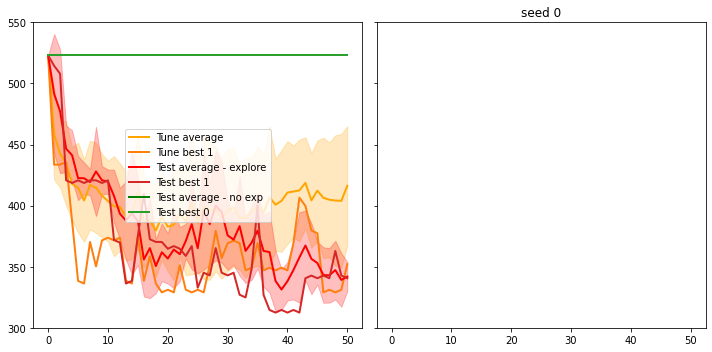

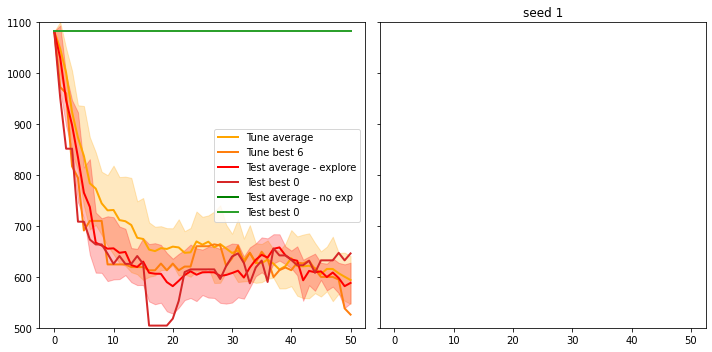

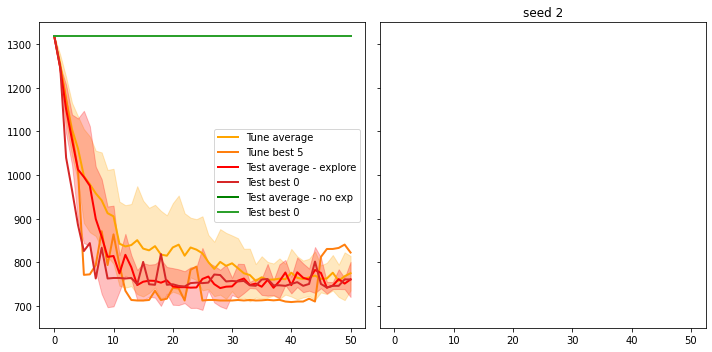

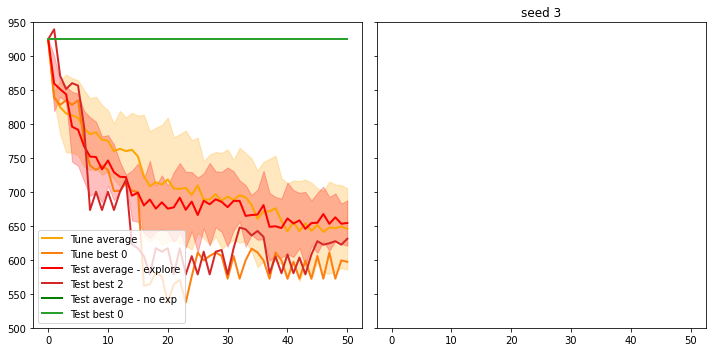

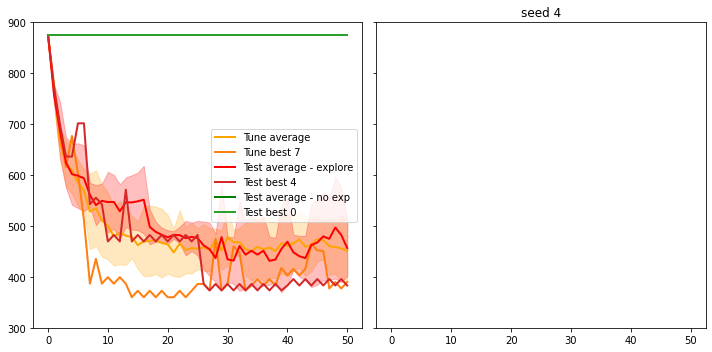

In [28]:
from os import listdir
from os.path import isfile, join
data_dir = 'data'
sub_dir = 'N_20_P_10_10P_diff_init'
data_folder = join(data_dir, sub_dir)
record = pickle.load(open(join(data_folder, 'full_graph_2022-04-20_15-51-32_train.pk'), 'rb'))

file_names = [join(data_folder, f) for f in listdir(data_folder) if isfile(join(data_folder, f))]

y_range = {
    0: (300, 550),
    1: (500, 1100),
    2: (650, 1350),
    3: (500, 950),
    4: (300, 900)
}

for i in range(5):
    fig, ax = plt.subplots(1, 2, figsize=(10,5), sharey=True, sharex=True)
    
#     train_date = list(filter(lambda data: data['seed'] == i, record))
#     lat_train = np.array([episode['latency_trace'] for episode in train_date])
#     average = np.average(lat_train, axis=0)
#     var = np.std(lat_train, axis=0)

#     factor = np.array([0.95 ** i for i in range(50)])
#     diff = -np.diff(lat_train)
#     re = diff @ factor

#     ax[0].plot(range(lat_train.shape[1]), average, label="Train average", color='blue', linewidth=2)
#     ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Train best {np.argmax(re)}", color='tab:blue',
#              linewidth=2)
#     ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
    

    tune_data = f'id_{i}_tune'
    test1_data = f'id_{i}_test_exp'
    test2_data = f'id_{i}_test_no_exp'
    
    for f in file_names:
        if tune_data in f:
            tune_data = f
            continue
        if test1_data in f:
            test1_data = f
            continue
        if test2_data in f:
            test2_data = f
            continue

    record_test = pickle.load(open(tune_data, 'rb'))
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[0].plot(range(lat_train.shape[1]), average, label="Tune average", color='orange', linewidth=2)
    ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Tune best {np.argmax(re)}", color='tab:orange',
             linewidth=2)
    ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='orange')
    
    
    record_test = pickle.load(open(test1_data, 'rb'))
    
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[0].plot(range(lat_train.shape[1]), average, label="Test average - explore", color='red', linewidth=2)
    ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best {np.argmax(re)}", color='tab:red',
             linewidth=2)
    ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
    
    record_test = pickle.load(open(test2_data, 'rb'))
    
    lat_test = [episode['latency_trace'] for episode in record_test]
    lat_train = np.array(lat_test)
    average = np.average(lat_train, axis=0)
    var = np.std(lat_train, axis=0)

    factor = np.array([0.95 ** i for i in range(50)])
    diff = -np.diff(lat_train)
    re = diff @ factor

    ax[0].plot(range(lat_train.shape[1]), average, label="Test average - no exp", color='green', linewidth=2)
    ax[0].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best {np.argmax(re)}", color='tab:green',
             linewidth=2)
    ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='green')

    ax[0].legend()
    ax[0].set_ylim(y_range[i])
#     ax[1].legend()
    plt.title(f'seed {i}')
    fig.tight_layout()
    plt.savefig(join(data_folder, f'Program {i}.png'))
    plt.show()


In [92]:
logdir='runs/2022-04-27_00-44-13_unseen_pair_random'
file_names = [f for f in listdir(logdir) if isfile(join(logdir, f))]

test_cases = {}
for f in file_names:
    if 'test' in f:
        n = f[:-3].split('_')
        seed, network, program = int(n[-1]), int(n[-3]), int(n[-5])
        if program in test_cases:
            if network in test_cases[program]:
                if seed not in test_cases[program][network]:
                    test_cases[program][network].append(seed)
            else:
                test_cases[program][network] = [seed]
        else:
            test_cases[program] = {}
            test_cases[program][network] = [seed]

data_id = pickle.load(open(join(logdir, 'data_para.pkl'), 'rb'))
eval_data = pickle.load(open(join(logdir, 'eval.pk'), 'rb'))
train_data = pickle.load(open(join(logdir, 'train.pk'), 'rb'))


            

P9, N0, S0


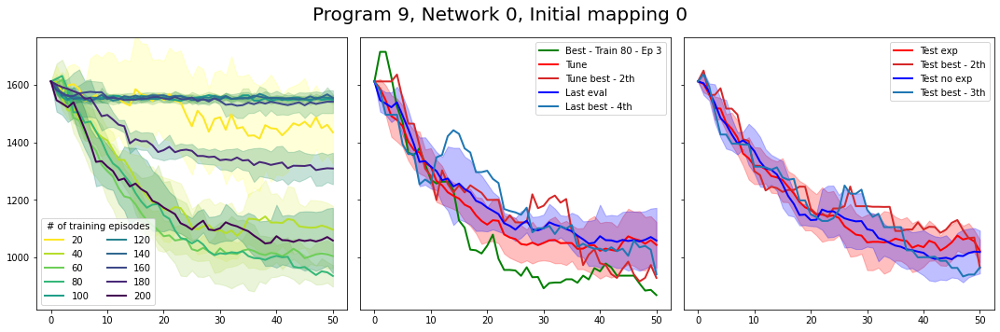

P8, N0, S0


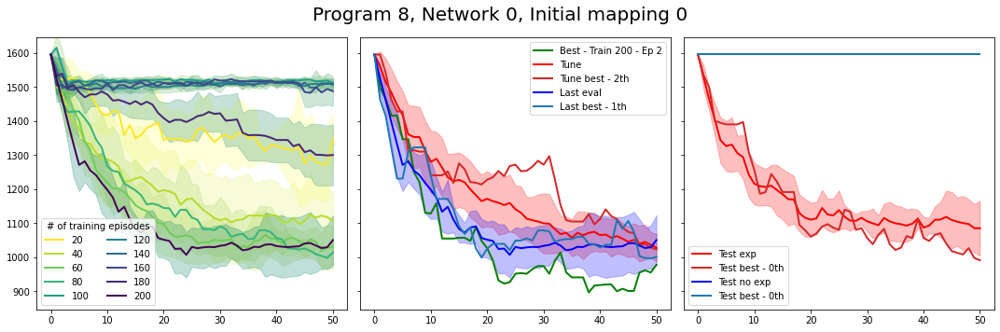

P0, N0, S0


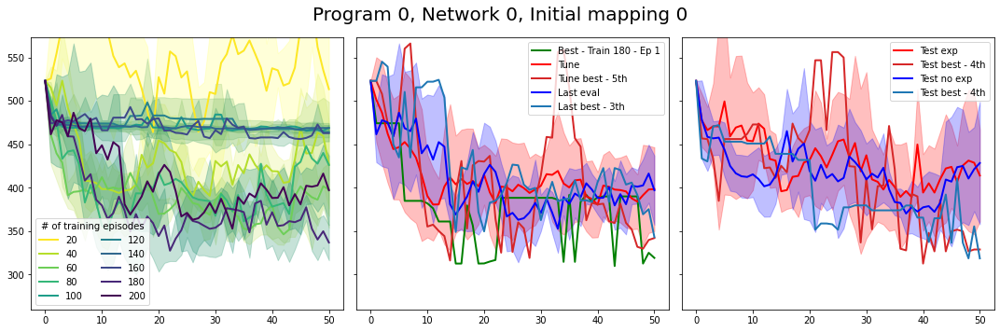

P1, N0, S0


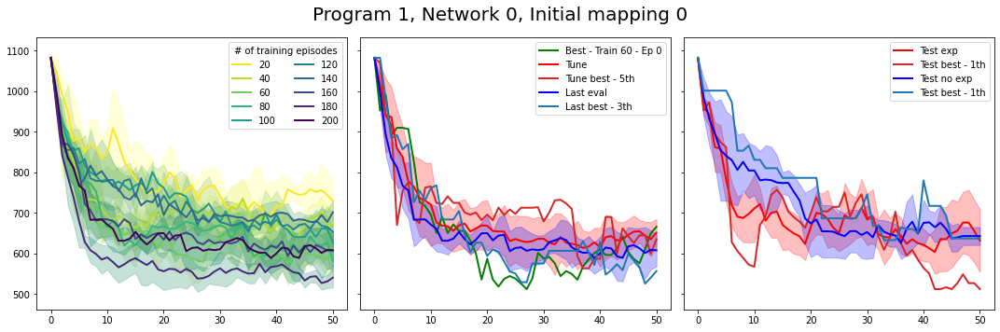

P2, N0, S0


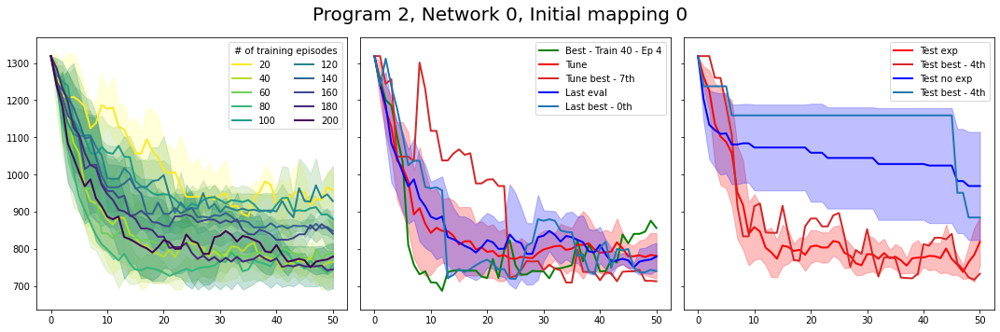

P3, N0, S0


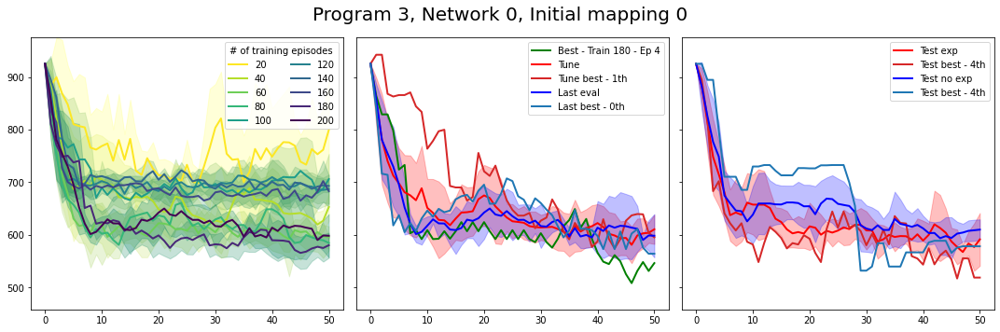

P5, N0, S0


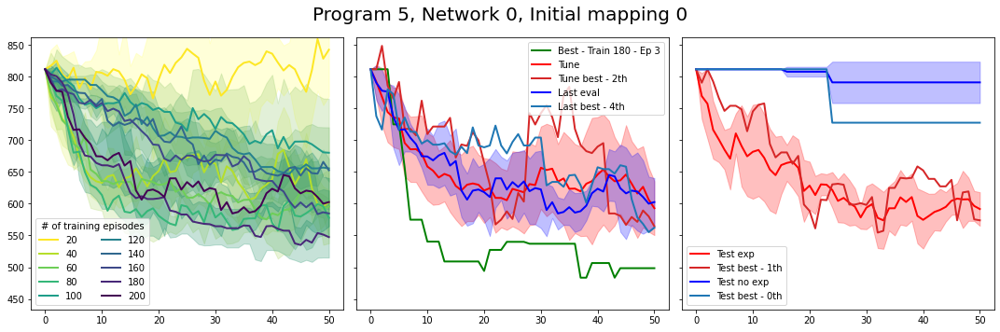

P13, N0, S0


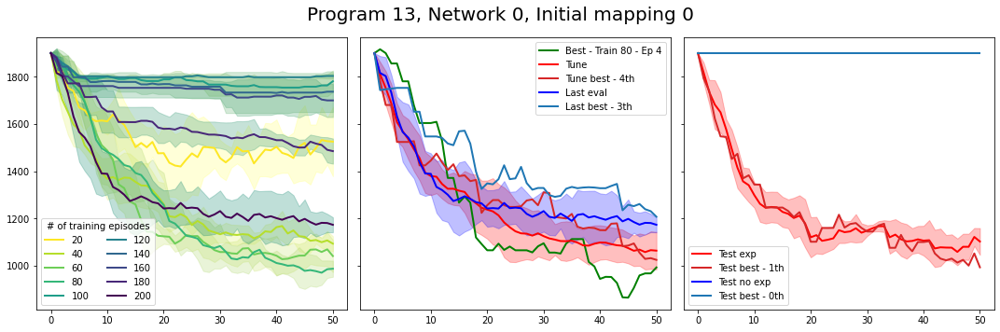

P12, N0, S0


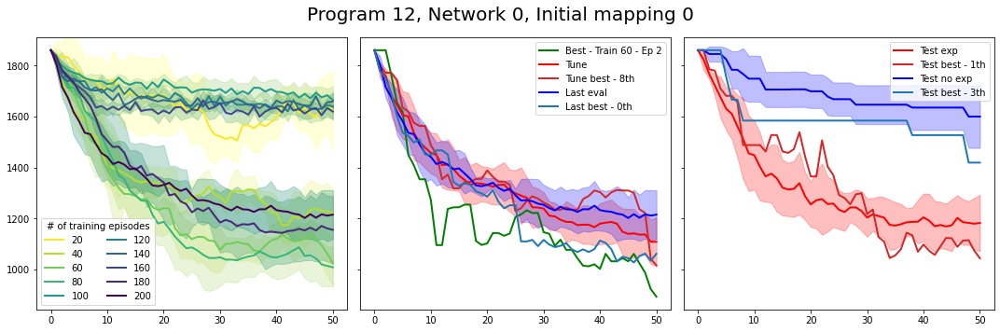

P4, N0, S0


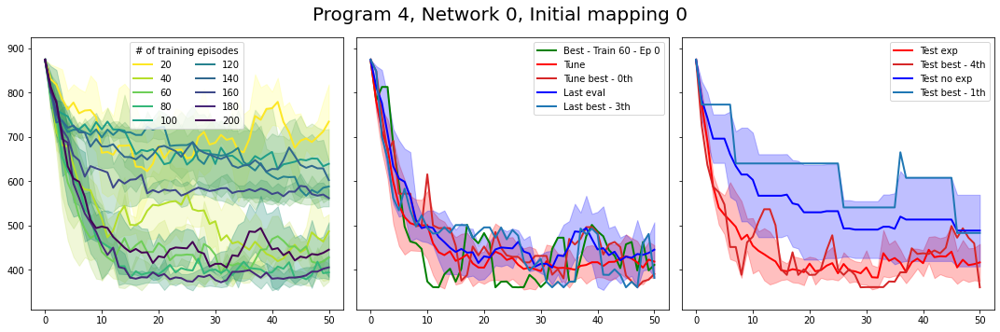

P11, N0, S0


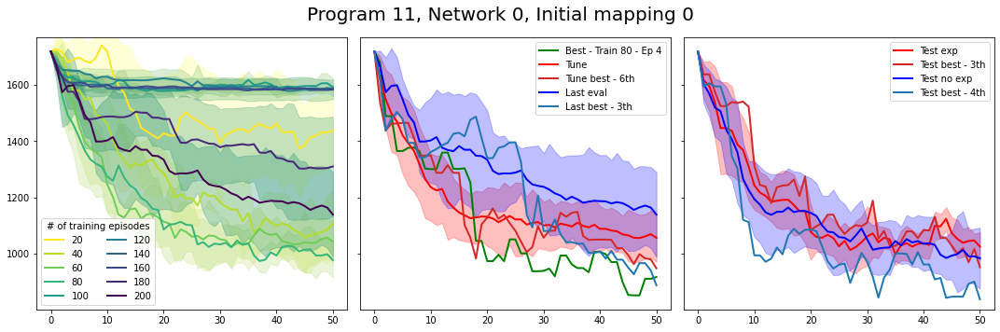

P7, N0, S0


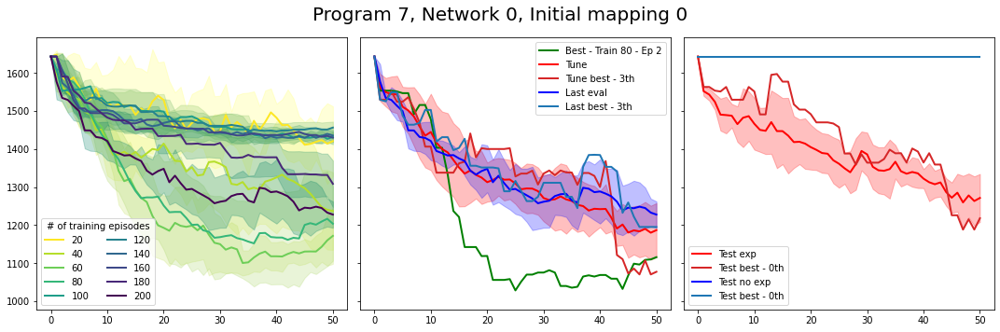

P6, N0, S0


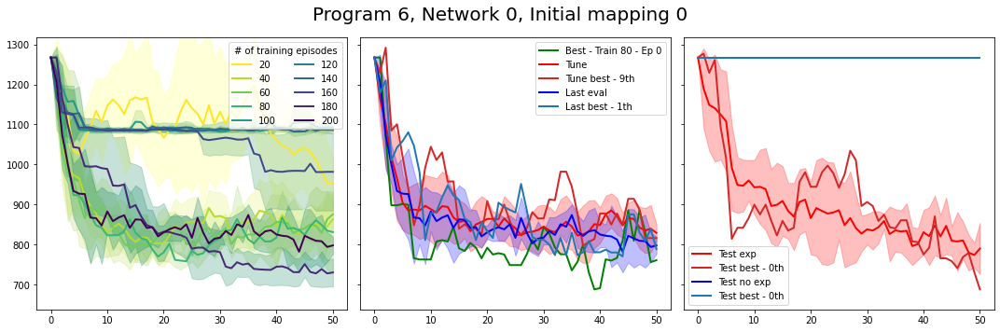

P10, N0, S0


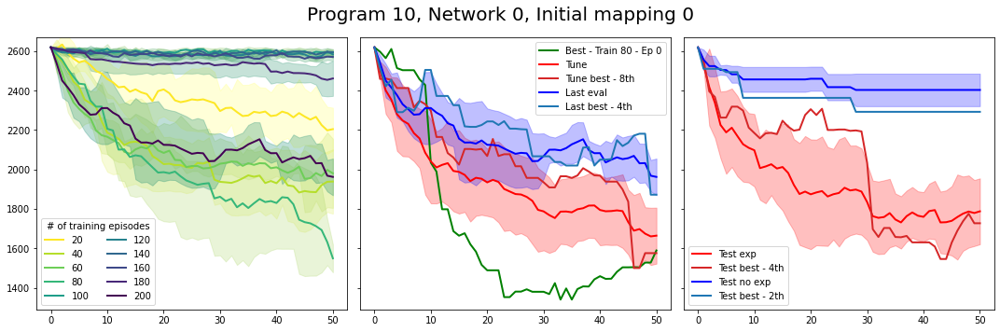

In [88]:
test_programs = data_id['test_program']
test_networks = data_id['test_network']

train_programs = data_id['train_program']
train_networks = data_id['train_network']



for test_program in test_cases:
    for test_network in test_cases[test_program]:
        for init_seed in test_cases[test_program][test_network]:
            print(f'P{test_program}, N{test_network}, S{init_seed}')
            fig, ax = plt.subplots(1,3, figsize=(15,5), sharex=True, sharey=True)
            e = [list(filter(lambda episode: 
                             episode['network_id'] == test_network and
                             episode['program_id'] == test_program and
                             episode['init_seed'] == init_seed, record)) for record in eval_data]
            latency = [[a['latency_trace'] for a in r] for r in e]
            reward = [[a['ep_return'] for a in r] for r in e]
            color_idx = np.linspace(0, 1, len(latency))
            legend = np.linspace(20, 200, len(latency)).astype(int)
            
            best_trace = latency[0][0]
            best_latency = np.amin(best_trace)
            best_label = f'Train 20 - Ep 1'
            for i, label, trace, rewards in zip(color_idx, legend, latency, reward):
                lat_train = np.array(trace)
                average = np.average(lat_train, axis=0)
                var = np.std(lat_train, axis=0)
                ax[0].plot(range(lat_train.shape[1]), average, linewidth=2, color=plt.cm.viridis_r(i), label=label)
                ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color=plt.cm.summer_r(i))
                
                cur_best = np.amin(lat_train)
                if cur_best < best_latency:
                    idx = np.where(lat_train==cur_best)
                    best_label = f'Train {label} - Ep {idx[0][0]}'
                    best_trace = trace[idx[0][0]]
                    best_latency = cur_best
                    
            leg = ax[0].legend(ncol=2)
            leg.set_title('# of training episodes')
            
            
            ax[1].plot(range(lat_train.shape[1]), best_trace, linewidth=2, color='green', label=f'Best - {best_label}')
            
            tune_data = f'tune_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            test_e = f'test_explore_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            test_n = f'test_noexp_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            
            
            tune_data = pickle.load(open(join(logdir, tune_data), 'rb'))
            test_e = pickle.load(open(join(logdir, test_e), 'rb'))
            test_n = pickle.load(open(join(logdir, test_n), 'rb'))
            
            lat_test = [episode['latency_trace'] for episode in tune_data]
            re = [a['ep_return'] for a in tune_data]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[1].plot(range(lat_train.shape[1]), average, linewidth=2, color='red', label='Tune')
            ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
            ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Tune best - {np.argmax(re)}th", color='tab:red',
             linewidth=2)
            
            lat_test = latency[-1]
            re = reward[-1]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[1].plot(range(lat_train.shape[1]), average, linewidth=2, color='blue', label='Last eval')
            ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
            ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Last best - {np.argmax(re)}th", color='tab:blue',
             linewidth=2)
            
            
            ax[1].legend()
            
            lat_test = [episode['latency_trace'] for episode in test_e]
            re = [a['ep_return'] for a in test_e]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[2].plot(range(lat_train.shape[1]), average, linewidth=2, color='red', label='Test exp')
            ax[2].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
            ax[2].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best - {np.argmax(re)}th", color='tab:red',
             linewidth=2)
            
            ax[2].set_ylim([np.amin(best_trace)-50, np.amax(best_trace)+50])
            
            
            lat_test = [episode['latency_trace'] for episode in test_n]
            re = [a['ep_return'] for a in test_n]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[2].plot(range(lat_train.shape[1]), average, linewidth=2, color='blue', label='Test no exp')
            ax[2].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
            ax[2].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best - {np.argmax(re)}th", color='tab:blue',
             linewidth=2)
            
            ax[2].legend()
            

            
            n_operators = test_programs[test_program]['n_operators']
            n_devices = test_programs[test_program]['n_devices']
            program_seed = test_programs[test_program]['seed']
            network_seed = test_networks[test_network]['seed']
                        
            t_programs = list(dict(filter(lambda elem: elem[1]['n_operators'] == n_operators and
                                                 elem[1]['n_devices'] == n_devices and
                                                 elem[1]['seed'] == program_seed, train_programs.items())).keys())
            t_networks = list(dict(filter(lambda elem: elem[1]['seed'] == network_seed and
                                                 elem[1]['n_devices'] == n_devices, train_networks.items())).keys())

            
            fig.suptitle(f'Program {test_program}, Network {test_network}, Initial mapping {init_seed}', fontsize=20)
            fig.tight_layout()
            plt.savefig(join(logdir, f'program_{test_program}_init_{init_seed}.jpg'))
            plt.show()
            

            

In [89]:
logdir='runs/2022-04-22_04-28-10_P_10_20_MAP_3_EP_10'
file_names = [f for f in listdir(logdir) if isfile(join(logdir, f))]

test_cases = {}
for f in file_names:
    if 'test' in f:
        n = f[:-3].split('_')
        seed, network, program = int(n[-1]), int(n[-3]), int(n[-5])
        if program in test_cases:
            if network in test_cases[program]:
                if seed not in test_cases[program][network]:
                    test_cases[program][network].append(seed)
            else:
                test_cases[program][network] = [seed]
        else:
            test_cases[program] = {}
            test_cases[program][network] = [seed]

data_id = pickle.load(open(join(logdir, 'data_id.pkl'), 'rb'))
eval_data = pickle.load(open(join(logdir, 'eval.pk'), 'rb'))
train_data = pickle.load(open(join(logdir, 'train.pk'), 'rb'))



P13, N0, S2


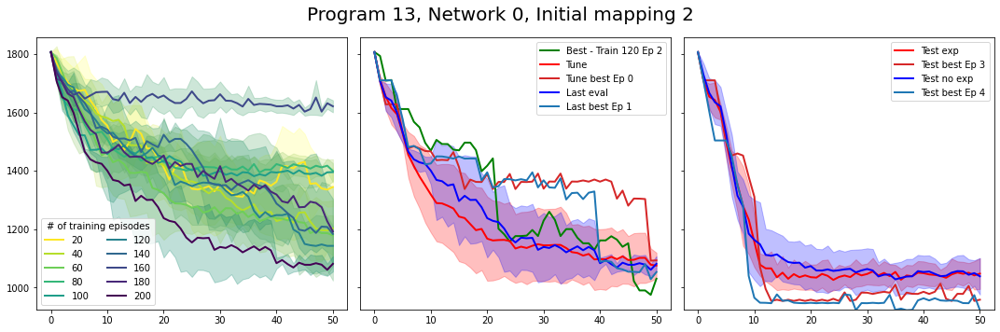

P13, N0, S3


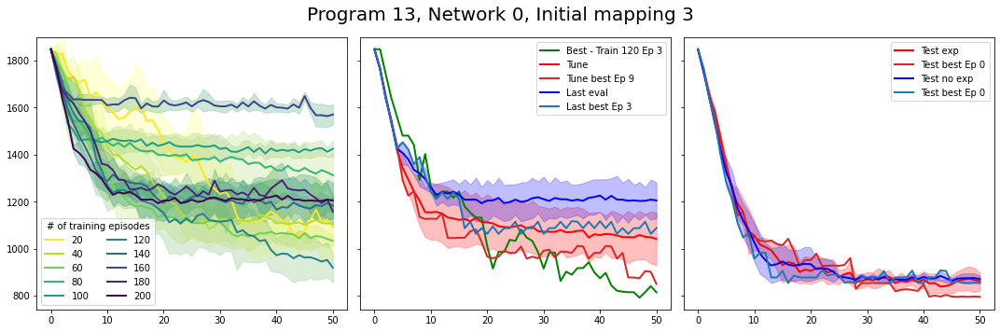

P13, N0, S0


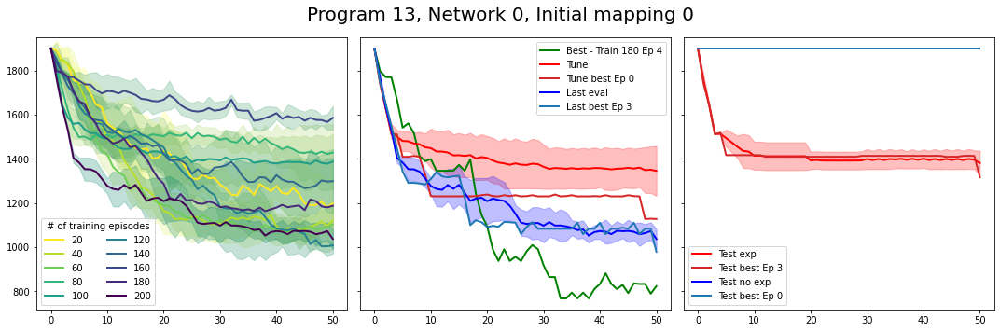

P12, N0, S2


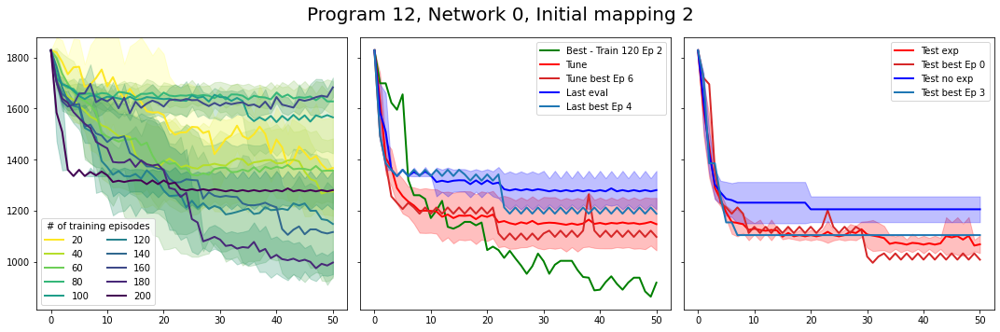

P12, N0, S3


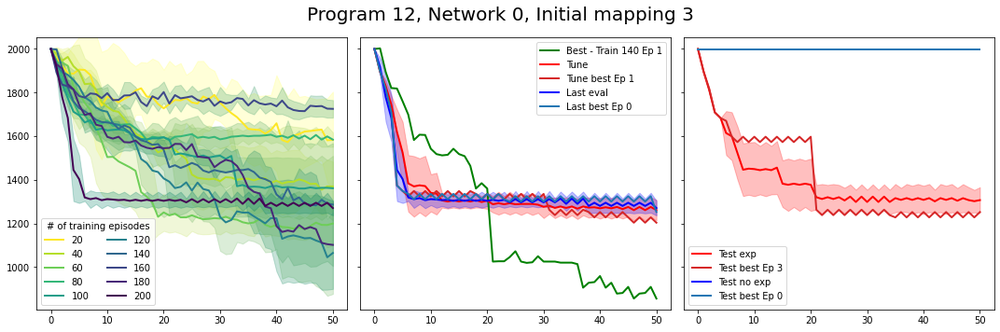

P12, N0, S0


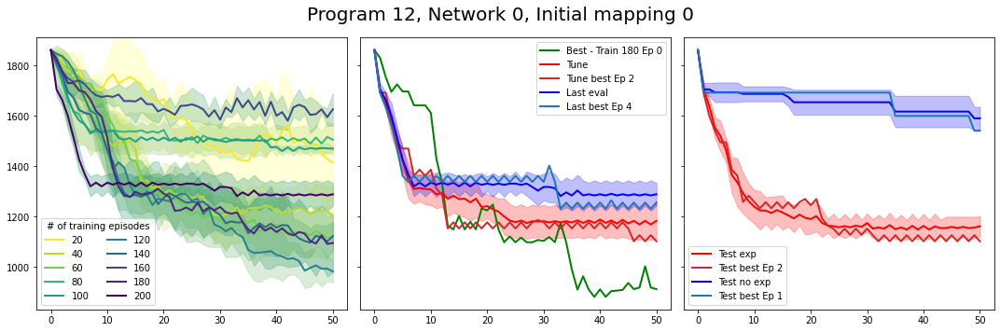

P9, N0, S0


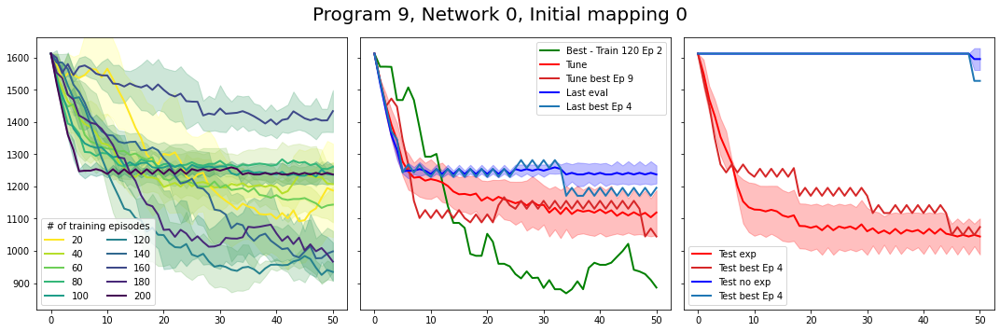

P9, N0, S3


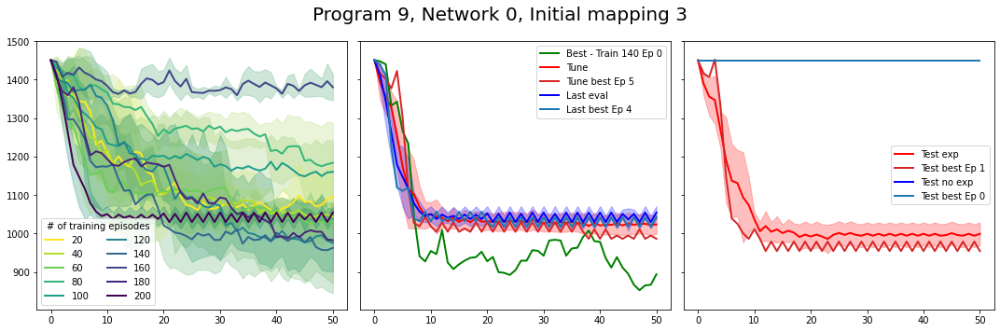

P9, N0, S2


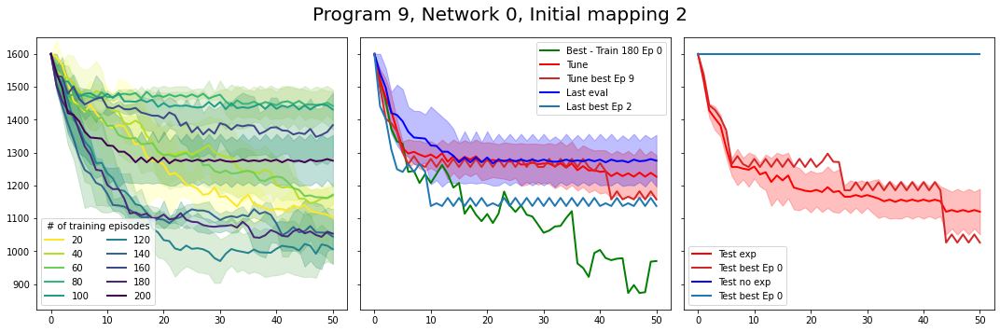

P11, N0, S2


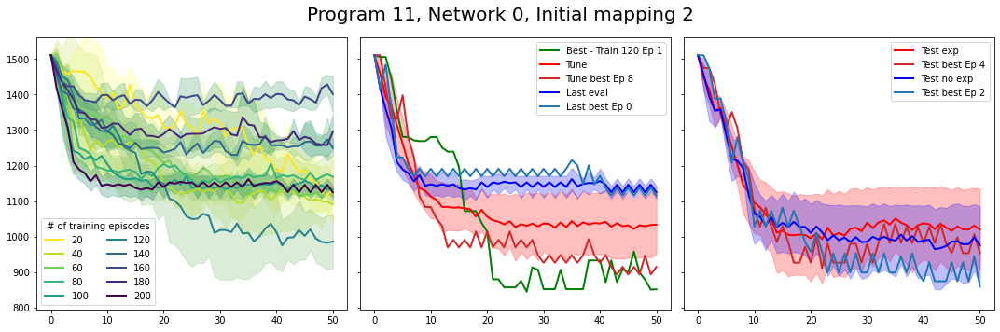

P11, N0, S3


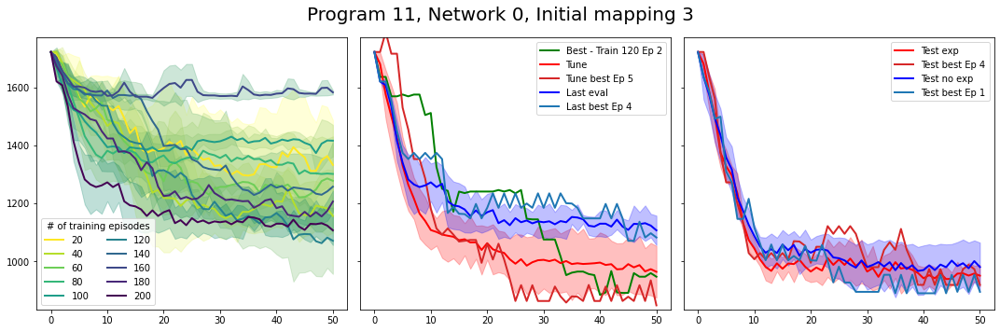

P11, N0, S0


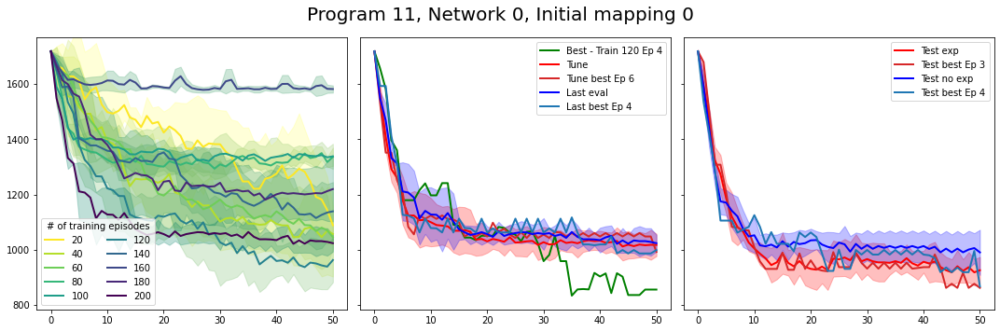

P8, N0, S0


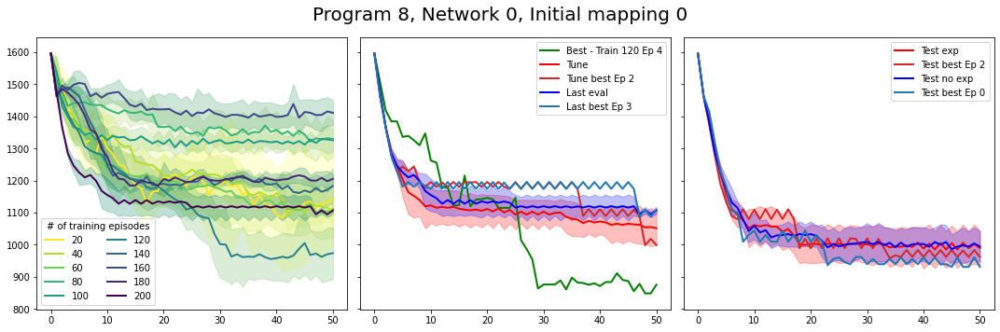

P8, N0, S3


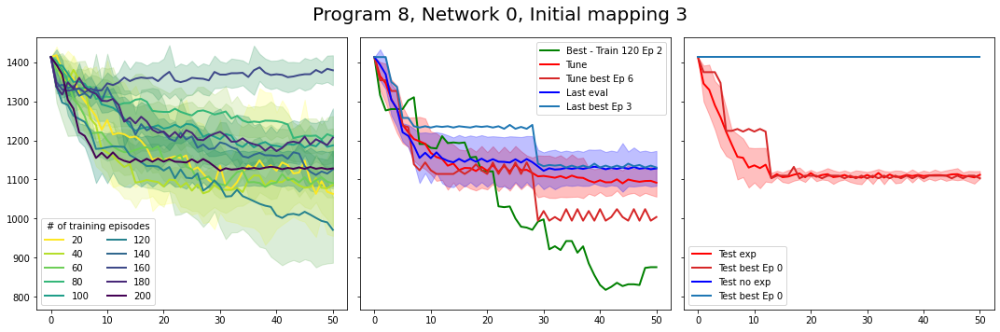

P8, N0, S2


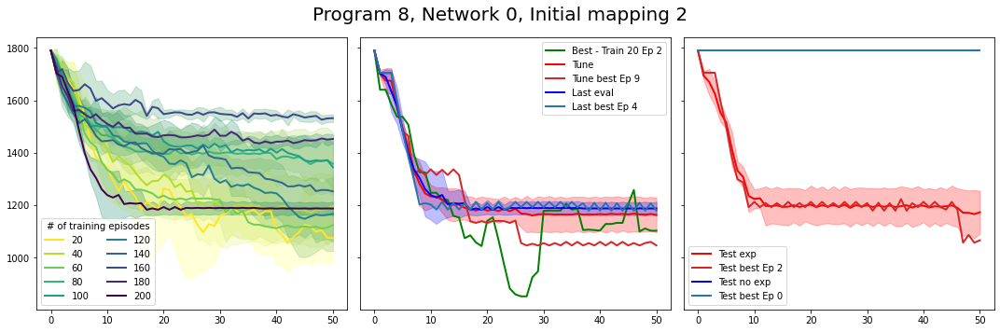

P10, N0, S2


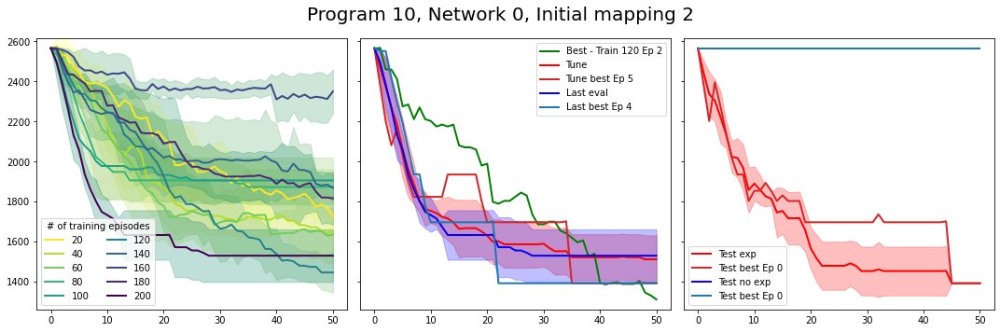

P10, N0, S3


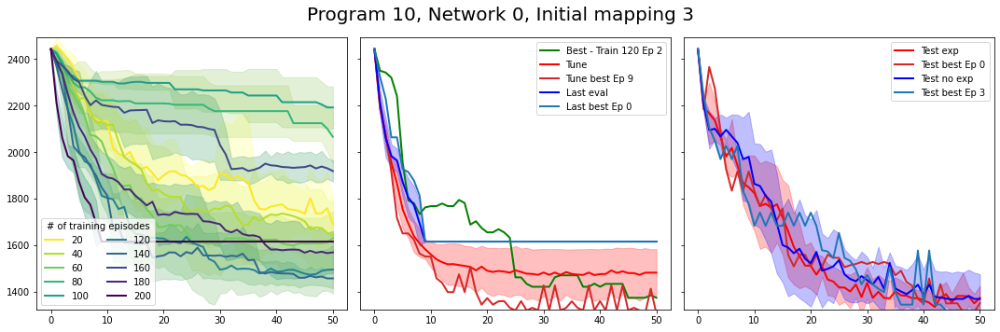

P10, N0, S0


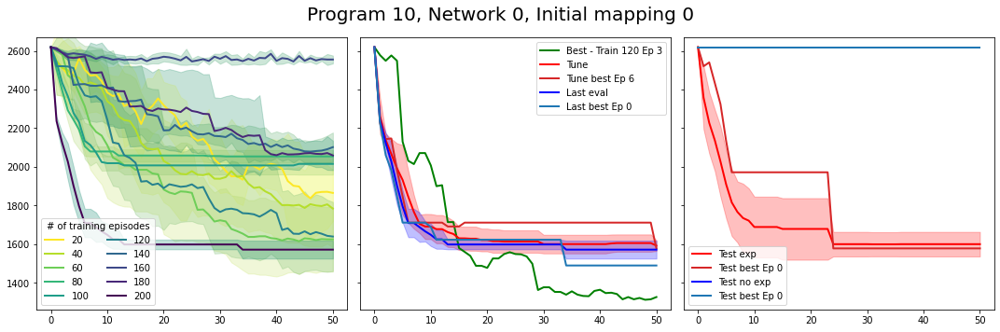

P0, N0, S0


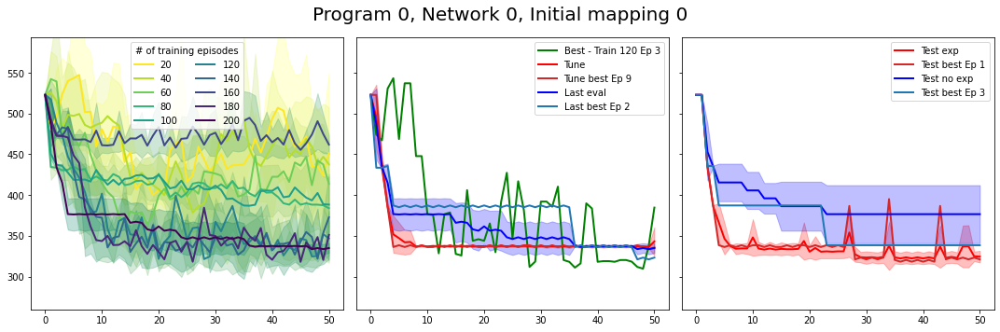

P0, N0, S3


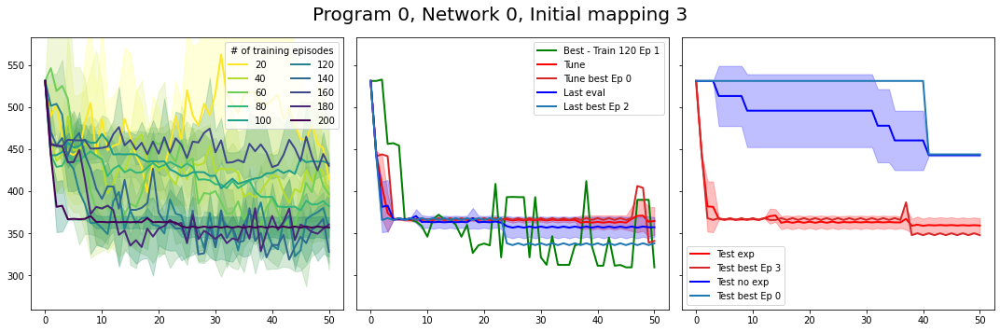

P0, N0, S2


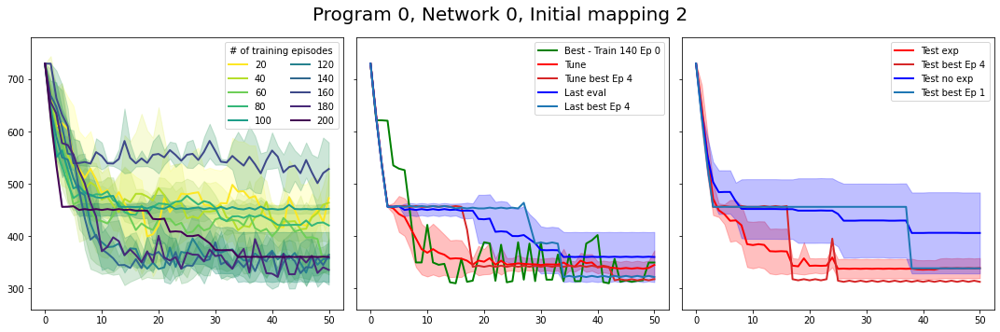

P7, N0, S2


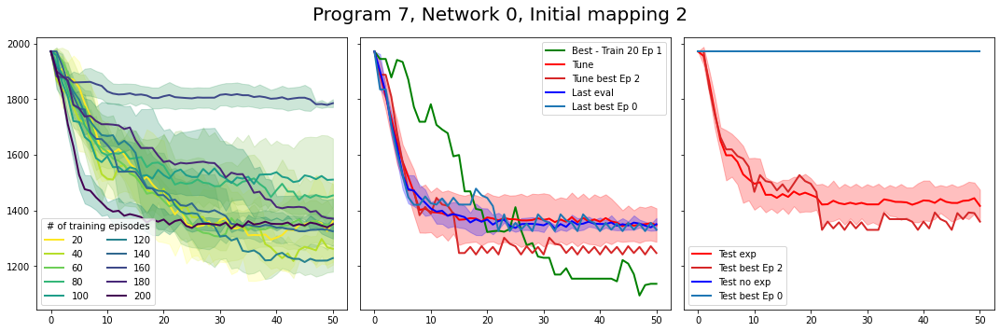

P7, N0, S0


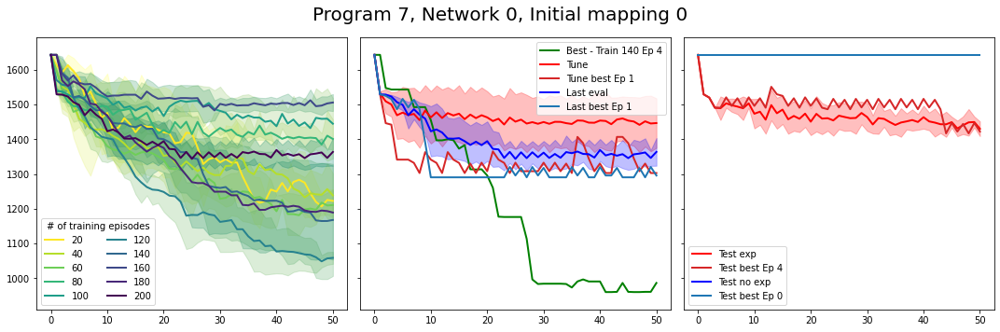

P7, N0, S3


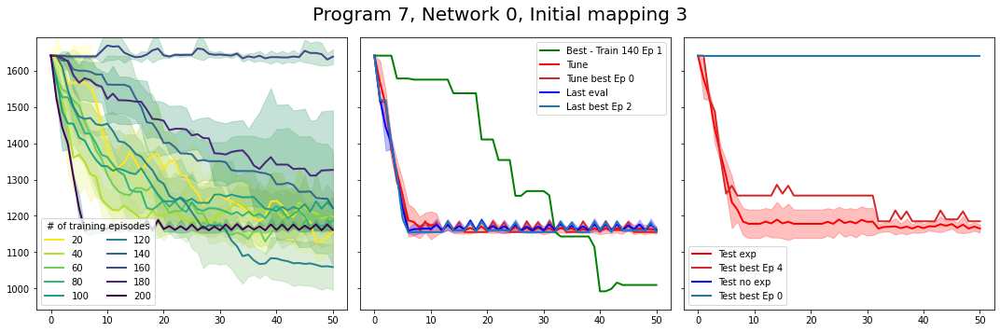

P1, N0, S0


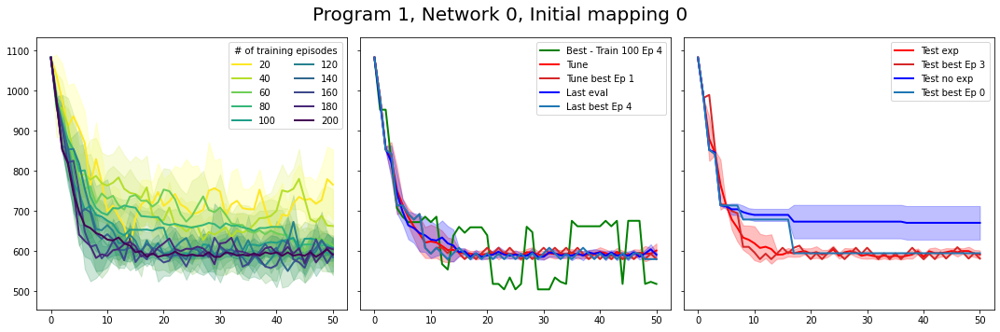

P1, N0, S3


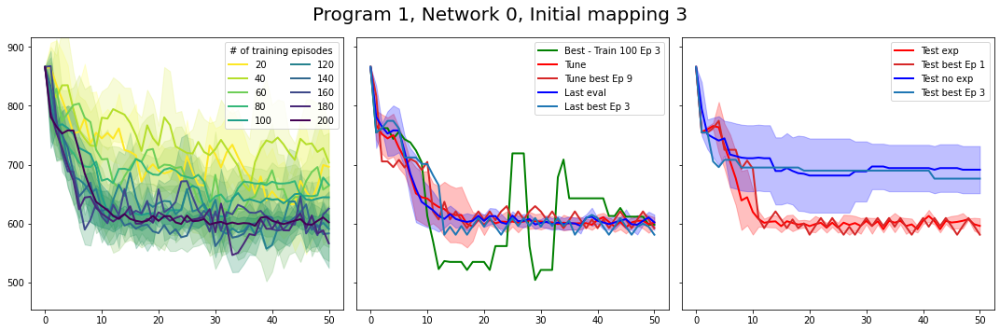

P1, N0, S2


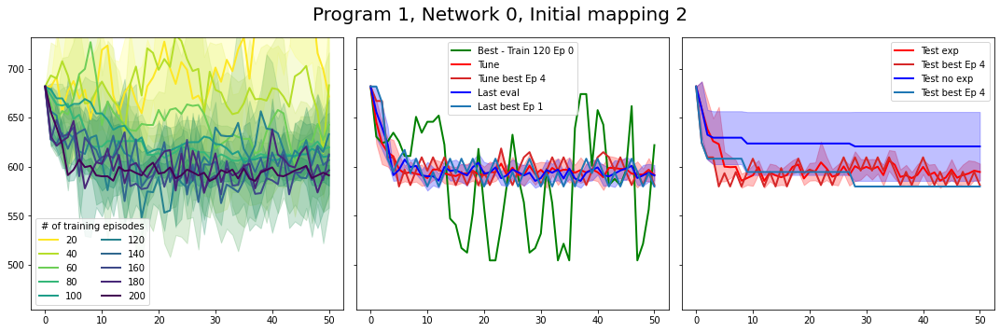

P6, N0, S2


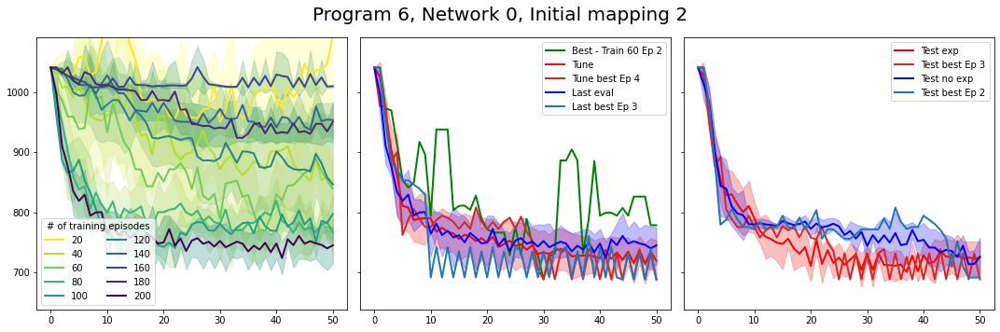

P6, N0, S0


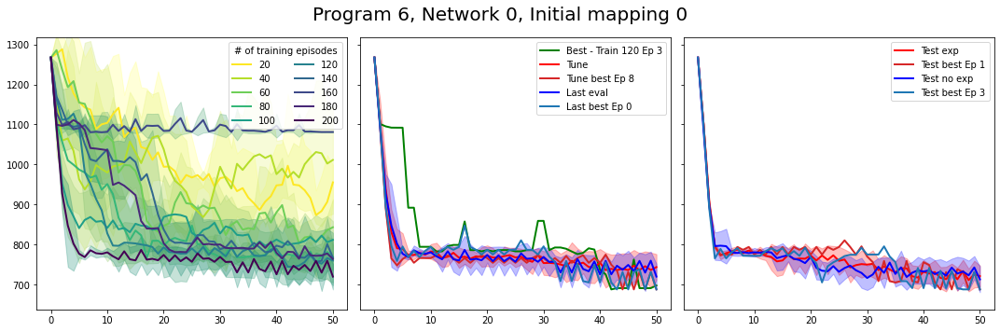

P6, N0, S3


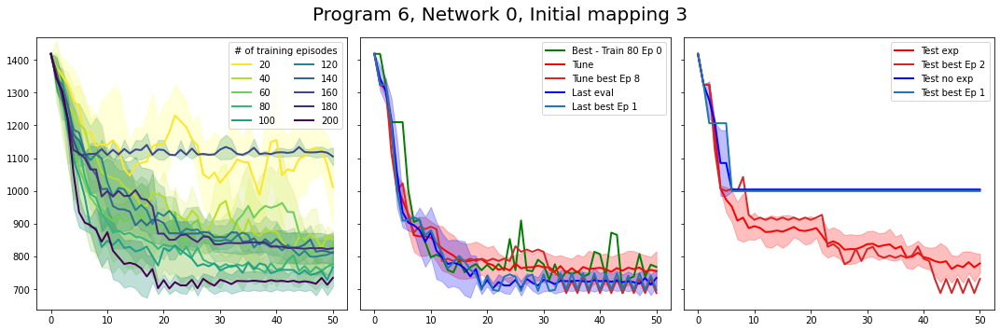

P5, N0, S2


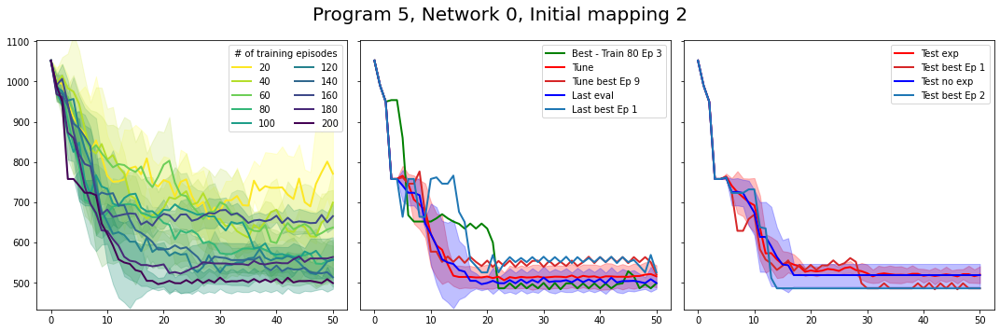

P5, N0, S3


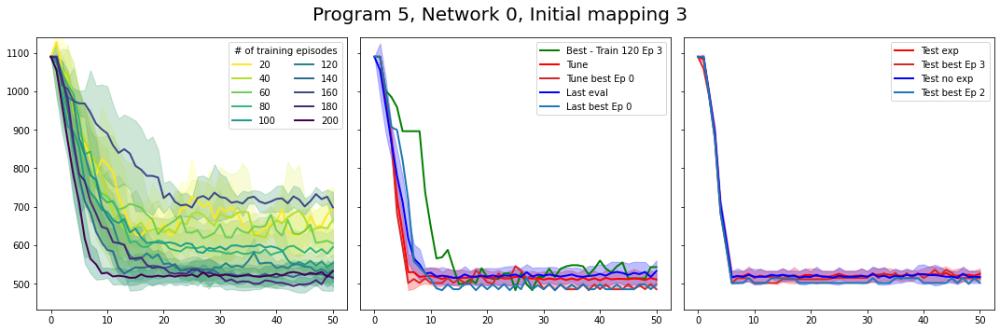

P5, N0, S0


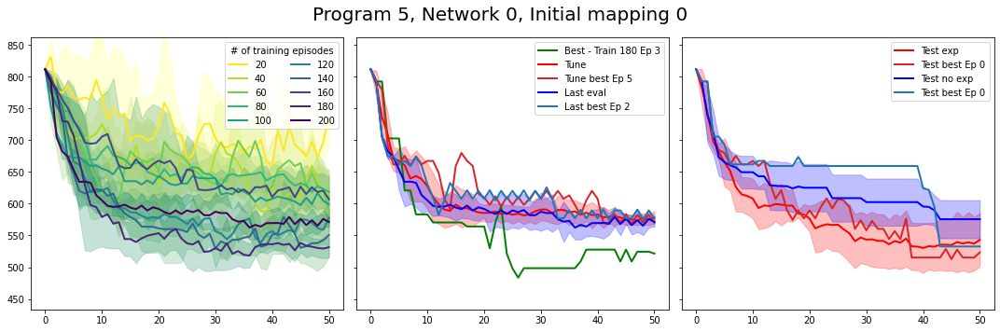

P2, N0, S3


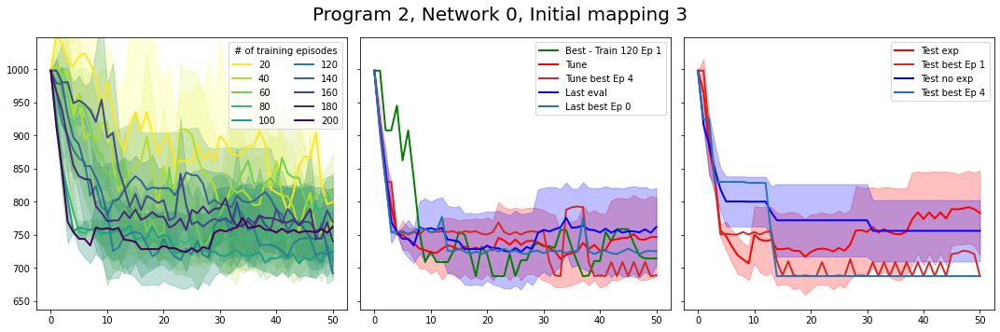

P2, N0, S0


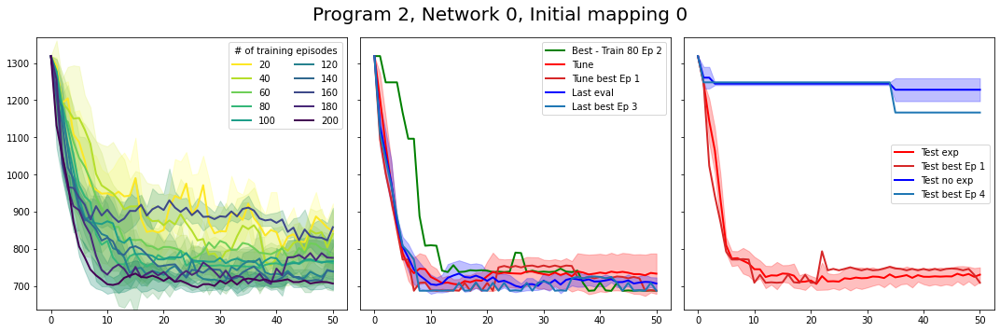

P2, N0, S2


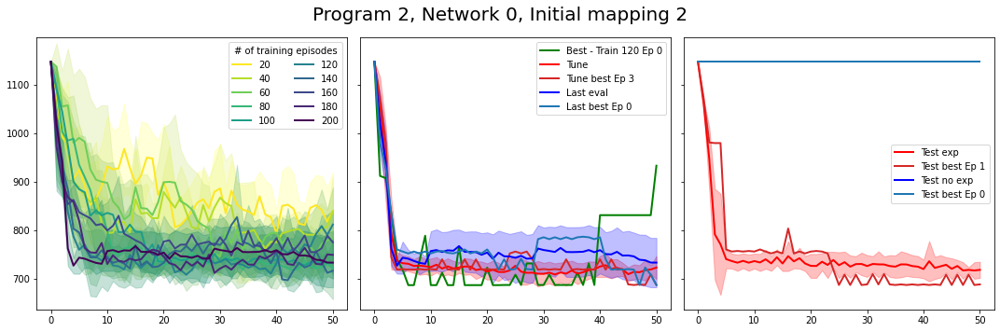

P3, N0, S3


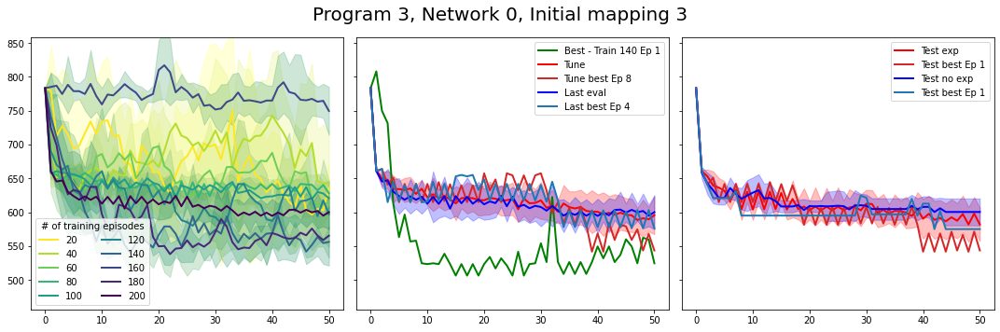

P3, N0, S0


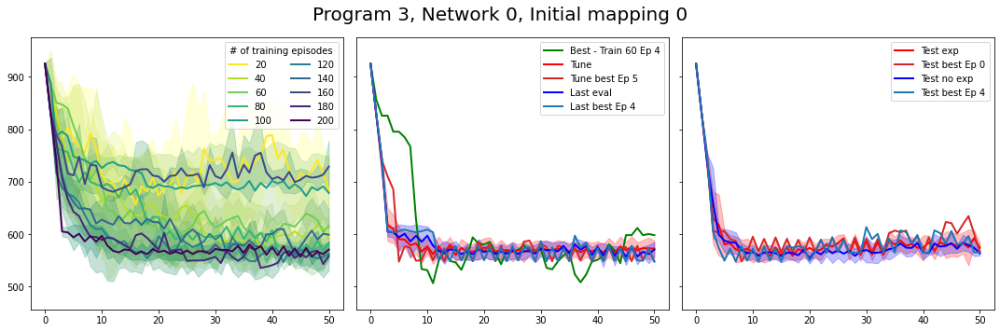

P3, N0, S2


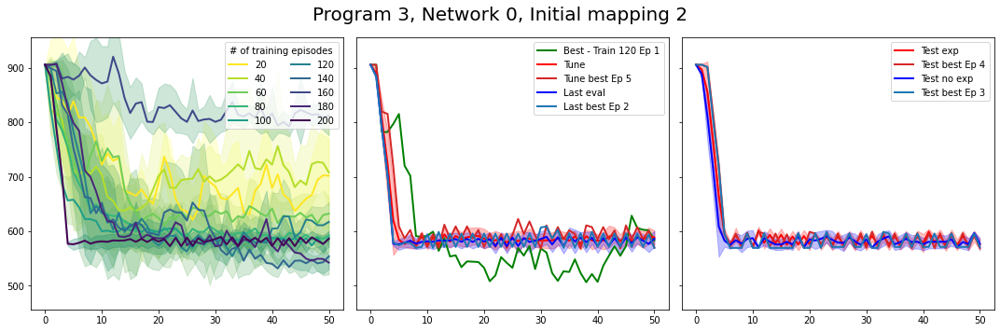

P4, N0, S2


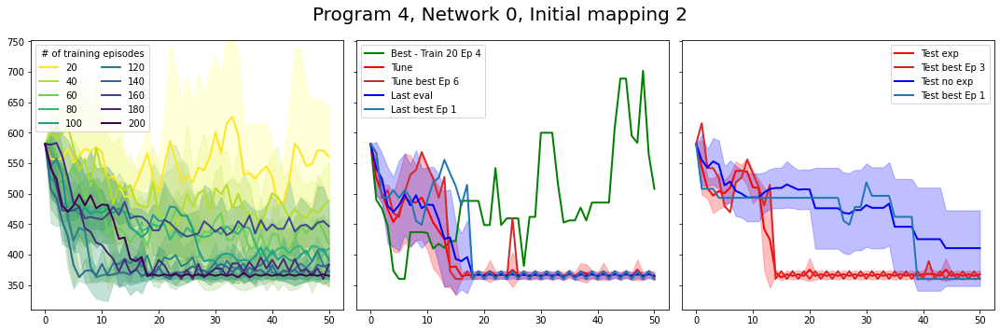

P4, N0, S3


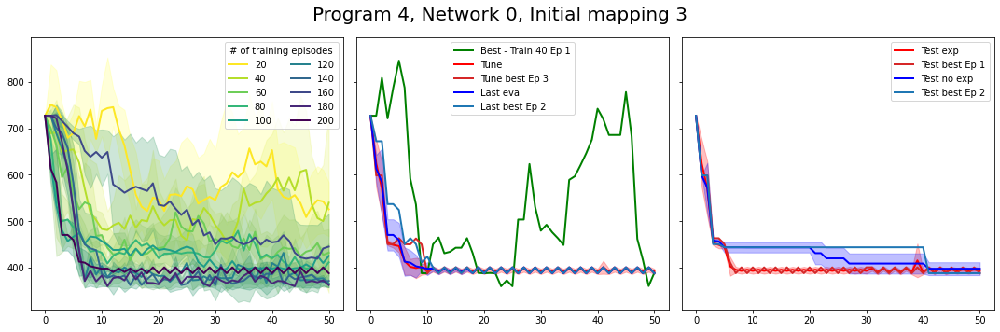

P4, N0, S0


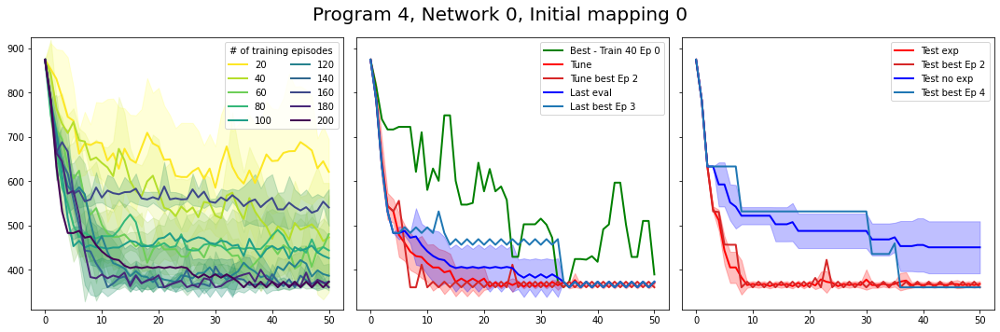

In [91]:
test_programs = data_id['test_program']
test_networks = data_id['test_network']

train_programs = data_id['train_program']
train_networks = data_id['train_network']



for test_program in test_cases:
    for test_network in test_cases[test_program]:
        for init_seed in test_cases[test_program][test_network]:
            print(f'P{test_program}, N{test_network}, S{init_seed}')
            fig, ax = plt.subplots(1,3, figsize=(15,5), sharex=True, sharey=True)
            e = [list(filter(lambda episode: 
                             episode['network_id'] == test_network and
                             episode['program_id'] == test_program and
                             episode['init_seed'] == init_seed, record)) for record in eval_data]
            latency = [[a['latency_trace'] for a in r] for r in e]
            reward = [[a['ep_return'] for a in r] for r in e]
            color_idx = np.linspace(0, 1, len(latency))
            legend = np.linspace(20, 200, len(latency)).astype(int)
            
            best_trace = latency[0][0]
            best_latency = np.amin(best_trace)
            best_label = f'Train 20 - Ep 1'
            for i, label, trace, rewards in zip(color_idx, legend, latency, reward):
                lat_train = np.array(trace)
                average = np.average(lat_train, axis=0)
                var = np.std(lat_train, axis=0)
                ax[0].plot(range(lat_train.shape[1]), average, linewidth=2, color=plt.cm.viridis_r(i), label=label)
                ax[0].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color=plt.cm.summer_r(i))
                
                cur_best = np.amin(lat_train)
                if cur_best < best_latency:
                    idx = np.where(lat_train==cur_best)
                    best_label = f'Train {label} Ep {idx[0][0]}'
                    best_trace = trace[idx[0][0]]
                    best_latency = cur_best
                    
            leg = ax[0].legend(ncol=2)
            leg.set_title('# of training episodes')
            
            
            ax[1].plot(range(lat_train.shape[1]), best_trace, linewidth=2, color='green', label=f'Best - {best_label}')
            
            tune_data = f'tune_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            test_e = f'test_explore_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            test_n = f'test_noexp_program_{test_program}_network_{test_network}_seed_{init_seed}.pk'
            
            
            tune_data = pickle.load(open(join(logdir, tune_data), 'rb'))
            test_e = pickle.load(open(join(logdir, test_e), 'rb'))
            test_n = pickle.load(open(join(logdir, test_n), 'rb'))
            
            lat_test = [episode['latency_trace'] for episode in tune_data]
            re = [a['ep_return'] for a in tune_data]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[1].plot(range(lat_train.shape[1]), average, linewidth=2, color='red', label='Tune')
            ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
            ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Tune best Ep {np.argmax(re)}", color='tab:red',
             linewidth=2)
            
            lat_test = latency[-1]
            re = reward[-1]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[1].plot(range(lat_train.shape[1]), average, linewidth=2, color='blue', label='Last eval')
            ax[1].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
            ax[1].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Last best Ep {np.argmax(re)}", color='tab:blue',
             linewidth=2)
            
            
            ax[1].legend()
            
            lat_test = [episode['latency_trace'] for episode in test_e]
            re = [a['ep_return'] for a in test_e]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[2].plot(range(lat_train.shape[1]), average, linewidth=2, color='red', label='Test exp')
            ax[2].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='red')
            ax[2].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best Ep {np.argmax(re)}", color='tab:red',
             linewidth=2)
            
            ax[2].set_ylim([np.amin(best_trace)-50, np.amax(best_trace)+50])
            
            
            lat_test = [episode['latency_trace'] for episode in test_n]
            re = [a['ep_return'] for a in test_n]
            lat_train = np.array(lat_test)
            average = np.average(lat_train, axis=0)
            var = np.std(lat_train, axis=0)
            
            ax[2].plot(range(lat_train.shape[1]), average, linewidth=2, color='blue', label='Test no exp')
            ax[2].fill_between(range(lat_train.shape[1]), average + var, average - var, alpha=.25, color='blue')
            ax[2].plot(range(lat_train.shape[1]), lat_train[np.argmax(re)], label=f"Test best Ep {np.argmax(re)}", color='tab:blue',
             linewidth=2)
            
            ax[2].legend()
            

            
            n_operators = test_programs[test_program]['n_operators']
            n_devices = test_programs[test_program]['n_devices']
            program_seed = test_programs[test_program]['seed']
            network_seed = test_networks[test_network]['seed']
                        
            t_programs = list(dict(filter(lambda elem: elem[1]['n_operators'] == n_operators and
                                                 elem[1]['n_devices'] == n_devices and
                                                 elem[1]['seed'] == program_seed, train_programs.items())).keys())
            t_networks = list(dict(filter(lambda elem: elem[1]['seed'] == network_seed and
                                                 elem[1]['n_devices'] == n_devices, train_networks.items())).keys())

            
            fig.suptitle(f'Program {test_program}, Network {test_network}, Initial mapping {init_seed}', fontsize=20)
            fig.tight_layout()
            plt.savefig(join(logdir, f'program_{test_program}_init_{init_seed}.jpg'))
            plt.show()
            

            

In [93]:
logdir='runs/2022-04-22_04-28-10_P_10_20_MAP_3_EP_10'
args = pickle.load(open(join(logdir, 'args.pkl'), 'rb'))
print(args)

Namespace(application_graph_seeds_testing=[0, 1, 2, 3, 4, 5, 6], application_graph_seeds_training=[0, 1, 2, 3, 4], cuda=False, eval=True, gamma=0.97, hidden_dim=64, init_mapping_seeds_testing=[0, 2, 3], init_mapping_seeds_training=[0, 1], logdir='runs', logdir_suffix='P_10_20_MAP_3_EP_10', lr=0.01, max_iterations_per_episode=50, noise=0, num_devices_testing=[20], num_devices_training=[20], num_episodes_per_setting=10, num_operators_testing=[10, 20], num_operators_training=[10, 20], num_training_episodes=1000, output_dim=10, testing_episodes=5, tuning_spisodes=10, use_op_selection=False)
